# YOLOv8 for pear-tree leaves disease detection with quantized OpenVINO inference




## Prerequisites

- Install necessary packages from [ultralytics requirements](https://github.com/ultralytics/ultralytics)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
%pip install -q -U ultralytics "ray[tune]"

In [ ]:
%pip install -q onnx
%pip install -q "openvino>=2023.1.0" "nncf>=2.5.0"
%pip install -q openvino-dev
%pip install -q gymnasium

In [ ]:
%pip install tqdm --upgrade

In [ ]:
%cd '/content/drive/MyDrive/yolo'
# %pip install -r './requirements.txt'

/content/drive/MyDrive/yolo


## Import libraries

In [ ]:
import os
import glob
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from natsort import natsorted
from pathlib import Path

In [ ]:
# os.chdir('/content/drive/MyDrive/yolo')
# %cd '/content/drive/MyDrive/yolo'

/content/drive/MyDrive/yolo


## Set up the experiment logger

In [ ]:
# #@title Select YOLOv8 Logger {run: 'auto'}
logger = 'Comet' #@param ['Comet', 'TensorBoard']
colab = False
if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init(project_name='yolov8-pear-leaves')
    # import comet_ml
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.7/586.7 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.8/252.8 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 514.7/514.7 kB 31.1 MB/s eta 0:00:00


## Data Extraction

The data used in this project is sourced from Zenodo "A Dataset for Diagnosis and Monitoring
Plant Disease" - DiaMOS Plant [(Fenu G and Malloci FM, 2017)](https://doi.org/.3390/agronomy11112107).


It contains images and annotations of:
- Pear fruit
- Leaves damage by slugs
- Healthy leaves
- Curly leaves
- Spotted leaves

For this piece of work will use the annoted leaves only.

In [ ]:
from utils.notebook_utils import download_file

In [ ]:
from zipfile import ZipFile

DATA_URL = "https://zenodo.org/records/5557313/files/Pear.zip"

OUT_DIR = Path('../datasets')
DATA_PATH = OUT_DIR / "Pear.zip"

if not DATA_PATH.exists():
    download_file(DATA_URL, DATA_PATH.name, DATA_PATH.parent)
if not Path('../datasets/Pear').exists():
    with ZipFile(DATA_PATH , "r") as zip_ref:
        zip_ref.extractall(f'{OUT_DIR}')
else:
    print('Dataset already downloaded and unzip')

Dataset already downloaded and unzip


In [ ]:
print('Dataset content:')
!ls  '../datasets/Pear/'

Dataset content:
annotation  fruits  leaves


In [ ]:
print('Files in annotations')
!ls '../datasets/Pear/annotation'

Files in annotations
csv  YOLO


In [ ]:
data = pd.read_csv('../datasets/Pear/annotation/csv/diaMOSPlant.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3005 entries, 0 to 3004
Data columns (total 1 columns):
 #   Column                                                                                            Non-Null Count  Dtype 
---  ------                                                                                            --------------  ----- 
 0   filename;healthy;pear_slug;leaf_spot;curl;severity_0;severity_1;severity_2;severity_3;severity_4  3005 non-null   object
dtypes: object(1)
memory usage: 23.6+ KB


In [ ]:
csv_cols = data.columns[0].split(';')
np_val = np.array([val[0].split(';') for val in data.values])
df = pd.DataFrame(columns=csv_cols, data=np_val)
df.head()

,filename,healthy,pear_slug,leaf_spot,curl,severity_0,severity_1,severity_2,severity_3,severity_4
0,u2.jpg,0,0,1,0,0,1,0,0,0
1,u4.jpg,0,0,1,0,0,1,0,0,0
2,u6.jpg,0,0,1,0,0,1,0,0,0
3,u8.jpg,0,0,1,0,0,0,1,0,0
4,u10.jpg,0,0,1,0,0,1,0,0,0


In [ ]:
for i in range(1,5):
   df[df.columns[i]] =  df[df.columns[i]].astype('int8')

In [ ]:
df[df.columns[1:5]].sum(axis=0)

healthy        43
pear_slug    2025
leaf_spot     883
curl           54
dtype: int64

In [ ]:
fruit_images = natsorted(glob.glob(f'{OUT_DIR}/Pear/fruits/*.jpg') )
leaves_images = natsorted(glob.glob(f'{OUT_DIR}/Pear/leaves/**/*.jpg'))
leaves_classes = natsorted(os.listdir(f'{OUT_DIR}/Pear/leaves/'))
print(f'Total fruit images: {len(fruit_images)}')
print(f'Total leaves images: {len(leaves_images)}')
print(f'Total leaves classes: {len(leaves_classes)}')

Total fruit images: 499
Total leaves images: 3006
Total leaves classes: 4


In [ ]:
leaves_classes

['curl', 'healthy', 'slug', 'spot']

In [ ]:
fruits_annot= glob.glob(f'{OUT_DIR}/Pear/annotation/YOLO/fruits/*.txt', recursive=True)
leaves_annot = glob.glob(f'{OUT_DIR}/Pear/annotation/YOLO/leaves/*.txt', recursive=True)
print(f'Total fruit annotations: {len(fruits_annot)}')
print(f'Total leaves annotations: {len(leaves_annot)}')

Total fruit annotations: 497
Total leaves annotations: 3006


In [ ]:
im = Image.open(glob.glob(f'{OUT_DIR}/Pear/leaves/**/*.jpg')[0])
im.imshow()

In [ ]:
images = natsorted(glob.glob(f'{OUT_DIR}/Pear/**/*.jpg',  recursive=True))
annotations = natsorted(glob.glob(f'{OUT_DIR}/Pear/**/*.txt',  recursive=True))
print(f'Total images:{len(images)}')
print(f'Total images annotations:{len(annotations)}')

In [ ]:
pear_dict = defaultdict(list)

for cl in leaves_classes:

    images_path = natsorted(glob.glob(f'{OUT_DIR}/Pear/leaves/{cl}/*.jpg'))
    image_name = [im.split('/')[-1] for im in images_path]
    annot_path = natsorted([f"{OUT_DIR}/Pear/annotation/YOLO/leaves/{im.replace('jpg', 'txt')}"
                            for im in image_name])

    pear_dict['image_path'].extend(images_path)
    pear_dict['image'].extend(image_name)
    pear_dict['annot_path'].extend(annot_path)
    pear_dict['classes'].extend([cl] * len(images_path))

In [ ]:
df =pd.DataFrame.from_dict(pear_dict)
df.head()

,image_path,image,annot_path,classes
0,../datasets/Pear/leaves/curl/u25.jpg,u25.jpg,../datasets/Pear/annotation/YOLO/leaves/u25.txt,curl
1,../datasets/Pear/leaves/curl/u1646.jpg,u1646.jpg,../datasets/Pear/annotation/YOLO/leaves/u1646.txt,curl
2,../datasets/Pear/leaves/curl/u1690.jpg,u1690.jpg,../datasets/Pear/annotation/YOLO/leaves/u1690.txt,curl
3,../datasets/Pear/leaves/curl/u3019.jpg,u3019.jpg,../datasets/Pear/annotation/YOLO/leaves/u3019.txt,curl
4,../datasets/Pear/leaves/curl/u3021.jpg,u3021.jpg,../datasets/Pear/annotation/YOLO/leaves/u3021.txt,curl


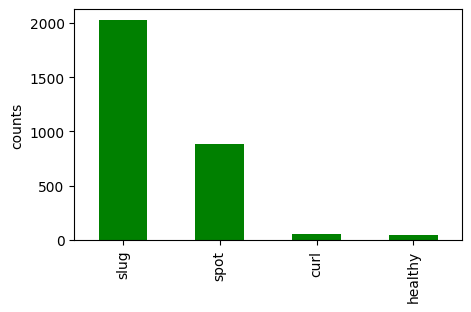

In [ ]:
df.classes.value_counts().plot.bar(color='green', figsize=(5,3))
plt.ylabel('counts')
plt.show()

In [ ]:
# Drop healthy instances
df = df[df.classes!='healthy'].reindex()

In [ ]:
map_class = {c: i for i, c in enumerate(df.classes.unique())}
df['labels'] =df['classes'].map(map_class)

In [ ]:
print('Mapped class', map_class)
print('')
df.head()

Mapped class {'curl': 0, 'slug': 1, 'spot': 2}



,image_path,image,annot_path,classes,labels
0,../datasets/Pear/leaves/curl/u25.jpg,u25.jpg,../datasets/Pear/annotation/YOLO/leaves/u25.txt,curl,0
1,../datasets/Pear/leaves/curl/u1646.jpg,u1646.jpg,../datasets/Pear/annotation/YOLO/leaves/u1646.txt,curl,0
2,../datasets/Pear/leaves/curl/u1690.jpg,u1690.jpg,../datasets/Pear/annotation/YOLO/leaves/u1690.txt,curl,0
3,../datasets/Pear/leaves/curl/u3019.jpg,u3019.jpg,../datasets/Pear/annotation/YOLO/leaves/u3019.txt,curl,0
4,../datasets/Pear/leaves/curl/u3021.jpg,u3021.jpg,../datasets/Pear/annotation/YOLO/leaves/u3021.txt,curl,0


In [ ]:
df['classes'].value_counts()

slug    2025
spot     884
curl      54
Name: classes, dtype: int64

### Split the data
- Split dataset by stratifying the labels column

In [ ]:
from utils.helper_functions import update_annotations, move_files, dataset_directories

In [ ]:
# update annotation files with the mapped class number
for i, (ann, cl) in enumerate(df[['annot_path', 'labels']].values):
   update_annotations(ann, cl)

In [ ]:
# Create directories for full training
splits = ['train', 'val', 'test']
data_dirs = ['images', 'labels']
dataset_directories(splits, data_dirs, data_path=f'{OUT_DIR}/Pear')

In [ ]:
from sklearn.model_selection import train_test_split

X = df
X_train, X_test = train_test_split(X,  stratify=X.labels,
                                                    test_size=0.20, random_state=42)
X_val, X_test = train_test_split(X_test, stratify=X_test.labels,
                                                    test_size=0.30, random_state=42)

In [ ]:
path_columns = ['image_path', 'annot_path']

In [ ]:
# if glob.glob(f'{OUT_DIR}/Pear/leaves/slug/*.jpg'):
for i, col in enumerate(path_columns):
    move_files(X_train[col].values, dest_path=Path(f'{OUT_DIR}/Pear/train/{data_dirs[i]}'))
    move_files(X_val[col].values, dest_path=Path(f'{OUT_DIR}/Pear/val/{data_dirs[i]}'))
    move_files(X_test[col].values, dest_path=Path(f'{OUT_DIR}/Pear/test/{data_dirs[i]}'))

In [ ]:
print('Train images', len(glob.glob(f'{OUT_DIR}/Pear/train/**/*.jpg')))
print('Test images', len(glob.glob(f'{OUT_DIR}/Pear/test/**/*.jpg')))
print('Validation images', len(glob.glob(f'{OUT_DIR}/Pear/val/**/*.jpg')))

Train images 2370
Test images 178
Validation images 415


## Prepare the model

In [ ]:
import ultralytics
from ultralytics import YOLO, settings
import torch
ultralytics.checks()

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 27.6/225.8 GB disk)


In [ ]:
# select device for training
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

### Create a directory to save the results and yaml configuration

In [ ]:
RUNS_DIR = Path(f'{os.getcwd()}/yolov8-pear-experiments')
try:
    os.makedirs(RUNS_DIR)
except FileExistsError:
    print('Directory exist')

Directory exist


In [ ]:
# Update settings
settings.update({'datasets_dir': Path('../datasets/Pear'), 'runs_dir': RUNS_DIR,
                 'wandb': False})

In [ ]:
from ultralytics.utils import DEFAULT_CFG
from ultralytics.cfg import get_cfg

# path to configuration
CFG_PATH = os.path.join(RUNS_DIR, 'config.yaml')
args = get_cfg(cfg=DEFAULT_CFG)
args.data = Path('../datasets/Pear')
args.optimizer = 'AdamW'
args.conf = 0.01
args.show = True
args.show_labels = False

## Instantiate and train the models

In [ ]:
# experiment = comet_ml.Experiment(project_name="yolov8-pear-leaves")
comet = False
EXP_01 = 'exp01-yolov8m'
medium_model = YOLO('yolov8m.pt')
medium_model.to(device)

results_01 = medium_model.train(task='detect', data=CFG_PATH, lr0=0.001,
                               optimizer='AdamW',
                               project='yolov8-pear-experiments',
                               name=EXP_01, epochs=12, batch=10, exist_ok=True,
                               imgsz=640, verbose=True, save=True)

if comet:
    set_experiment = comet_ml.get_global_experiment()
    experiment = comet_ml.ExistingExperiment(previous_experiment=set_experiment.id)
    experiment.set_name(EXP_01)
    experiment.end()

engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/yolo/yolov8-pear-experiments/config.yaml, epochs=12, patience=50, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=yolov8-pear-experiments, name=exp01-yolov8m, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, op

100%|██████████| 755k/755k [00:00<00:00, 45.8MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [08:01<00:00,  4.92it/s]


train: New cache created: /content/drive/MyDrive/datasets/Pear/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:38<00:00, 10.82it/s]


val: New cache created: /content/drive/MyDrive/datasets/Pear/val/labels.cache
Plotting labels to yolov8-pear-experiments/exp01-yolov8m/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.00046875), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8-pear-experiments/exp01-yolov8m
Starting training for 12 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/12      4.65G     0.6644       1.05      1.097         30        640: 100%|██████████| 237/237 [01:55<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.80it/s]

                   all        415        417      0.842      0.541        0.6      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/12      4.86G     0.6675     0.8153      1.088         30        640: 100%|██████████| 237/237 [01:50<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.76it/s]

                   all        415        417      0.798      0.539      0.591      0.518


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/12      4.87G     0.5581     0.7202      1.032         10        640: 100%|██████████| 237/237 [02:02<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:13<00:00,  1.58it/s]

                   all        415        417       0.83      0.537      0.558      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/12      4.89G     0.5457     0.6707      1.027         10        640: 100%|██████████| 237/237 [01:54<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  2.04it/s]

                   all        415        417      0.883      0.586      0.598      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/12      4.89G     0.5046     0.6238     0.9983         10        640: 100%|██████████| 237/237 [01:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:12<00:00,  1.68it/s]

                   all        415        417      0.599      0.732      0.641      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/12      4.88G     0.4811     0.5766     0.9725         10        640: 100%|██████████| 237/237 [01:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.79it/s]

                   all        415        417      0.518      0.781      0.651      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/12      4.89G     0.4504     0.5384     0.9631         10        640: 100%|██████████| 237/237 [01:52<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:13<00:00,  1.61it/s]

                   all        415        417      0.572      0.736      0.723      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/12      4.88G     0.4274     0.5146     0.9419         10        640: 100%|██████████| 237/237 [01:50<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  1.92it/s]

                   all        415        417      0.561      0.816      0.723      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/12       4.9G     0.4065     0.4992     0.9294         10        640: 100%|██████████| 237/237 [01:51<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  1.96it/s]

                   all        415        417      0.789      0.796      0.819      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/12      4.89G     0.4008     0.4725     0.9186         10        640: 100%|██████████| 237/237 [01:50<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.87it/s]

                   all        415        417      0.874      0.726      0.741       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/12      4.89G     0.3732      0.449     0.9125         10        640: 100%|██████████| 237/237 [01:50<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.76it/s]

                   all        415        417      0.685      0.834      0.777      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/12      4.89G     0.3593     0.4249     0.8934         10        640: 100%|██████████| 237/237 [01:50<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:12<00:00,  1.63it/s]

                   all        415        417      0.814      0.719      0.777      0.659



12 epochs completed in 0.433 hours.
Optimizer stripped from yolov8-pear-experiments/exp01-yolov8m/weights/last.pt, 52.0MB
Optimizer stripped from yolov8-pear-experiments/exp01-yolov8m/weights/best.pt, 52.0MB

Validating yolov8-pear-experiments/exp01-yolov8m/weights/best.pt...
Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25841497 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  1.93it/s]


                   all        415        417      0.814      0.719      0.778      0.659
                  curl        415         10      0.737        0.4       0.51      0.251
                  slug        415        283      0.923      0.919      0.979      0.932
                  spot        415        124      0.782      0.839      0.844      0.793
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to yolov8-pear-experiments/exp01-yolov8m


In [ ]:
comet = False
EXP_02 = 'exp02-yolov8s'
small_model = YOLO('yolov8s.pt')
small_model.to(device)

results_02 = small_model.train(task='detect', data=CFG_PATH, lr0=0.001,
                               optimizer='AdamW', dropout=0.2, workers=10,
                               project='yolov8-pear-experiments',
                               name=EXP_02, epochs=12, batch=10, exist_ok=True,
                               imgsz=640, verbose=True, save=True)
if comet:
    set_experiment = comet_ml.get_global_experiment()
    experiment = comet_ml.ExistingExperiment(previous_experiment=set_experiment.id)
    experiment.set_name(EXP_02)
    experiment.end()

engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/yolo/yolov8-pear-experiments/config.yaml, epochs=12, patience=50, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=10, project=yolov8-pear-experiments, name=exp02-yolov8s, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, 

train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels.cache... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


Plotting labels to yolov8-pear-experiments/exp02-yolov8s/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.00046875), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8-pear-experiments/exp02-yolov8s
Starting training for 12 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/12      3.48G     0.6483      1.013      1.085         30        640: 100%|██████████| 237/237 [01:54<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.80it/s]

                   all        415        417      0.895      0.578      0.604      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/12      3.55G     0.6301     0.7692      1.064         30        640: 100%|██████████| 237/237 [01:53<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:12<00:00,  1.70it/s]

                   all        415        417      0.541        0.6      0.617       0.53


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/12      3.55G     0.5196     0.6872      1.013         10        640: 100%|██████████| 237/237 [01:56<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.90it/s]

                   all        415        417       0.82       0.56      0.575      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/12      3.55G      0.498     0.6598      0.997         10        640: 100%|██████████| 237/237 [01:54<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]

                   all        415        417      0.656      0.638      0.625      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/12      3.56G     0.4763     0.5977     0.9794         10        640: 100%|██████████| 237/237 [01:52<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.78it/s]

                   all        415        417      0.672      0.698      0.698      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/12      3.56G     0.4567     0.5488     0.9504         10        640: 100%|██████████| 237/237 [01:59<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.77it/s]

                   all        415        417      0.638      0.711      0.712      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/12      3.55G     0.4265     0.5188       0.95         10        640: 100%|██████████| 237/237 [01:52<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.76it/s]

                   all        415        417      0.822      0.749      0.805      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/12      3.55G     0.4239     0.5218     0.9375         10        640: 100%|██████████| 237/237 [01:59<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  2.04it/s]

                   all        415        417      0.904      0.723      0.799      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/12      3.55G     0.3965     0.4905     0.9206         10        640: 100%|██████████| 237/237 [01:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.27it/s]

                   all        415        417      0.784      0.773      0.823      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/12      3.56G     0.3848     0.4574     0.9068         10        640: 100%|██████████| 237/237 [01:52<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.14it/s]

                   all        415        417      0.666      0.729      0.728       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/12      3.56G     0.3653     0.4371     0.9046         10        640: 100%|██████████| 237/237 [01:55<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  1.93it/s]

                   all        415        417       0.85      0.713      0.799      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/12      3.56G     0.3501     0.4079     0.8845         10        640: 100%|██████████| 237/237 [01:52<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  2.03it/s]

                   all        415        417      0.889       0.76      0.839      0.726



12 epochs completed in 0.431 hours.
Optimizer stripped from yolov8-pear-experiments/exp02-yolov8s/weights/last.pt, 22.5MB
Optimizer stripped from yolov8-pear-experiments/exp02-yolov8s/weights/best.pt, 22.5MB

Validating yolov8-pear-experiments/exp02-yolov8s/weights/best.pt...
Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:13<00:00,  1.54it/s]


                   all        415        417      0.888       0.76      0.839      0.727
                  curl        415         10      0.927        0.5      0.672      0.419
                  slug        415        283      0.947      0.908      0.978       0.93
                  spot        415        124      0.789      0.873      0.866      0.831
Speed: 0.2ms preprocess, 1.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to yolov8-pear-experiments/exp02-yolov8s


Yolov8 medium - Metrics


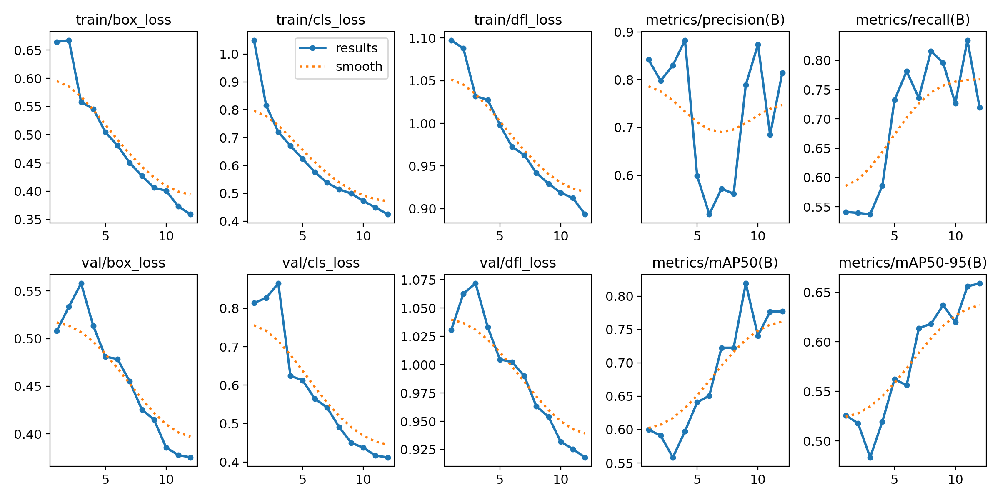

In [ ]:
print('Yolov8 medium - Metrics')
Image.open(Path(f'{RUNS_DIR}/{EXP_01}/results.png'))

Yolov8 small - Metrics


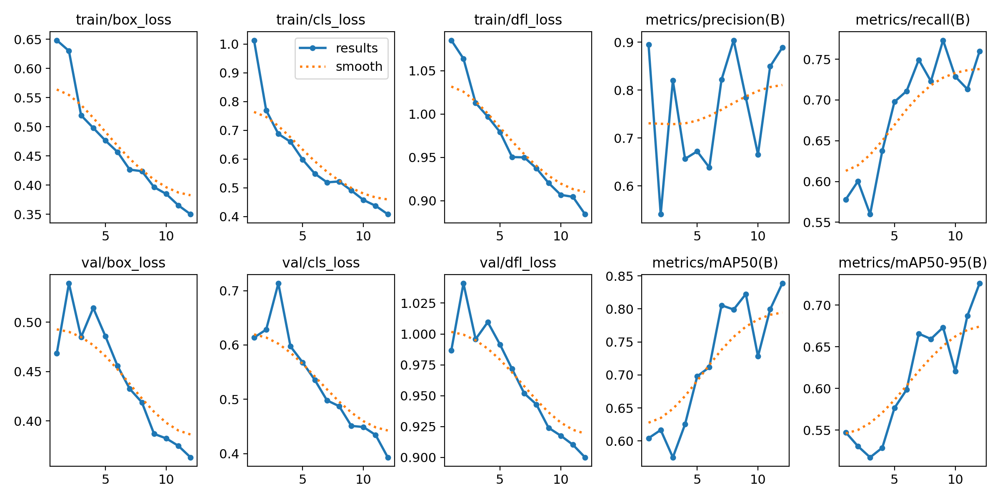

In [ ]:
print('Yolov8 small - Metrics')
Image.open(Path(f'{RUNS_DIR}/{EXP_02}/results.png'))

## Evalute the models mAP and Recall on the Test set

In [ ]:
best_model_exp01 = YOLO(f'{RUNS_DIR}/{EXP_01}/weights/best.pt')
medium_test=best_model_exp01.val(split='test', project=f'{RUNS_DIR}/{EXP_01}', name='test')

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25841497 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/Pear/test/labels... 178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 178/178 [00:17<00:00, 10.46it/s]


val: New cache created: /content/drive/MyDrive/datasets/Pear/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.09s/it]


                   all        178        180       0.81      0.844      0.853      0.683
                  curl        178          4      0.705       0.75      0.745      0.324
                  slug        178        123      0.954      0.894      0.973       0.93
                  spot        178         53       0.77      0.887       0.84      0.796
Speed: 0.6ms preprocess, 10.5ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to /content/drive/MyDrive/yolo/yolov8-pear-experiments/exp01-yolov8m/test


In [ ]:
best_model_exp02 = YOLO(f'{RUNS_DIR}/{EXP_02}/weights/best.pt')
small_test = best_model_exp02.val(split='test', project=f'{RUNS_DIR}/{EXP_02}',  name='test',
                         exist_ok=True, plots=True, show=True)

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/Pear/test/labels.cache... 178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 178/178 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.09s/it]


                   all        178        180      0.799      0.843      0.831      0.658
                  curl        178          4      0.731      0.693      0.726      0.318
                  slug        178        123      0.935      0.911      0.969      0.919
                  spot        178         53      0.732      0.926      0.797      0.736
Speed: 0.7ms preprocess, 7.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to /content/drive/MyDrive/yolo/yolov8-pear-experiments/exp02-yolov8s/test


## Model Optimisation - Ray hyperparameters tuning

In [ ]:
from ray import tune

In [ ]:
# # uncomment if releasesing resources
# import ray
# print("ray:", ray.cluster_resources())
# # uncomment if releasesing resources
# ray.shutdown()

In [ ]:
# Define a YOLO model

comet = False
grid_model = YOLO("yolov8s.pt")
grid_model.to(device)

EXP_03 = 'optim-yolov8s'
# Run Ray Tune on the model
result_grid = grid_model.tune(data=CFG_PATH, space={"lr0": tune.uniform(1e-4, 1e-3)},
                              iterations=3, batch=8, workers=10, optimizer='AdamW',
                              grace_period=5, seed=42, epochs=15, use_ray=True, save=False,
                              verbose=True, exist_ok=True, gpu_per_trial=1)
if comet:
    set_experiment = comet_ml.get_global_experiment()
    experiment = comet_ml.ExistingExperiment(previous_experiment=set_experiment.id)
    experiment.set_name(EXP_03)
    experiment.end()


💡 Learn about RayTune at https://docs.ultralytics.com/integrations/ray-tune


2023-12-11 13:39:30,513	INFO worker.py:1673 -- Started a local Ray instance.
2023-12-11 13:39:32,032	INFO tune.py:595 -- [output] This will use the new output engine with verbosity 1. To disable the new output and use the legacy output engine, set the environment variable RAY_AIR_NEW_OUTPUT=0. For more information, please see https://github.com/ray-project/ray/issues/36949


+--------------------------------------------------------------+
| Configuration for experiment     _tune_2023-12-11_13-39-32   |
+--------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator       |
| Scheduler                        AsyncHyperBandScheduler     |
| Number of trials                 3                           |
+--------------------------------------------------------------+

View detailed results here: /content/drive/MyDrive/yolo/runs/detect/tune2/_tune_2023-12-11_13-39-32
To visualize your results with TensorBoard, run: `tensorboard --logdir /root/ray_results/_tune_2023-12-11_13-39-32`

Trial status: 3 PENDING
Current time: 2023-12-11 13:39:32. Total running time: 0s
Logical resource usage: 0/8 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   PENDING

  0%|          | 0.00/755k [00:00<?, ?B/s]
100%|██████████| 755k/755k [00:00<00:00, 20.6MB/s]
(_tune pid=8797) 2023-12-11 13:39:40.924923: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(_tune pid=8797) 2023-12-11 13:39:40.924977: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(_tune pid=8797) 2023-12-11 13:39:40.925007: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


(_tune pid=8797) Overriding model.yaml nc=80 with nc=3
(_tune pid=8797) 
(_tune pid=8797)                    from  n    params  module                                       arguments                     
(_tune pid=8797)   0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
(_tune pid=8797)   1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
(_tune pid=8797)   2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
(_tune pid=8797)   3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
(_tune pid=8797)   4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
(_tune pid=8797)   5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
(_tune pid

100%|██████████| 6.23M/6.23M [00:00<00:00, 191MB/s]


(_tune pid=8797) AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels.cache... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [00:00<?, ?it/s]



Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:40:02. Total running time: 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+
(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


(_tune pid=8797) Plotting labels to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/labels.jpg... 
(_tune pid=8797) optimizer: AdamW(lr=0.0007227827347334609, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
(_tune pid=8797) Image sizes 640 train, 640 val
(_tune pid=8797) Using 8 dataloader workers
(_tune pid=8797) Logging results to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train
(_tune pid=8797) Starting training for 15 epochs...
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]
       1/15      2.44G      1.204      3.691      1.599         20        640:   0%|          | 1/297 [00:01<07:28,  1.51s/it]
       1/15      2.44G      1.138      3.625       1.51         22        640:   1%|          | 2/297 [00:01<03:52,  1.27it/s]
       1/15      2.44G      1.171      3.745      1.576         19        640:   1%|          | 3/297 [00:02<02:50,  1.72it/s]
       1/15      2.44G      1.207      3.899      1.598         15        640:   1%|▏         | 4/297 [00:02<02:34,  1.89it/s]
       1/15      2.44G      1.277      3.836      1.648         25        640:   2%|▏         | 5/297 [00:02<01:51,  2.62it/s]
       1/15      2.45G      1.185      3.818      1.578         18        640:   2%|▏         | 6/297 [00:02<01:29,  3.25it/s]
       1/15      2.45G      1.167      3.716      1.569         21        640:   3%|▎         | 8/297 [00:03<00:59,  4.86it/s]


Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:40:32. Total running time: 1min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.45G      1.127       3.55      1.553         14        640:   3%|▎         | 9/297 [00:27<31:22,  6.54s/it]
       1/15      2.45G      1.078      3.402      1.517         17        640:   3%|▎         | 10/297 [00:27<22:56,  4.80s/it]
       1/15      2.45G      1.027       3.27      1.474         24        640:   4%|▎         | 11/297 [00:27<16:41,  3.50s/it]
       1/15      2.45G       1.01      3.206      1.455         19        640:   4%|▍         | 12/297 [00:27<12:03,  2.54s/it]
       1/15      2.45G      0.981      3.123      1.427         16        640:   4%|▍         | 13/297 [00:28<08:48,  1.86s/it]
       1/15      2.45G     0.9669       3.04      1.413         16        640:   5%|▍         | 14/297 [00:29<07:44,  1.64s/it]
       1/15      2.45G     0.9885      2.994      1.434         11        640:   5%|▌         | 15/297 [00:29<05:42,  1.21s/it]
       1/15      2.45G      0.991      2.905      1.443         18        640:   5%|▌         | 16/297 [0

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:41:02. Total running time: 1min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.45G     0.8439       2.08      1.288         17        640:  11%|█         | 33/297 [00:53<08:50,  2.01s/it]
       1/15      2.45G     0.8456      2.059      1.287         18        640:  12%|█▏        | 35/297 [00:54<05:39,  1.30s/it]
       1/15      2.45G     0.8407      2.039      1.282         17        640:  12%|█▏        | 35/297 [00:54<05:39,  1.30s/it]
       1/15      2.45G     0.8375       2.01      1.283         19        640:  12%|█▏        | 37/297 [00:54<03:48,  1.14it/s]
       1/15      2.45G     0.8327      1.987      1.275         23        640:  13%|█▎        | 38/297 [00:54<03:29,  1.23it/s]
       1/15      2.45G     0.8276      1.961      1.269         21        640:  13%|█▎        | 38/297 [00:54<03:29,  1.23it/s]
       1/15      2.45G     0.8225      1.941      1.264         15        640:  13%|█▎        | 40/297 [00:54<02:21,  1.82it/s]
       1/15      2.45G     0.8166      1.915      1.259         19        640:  14%|█▍        | 41/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:41:32. Total running time: 2min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.45G     0.7765      1.685      1.222         17        640:  19%|█▉        | 57/297 [01:20<06:34,  1.64s/it]
       1/15      2.45G      0.771      1.671      1.217         17        640:  20%|█▉        | 58/297 [01:20<05:26,  1.36s/it]
       1/15      2.45G     0.7684      1.661      1.214         21        640:  20%|█▉        | 58/297 [01:20<05:26,  1.36s/it]
       1/15      2.45G     0.7624      1.648       1.21         20        640:  20%|██        | 60/297 [01:20<03:40,  1.08it/s]
       1/15      2.45G     0.7595      1.636      1.208         19        640:  20%|██        | 60/297 [01:20<03:40,  1.08it/s]
       1/15      2.45G     0.7596      1.629      1.209         16        640:  21%|██        | 62/297 [01:20<02:33,  1.53it/s]
       1/15      2.45G     0.7557      1.616      1.206         25        640:  21%|██        | 62/297 [01:20<02:33,  1.53it/s]
       1/15      2.45G     0.7528      1.609      1.202         21        640:  22%|██▏       | 64/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:42:02. Total running time: 2min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G     0.7056      1.429      1.168         26        640:  30%|██▉       | 89/297 [01:54<06:15,  1.81s/it]
       1/15      2.46G      0.703      1.423      1.165         17        640:  30%|███       | 90/297 [01:54<05:04,  1.47s/it]
       1/15      2.46G     0.7031       1.42      1.165         20        640:  31%|███       | 91/297 [01:54<03:54,  1.14s/it]
       1/15      2.46G     0.7026      1.413      1.165         23        640:  31%|███       | 92/297 [01:54<02:56,  1.16it/s]
       1/15      2.46G     0.7024       1.41      1.165         17        640:  31%|███       | 92/297 [01:54<02:56,  1.16it/s]
       1/15      2.46G     0.7005      1.404      1.164         16        640:  32%|███▏      | 94/297 [01:56<02:35,  1.31it/s]
       1/15      2.46G     0.6988      1.401      1.163         16        640:  32%|███▏      | 94/297 [01:56<02:35,  1.31it/s]
       1/15      2.46G     0.6963      1.394      1.161         15        640:  32%|███▏      | 96/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:42:32. Total running time: 3min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G     0.6882      1.315      1.152         22        640:  38%|███▊      | 113/297 [02:19<05:21,  1.75s/it]
       1/15      2.46G     0.6874      1.311      1.151         17        640:  38%|███▊      | 114/297 [02:19<04:11,  1.37s/it]
       1/15      2.46G     0.6872      1.303       1.15         17        640:  39%|███▊      | 115/297 [02:21<04:31,  1.49s/it]
       1/15      2.46G     0.6858      1.298      1.148         18        640:  39%|███▉      | 117/297 [02:21<02:43,  1.10it/s]
       1/15      2.46G     0.6843      1.294      1.148         10        640:  40%|███▉      | 118/297 [02:21<02:29,  1.20it/s]
       1/15      2.46G     0.6853       1.29       1.15         15        640:  40%|███▉      | 118/297 [02:22<02:29,  1.20it/s]
       1/15      2.46G     0.6829      1.285      1.148         18        640:  40%|████      | 120/297 [02:22<01:35,  1.85it/s]
       1/15      2.46G     0.6829      1.281      1.147         15        640:  41%|████      | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:43:02. Total running time: 3min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G     0.6699      1.226      1.137         24        640:  49%|████▉     | 145/297 [02:53<03:49,  1.51s/it]
       1/15      2.46G     0.6687      1.223      1.136         24        640:  49%|████▉     | 145/297 [02:53<03:49,  1.51s/it]
       1/15      2.46G     0.6689       1.22      1.136         18        640:  49%|████▉     | 147/297 [02:56<03:47,  1.52s/it]
       1/15      2.46G     0.6695      1.217      1.136         26        640:  49%|████▉     | 147/297 [02:56<03:47,  1.52s/it]
       1/15      2.46G     0.6692      1.214      1.135         23        640:  50%|█████     | 149/297 [02:56<02:28,  1.01s/it]
       1/15      2.46G     0.6682      1.212      1.134         22        640:  51%|█████     | 150/297 [02:57<02:16,  1.07it/s]
       1/15      2.46G     0.6684      1.207      1.134         19        640:  51%|█████     | 152/297 [02:57<01:29,  1.61it/s]
       1/15      2.46G     0.6684      1.205      1.134         16        640:  52%|█████▏    | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:43:32. Total running time: 4min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G      0.663      1.179      1.126         25        640:  57%|█████▋    | 169/297 [03:20<03:17,  1.55s/it]
       1/15      2.46G     0.6623      1.177      1.125         19        640:  57%|█████▋    | 170/297 [03:20<02:34,  1.22s/it]
       1/15      2.46G     0.6616      1.174      1.124         20        640:  58%|█████▊    | 171/297 [03:22<02:56,  1.40s/it]
       1/15      2.46G     0.6616      1.173      1.124         16        640:  58%|█████▊    | 171/297 [03:22<02:56,  1.40s/it]
       1/15      2.46G     0.6613      1.172      1.123         21        640:  58%|█████▊    | 173/297 [03:22<01:46,  1.17it/s]
       1/15      2.46G     0.6622      1.169      1.123         13        640:  59%|█████▊    | 174/297 [03:23<01:40,  1.22it/s]
       1/15      2.46G     0.6609      1.167      1.122         20        640:  59%|█████▉    | 176/297 [03:23<01:03,  1.89it/s]
       1/15      2.46G     0.6602      1.165      1.121         24        640:  60%|█████▉    | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:44:02. Total running time: 4min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G     0.6487      1.116      1.109         16        640:  68%|██████▊   | 201/297 [03:55<02:36,  1.64s/it]
       1/15      2.46G      0.648      1.114      1.109         19        640:  68%|██████▊   | 203/297 [03:57<02:27,  1.57s/it]
       1/15      2.46G     0.6479      1.111      1.108         22        640:  68%|██████▊   | 203/297 [03:58<02:27,  1.57s/it]
       1/15      2.46G     0.6477       1.11      1.108         21        640:  69%|██████▉   | 205/297 [03:58<01:37,  1.06s/it]
       1/15      2.46G     0.6484      1.109      1.109         17        640:  69%|██████▉   | 205/297 [03:58<01:37,  1.06s/it]
       1/15      2.46G     0.6483      1.107      1.109         24        640:  70%|██████▉   | 207/297 [03:58<01:05,  1.37it/s]
       1/15      2.46G     0.6479      1.105      1.108         19        640:  70%|███████   | 208/297 [03:58<00:54,  1.63it/s]
       1/15      2.46G     0.6478      1.103      1.108         20        640:  70%|███████   | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:44:32. Total running time: 5min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G      0.644      1.081      1.105         20        640:  76%|███████▌  | 225/297 [04:20<01:44,  1.45s/it]
       1/15      2.46G     0.6429      1.076      1.103         17        640:  76%|███████▋  | 227/297 [04:23<01:40,  1.44s/it]
       1/15      2.46G     0.6428      1.075      1.103         15        640:  77%|███████▋  | 229/297 [04:23<01:06,  1.03it/s]
       1/15      2.46G     0.6422      1.073      1.102         22        640:  77%|███████▋  | 230/297 [04:25<01:10,  1.05s/it]
       1/15      2.46G     0.6428      1.073      1.102         16        640:  77%|███████▋  | 230/297 [04:25<01:10,  1.05s/it]
       1/15      2.46G     0.6428      1.072      1.102         15        640:  78%|███████▊  | 232/297 [04:25<00:46,  1.41it/s]
       1/15      2.46G     0.6427      1.069      1.101         20        640:  78%|███████▊  | 233/297 [04:29<01:28,  1.39s/it]
       1/15      2.46G     0.6429      1.068      1.101         16        640:  79%|███████▉  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:45:02. Total running time: 5min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G      0.644       1.05        1.1         20        640:  86%|████████▌ | 254/297 [04:50<00:45,  1.06s/it]
       1/15      2.46G     0.6444      1.049        1.1         22        640:  86%|████████▌ | 254/297 [04:51<00:45,  1.06s/it]
       1/15      2.46G     0.6447      1.049        1.1         16        640:  86%|████████▌ | 256/297 [04:51<00:29,  1.41it/s]
       1/15      2.46G     0.6444      1.047        1.1         16        640:  87%|████████▋ | 257/297 [04:55<00:56,  1.42s/it]
       1/15      2.46G     0.6441      1.046      1.099         20        640:  87%|████████▋ | 258/297 [04:56<00:49,  1.26s/it]
       1/15      2.46G     0.6437      1.046      1.099         17        640:  87%|████████▋ | 259/297 [04:57<00:52,  1.38s/it]
       1/15      2.46G     0.6436      1.044      1.099         20        640:  87%|████████▋ | 259/297 [04:57<00:52,  1.38s/it]
       1/15      2.46G     0.6434      1.043      1.099         21        640:  88%|████████▊ | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:45:32. Total running time: 6min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       1/15      2.46G     0.6406      1.021      1.096         16        640:  95%|█████████▍| 281/297 [05:19<00:19,  1.25s/it]
       1/15      2.46G      0.641      1.021      1.096         21        640:  95%|█████████▍| 282/297 [05:21<00:19,  1.31s/it]
       1/15      2.46G     0.6415       1.02      1.096         18        640:  95%|█████████▌| 283/297 [05:22<00:16,  1.16s/it]
       1/15      2.46G     0.6414      1.019      1.096         18        640:  96%|█████████▌| 285/297 [05:22<00:09,  1.30it/s]
       1/15      2.46G     0.6407      1.019      1.095         15        640:  96%|█████████▋| 286/297 [05:24<00:10,  1.00it/s]
       1/15      2.46G     0.6406      1.018      1.095         16        640:  96%|█████████▋| 286/297 [05:24<00:10,  1.00it/s]
       1/15      2.46G      0.641      1.017      1.095         16        640:  97%|█████████▋| 288/297 [05:24<00:05,  1.60it/s]
       1/15      2.46G     0.6417      1.017      1.096         18        640:  97%|█████████▋| 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:46:02. Total running time: 6min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


(_tune pid=8797)                    all        415        417      0.897      0.594      0.698      0.562


  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.51G     0.7858     0.9772      1.018         25        640:   0%|          | 1/297 [00:00<01:13,  4.01it/s]
       2/15      2.51G     0.6212     0.7678     0.9995         22        640:   1%|          | 2/297 [00:00<00:56,  5.22it/s]
       2/15      2.53G     0.6086     0.7939      1.021         20        640:   1%|          | 3/297 [00:00<00:57,  5.10it/s]
       2/15      2.53G     0.5916     0.7557       1.02         21        640:   1%|▏         | 4/297 [00:00<00:58,  5.02it/s]
       2/15      2.53G     0.5869     0.7403      1.021         20        640:   2%|▏         | 5/297 [00:01<01:03,  4.57it/s]
       2/15      2.53G     0.5885     0.7323      1.017         21        640:   2%|▏         | 6/297 [00:01<01:15,  3.83it/s]
       2/15      2.53G     0.5744      0.778      1.015         16        640:   2%|▏         | 7/297 [00:01<01:35,  3.04it/s]
       2/15      2.53G     0.5808     0.7702      1.037         14        640:   3%|▎         | 8/297 [00:02<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:46:32. Total running time: 7min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       2/15      2.53G     0.6165     0.7849      1.071         25        640:  26%|██▌       | 76/297 [00:29<01:38,  2.23it/s]
       2/15      2.53G      0.616     0.7832      1.071         20        640:  26%|██▌       | 76/297 [00:29<01:38,  2.23it/s]
       2/15      2.53G     0.6142     0.7835      1.069         18        640:  26%|██▋       | 78/297 [00:29<01:06,  3.27it/s]
       2/15      2.53G     0.6136     0.7802       1.07         17        640:  27%|██▋       | 79/297 [00:30<01:51,  1.96it/s]
       2/15      2.53G     0.6145     0.7798      1.069         26        640:  27%|██▋       | 79/297 [00:30<01:51,  1.96it/s]
       2/15      2.53G     0.6135     0.7787      1.068         18        640:  27%|██▋       | 81/297 [00:30<01:13,  2.92it/s]
       2/15      2.53G     0.6121     0.7779      1.066         16        640:  28%|██▊       | 82/297 [00:30<01:05,  3.28it/s]
       2/15      2.53G     0.6135     0.7803      1.068         19        640:  28%|██▊       | 83/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:47:02. Total running time: 7min 30s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       2/15      2.53G     0.6094     0.7622       1.06         22        640:  54%|█████▎    | 159/297 [01:00<01:25,  1.61it/s]
       2/15      2.53G     0.6083     0.7613      1.059         25        640:  54%|█████▍    | 160/297 [01:00<01:06,  2.05it/s]
       2/15      2.53G     0.6078     0.7604      1.059         21        640:  54%|█████▍    | 161/297 [01:00<00:52,  2.58it/s]
       2/15      2.53G     0.6089     0.7608      1.059         13        640:  54%|█████▍    | 161/297 [01:00<00:52,  2.58it/s]
       2/15      2.53G     0.6087       0.76      1.059         22        640:  55%|█████▍    | 163/297 [01:01<00:47,  2.85it/s]
       2/15      2.53G     0.6081     0.7599      1.059         20        640:  55%|█████▍    | 163/297 [01:01<00:47,  2.85it/s]
       2/15      2.53G     0.6075     0.7604      1.059         15        640:  56%|█████▌    | 165/297 [01:01<00:32,  4.00it/s]
       2/15      2.53G     0.6074       0.76      1.059         13        640:  56%|█████▌    | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:47:32. Total running time: 8min 0s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       2/15      2.53G     0.6074     0.7659      1.059         19        640:  80%|████████  | 239/297 [01:29<00:31,  1.83it/s]
       2/15      2.53G     0.6077     0.7657      1.059         24        640:  81%|████████  | 240/297 [01:30<00:26,  2.18it/s]
       2/15      2.53G     0.6073     0.7663      1.059         15        640:  81%|████████  | 241/297 [01:30<00:21,  2.61it/s]
       2/15      2.53G     0.6069     0.7657      1.058         23        640:  81%|████████  | 241/297 [01:30<00:21,  2.61it/s]
       2/15      2.53G     0.6065     0.7646      1.058         17        640:  82%|████████▏ | 243/297 [01:30<00:14,  3.78it/s]
       2/15      2.53G      0.606      0.764      1.058         17        640:  82%|████████▏ | 244/297 [01:30<00:12,  4.41it/s]
       2/15      2.53G     0.6064     0.7649      1.058         23        640:  82%|████████▏ | 244/297 [01:30<00:12,  4.41it/s]
       2/15      2.53G     0.6066     0.7656      1.058         20        640:  83%|████████▎ | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:48:03. Total running time: 8min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 24/26 [00:09<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:12<00:01,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.498      0.718      0.677      0.567
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.52G     0.4965      0.724     0.9402         17        640:   0%|          | 1/297 [00:00<00:56,  5.26it/s]
       3/15      2.53G     0.5118     0.7434       0.94         21        640:   1%|          | 2/297 [00:00<00:49,  5.92it/s]
       3/15      2.53G     0.6335     0.7991      1.104         15        640:   1%|          | 3/297 [00:00<01:02,  4.67it/s]
       3/15      2.53G     0.6554     0.7836      1.087         23        640:   1%|▏         | 4/297 [00:00<00:58,  4.98it/s]
       3/15      2.53G      0.681     0.8094       1.09         22        640:   2%|▏         | 5/297 [00:01<01:06,  4.37it/s]
       3/15      2.53G     0.6899     0.8656      1.087         21        640:   2%|▏         | 6/297 [00:01<01:15,  3.85it/s]
       3/15      2.53G     0.6642     0.8617      1.068         18        640:   2%|▏         | 7/297 [00:01<01:15,  3.84it/s]
       3/15      2.53G     0.6547     0.8299      1.059         13        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:48:33. Total running time: 9min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       3/15      2.54G     0.6051     0.8147      1.063         17        640:  20%|█▉        | 58/297 [00:23<02:56,  1.36it/s]
       3/15      2.54G     0.6079      0.812      1.066         23        640:  20%|█▉        | 59/297 [00:23<02:13,  1.78it/s]
       3/15      2.54G     0.6067     0.8113      1.065         27        640:  20%|█▉        | 59/297 [00:23<02:13,  1.78it/s]
       3/15      2.54G     0.6058     0.8088      1.064         21        640:  21%|██        | 61/297 [00:23<01:21,  2.89it/s]
       3/15      2.54G     0.6076      0.808      1.064         17        640:  21%|██        | 62/297 [00:24<01:09,  3.39it/s]
       3/15      2.54G     0.6058     0.8063      1.062         16        640:  21%|██        | 63/297 [00:24<01:05,  3.56it/s]
       3/15      2.54G      0.605     0.8059       1.06         24        640:  22%|██▏       | 64/297 [00:24<00:54,  4.28it/s]
       3/15      2.54G     0.6022     0.8028      1.059         16        640:  22%|██▏       | 64/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:49:03. Total running time: 9min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       3/15      2.54G      0.605     0.7935      1.055         18        640:  46%|████▋     | 138/297 [00:53<01:23,  1.90it/s]
       3/15      2.54G     0.6078     0.7975      1.058         15        640:  46%|████▋     | 138/297 [00:53<01:23,  1.90it/s]
       3/15      2.54G     0.6083     0.7986      1.058         22        640:  47%|████▋     | 140/297 [00:53<00:59,  2.64it/s]
       3/15      2.54G     0.6083     0.7983      1.057         20        640:  47%|████▋     | 140/297 [00:53<00:59,  2.64it/s]
       3/15      2.54G     0.6091     0.7972      1.058         18        640:  48%|████▊     | 142/297 [00:53<00:43,  3.52it/s]
       3/15      2.54G     0.6088     0.7965      1.057         25        640:  48%|████▊     | 143/297 [00:53<00:38,  3.99it/s]
       3/15      2.54G     0.6081      0.795      1.057         13        640:  48%|████▊     | 144/297 [00:53<00:34,  4.46it/s]
       3/15      2.54G      0.607     0.7923      1.056         22        640:  49%|████▉     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:49:33. Total running time: 10min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       3/15      2.54G     0.5966     0.7507      1.047         19        640:  75%|███████▌  | 224/297 [01:22<00:15,  4.58it/s]
       3/15      2.54G     0.5963     0.7505      1.047         26        640:  76%|███████▌  | 225/297 [01:22<00:14,  5.06it/s]
       3/15      2.54G     0.5958     0.7495      1.047         18        640:  76%|███████▌  | 226/297 [01:25<00:58,  1.22it/s]
       3/15      2.54G     0.5951     0.7484      1.047         20        640:  76%|███████▌  | 226/297 [01:25<00:58,  1.22it/s]
       3/15      2.54G     0.5952     0.7474      1.046         20        640:  77%|███████▋  | 228/297 [01:25<00:34,  1.97it/s]
       3/15      2.54G     0.5951     0.7465      1.046         26        640:  77%|███████▋  | 229/297 [01:25<00:28,  2.43it/s]
       3/15      2.54G      0.596     0.7465      1.047         19        640:  77%|███████▋  | 229/297 [01:25<00:28,  2.43it/s]
       3/15      2.54G     0.5961     0.7461      1.047         18        640:  78%|███████▊  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:50:03. Total running time: 10min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 13/26 [00:03<00:02,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 14/26 [00:03<00:02,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 15/26 [00:03<00:02,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 16/26 [00:03<00:02,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:08<00:12,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:08<00:08,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:08<00:05,  1.25it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.515      0.575      0.606      0.539
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.52G     0.6148     0.5122       1.16         18        640:   0%|          | 1/297 [00:00<00:56,  5.21it/s]
       4/15      2.53G     0.5557     0.4928      1.091         21        640:   1%|          | 2/297 [00:00<00:52,  5.63it/s]
       4/15      2.53G     0.6384     0.6637      1.145         15        640:   1%|          | 3/297 [00:00<00:53,  5.47it/s]
       4/15      2.53G     0.6227     0.6858      1.139         20        640:   1%|▏         | 4/297 [00:00<00:45,  6.40it/s]
       4/15      2.53G     0.5949     0.6728      1.103         18        640:   2%|▏         | 5/297 [00:00<00:43,  6.64it/s]
       4/15      2.53G     0.5802     0.6602      1.095         18        640:   2%|▏         | 6/297 [00:01<01:01,  4.71it/s]
       4/15      2.53G       0.62     0.7126      1.127         24        640:   2%|▏         | 7/297 [00:01<01:12,  3.99it/s]
       4/15      2.53G     0.6075     0.6909      1.105         22        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:50:33. Total running time: 11min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       4/15      2.53G     0.5955     0.7281      1.058         15        640:  15%|█▌        | 45/297 [00:18<02:02,  2.06it/s]
       4/15      2.53G     0.5946      0.731      1.057         21        640:  15%|█▌        | 46/297 [00:19<02:15,  1.86it/s]
       4/15      2.53G     0.5992     0.7291      1.062         15        640:  15%|█▌        | 46/297 [00:19<02:15,  1.86it/s]
       4/15      2.53G     0.5942     0.7296      1.059         11        640:  16%|█▌        | 48/297 [00:19<01:28,  2.82it/s]
       4/15      2.53G     0.5919     0.7281      1.057         20        640:  16%|█▋        | 49/297 [00:19<01:30,  2.73it/s]
       4/15      2.53G     0.5911     0.7293      1.055         20        640:  17%|█▋        | 50/297 [00:20<01:17,  3.20it/s]
       4/15      2.53G      0.591     0.7252      1.056         16        640:  17%|█▋        | 51/297 [00:20<01:05,  3.76it/s]
       4/15      2.53G     0.5884     0.7196      1.054         21        640:  17%|█▋        | 51/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:51:03. Total running time: 11min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       4/15      2.53G     0.5744     0.7019      1.043         15        640:  41%|████▏     | 123/297 [00:47<00:41,  4.21it/s]
       4/15      2.53G     0.5739     0.7019      1.042         15        640:  42%|████▏     | 124/297 [00:47<00:35,  4.83it/s]
       4/15      2.53G     0.5759     0.7022      1.044         16        640:  42%|████▏     | 125/297 [00:48<01:21,  2.10it/s]
       4/15      2.53G     0.5764     0.7052      1.046         13        640:  42%|████▏     | 126/297 [00:50<01:58,  1.45it/s]
       4/15      2.53G     0.5762     0.7054      1.045         21        640:  43%|████▎     | 127/297 [00:50<01:31,  1.86it/s]
       4/15      2.53G     0.5764     0.7042      1.045         23        640:  43%|████▎     | 128/297 [00:50<01:10,  2.40it/s]
       4/15      2.53G     0.5751     0.7025      1.044         18        640:  43%|████▎     | 129/297 [00:50<00:56,  2.97it/s]
       4/15      2.53G     0.5752     0.7016      1.043         24        640:  44%|████▍     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:51:33. Total running time: 12min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       4/15      2.53G     0.5725     0.6778      1.038         23        640:  69%|██████▉   | 206/297 [01:17<00:46,  1.94it/s]
       4/15      2.53G     0.5732     0.6782      1.038         26        640:  70%|██████▉   | 207/297 [01:17<00:36,  2.45it/s]
       4/15      2.53G     0.5734     0.6785      1.038         16        640:  70%|███████   | 209/297 [01:18<00:23,  3.67it/s]
       4/15      2.53G     0.5731     0.6775      1.038         19        640:  71%|███████   | 210/297 [01:18<00:21,  3.96it/s]
       4/15      2.53G      0.572     0.6772      1.037         15        640:  71%|███████   | 211/297 [01:18<00:19,  4.34it/s]
       4/15      2.53G     0.5727     0.6783      1.037         22        640:  71%|███████▏  | 212/297 [01:18<00:16,  5.09it/s]
       4/15      2.53G      0.572     0.6777      1.037         25        640:  72%|███████▏  | 213/297 [01:19<00:28,  2.95it/s]
       4/15      2.53G     0.5724     0.6773      1.037         21        640:  72%|███████▏  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:52:03. Total running time: 12min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       4/15      2.53G     0.5745     0.6849      1.034         19        640:  99%|█████████▉| 294/297 [01:47<00:01,  2.09it/s]
       4/15      2.53G     0.5748     0.6852      1.034         14        640:  99%|█████████▉| 295/297 [01:47<00:00,  2.60it/s]
       4/15      2.53G     0.5748     0.6851      1.034         18        640: 100%|█████████▉| 296/297 [01:48<00:00,  3.29it/s]
       4/15      2.56G     0.5767     0.6879      1.036          4        640: 100%|██████████| 297/297 [01:48<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 1/26 [00:00<00:04,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 2/26 [00:00<00:05,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mA

(_tune pid=8797)                    all        415        417      0.609      0.868      0.703      0.577
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.51G     0.4436     0.8586     0.9119         20        640:   0%|          | 1/297 [00:00<00:47,  6.18it/s]
       5/15      2.52G     0.4478     0.7799     0.9044         17        640:   1%|          | 2/297 [00:00<00:52,  5.61it/s]
       5/15      2.52G     0.5343     0.7615     0.9411         19        640:   1%|          | 3/297 [00:00<00:45,  6.41it/s]
       5/15      2.52G     0.5252      0.753     0.9565         20        640:   1%|▏         | 4/297 [00:00<00:45,  6.38it/s]
       5/15      2.52G     0.5313     0.7243     0.9837         16        640:   2%|▏         | 5/297 [00:00<01:06,  4.38it/s]
       5/15      2.52G     0.5276     0.7045     0.9839         24        640:   2%|▏         | 6/297 [00:01<01:19,  3.64it/s]
       5/15      2.52G     0.5304     0.6915     0.9783         19        640:   2%|▏         | 7/297 [00:01<01:20,  3.60it/s]
       5/15      2.52G      0.538      0.692     0.9912         16        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:52:33. Total running time: 13min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       5/15      2.52G     0.5685     0.7119      1.023         19        640:  11%|█         | 33/297 [00:13<02:29,  1.76it/s]
       5/15      2.52G     0.5727     0.7135      1.026         20        640:  11%|█▏        | 34/297 [00:14<02:16,  1.93it/s]
       5/15      2.52G     0.5741     0.7127      1.024         23        640:  12%|█▏        | 35/297 [00:14<02:30,  1.74it/s]
       5/15      2.52G     0.5728     0.7142      1.024         21        640:  12%|█▏        | 36/297 [00:14<01:54,  2.29it/s]
       5/15      2.52G     0.5736      0.725      1.023         17        640:  12%|█▏        | 37/297 [00:15<01:29,  2.92it/s]
       5/15      2.52G     0.5756     0.7269      1.025         18        640:  12%|█▏        | 37/297 [00:15<01:29,  2.92it/s]
       5/15      2.52G     0.5732      0.722      1.025         16        640:  13%|█▎        | 39/297 [00:15<01:10,  3.67it/s]
       5/15      2.52G     0.5753     0.7219      1.026         22        640:  13%|█▎        | 39/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:53:03. Total running time: 13min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       5/15      2.52G     0.5554     0.7031      1.012         14        640:  38%|███▊      | 113/297 [00:42<01:11,  2.58it/s]
       5/15      2.52G     0.5558     0.7019      1.012         22        640:  39%|███▊      | 115/297 [00:42<00:51,  3.57it/s]
       5/15      2.52G     0.5577     0.7019      1.014         18        640:  39%|███▊      | 115/297 [00:42<00:51,  3.57it/s]
       5/15      2.52G     0.5573     0.7028      1.014         14        640:  39%|███▉      | 117/297 [00:43<00:40,  4.50it/s]
       5/15      2.52G     0.5571     0.7036      1.013         20        640:  40%|███▉      | 118/297 [00:43<00:36,  4.86it/s]
       5/15      2.52G     0.5579      0.702      1.015         16        640:  40%|████      | 119/297 [00:45<01:54,  1.55it/s]
       5/15      2.52G     0.5567     0.7001      1.014         19        640:  40%|████      | 120/297 [00:45<01:33,  1.90it/s]
       5/15      2.52G     0.5558     0.6994      1.013         25        640:  41%|████      | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:53:33. Total running time: 14min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       5/15      2.52G     0.5631     0.6838      1.019         24        640:  67%|██████▋   | 199/297 [01:13<00:38,  2.56it/s]
       5/15      2.52G     0.5625      0.683      1.018         22        640:  67%|██████▋   | 200/297 [01:14<00:52,  1.86it/s]
       5/15      2.52G     0.5627     0.6825      1.018         20        640:  67%|██████▋   | 200/297 [01:14<00:52,  1.86it/s]
       5/15      2.52G     0.5634     0.6828      1.018         20        640:  68%|██████▊   | 202/297 [01:14<00:35,  2.70it/s]
       5/15      2.52G      0.564     0.6832      1.019         17        640:  68%|██████▊   | 203/297 [01:14<00:30,  3.07it/s]
       5/15      2.52G     0.5629      0.682      1.018         13        640:  68%|██████▊   | 203/297 [01:14<00:30,  3.07it/s]
       5/15      2.52G     0.5635     0.6837      1.018         20        640:  69%|██████▉   | 205/297 [01:14<00:22,  4.06it/s]
       5/15      2.52G      0.563     0.6831      1.018         14        640:  69%|██████▉   | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:54:03. Total running time: 14min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       5/15      2.52G     0.5723       0.69      1.026         23        640:  94%|█████████▍| 280/297 [01:43<00:09,  1.70it/s]
       5/15      2.52G     0.5723     0.6896      1.026         17        640:  94%|█████████▍| 280/297 [01:43<00:09,  1.70it/s]
       5/15      2.52G     0.5721     0.6889      1.026         16        640:  95%|█████████▍| 282/297 [01:43<00:06,  2.49it/s]
       5/15      2.52G      0.572     0.6887      1.026         19        640:  95%|█████████▍| 282/297 [01:44<00:06,  2.49it/s]
       5/15      2.52G     0.5716      0.688      1.026         20        640:  96%|█████████▌| 284/297 [01:44<00:03,  3.41it/s]
       5/15      2.52G     0.5717     0.6875      1.026         19        640:  96%|█████████▌| 285/297 [01:44<00:03,  3.87it/s]
       5/15      2.52G     0.5721     0.6871      1.026         19        640:  96%|█████████▌| 285/297 [01:44<00:03,  3.87it/s]
       5/15      2.52G     0.5716     0.6872      1.026         18        640:  97%|█████████▋| 2

(_tune pid=8797)                    all        415        417      0.636      0.809      0.744       0.63
(_tune pid=8797) Closing dataloader mosaic
(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.52G     0.4201     0.5156          1          8        640:   0%|          | 1/297 [00:06<29:48,  6.04s/it]


Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:54:33. Total running time: 15min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       6/15      2.54G     0.4543     0.7547       1.03          8        640:   1%|          | 2/297 [00:07<16:01,  3.26s/it]
       6/15      2.54G     0.4349     0.6791     0.9841          8        640:   1%|          | 3/297 [00:07<09:22,  1.91s/it]
       6/15      2.54G     0.4679     0.6582      1.077          8        640:   1%|▏         | 4/297 [00:07<06:00,  1.23s/it]
       6/15      2.54G      0.446     0.6546       1.04          8        640:   2%|▏         | 5/297 [00:08<04:25,  1.10it/s]
       6/15      2.54G     0.4676     0.6312       1.05          8        640:   2%|▏         | 6/297 [00:08<03:09,  1.53it/s]
       6/15      2.54G     0.4977     0.6494      1.071          8        640:   2%|▏         | 7/297 [00:08<02:22,  2.04it/s]
       6/15      2.54G     0.4888     0.6169      1.048          8        640:   3%|▎         | 8/297 [00:08<01:50,  2.61it/s]
       6/15      2.54G     0.4864     0.6405      1.033          8        640:   3%|▎         | 9/297 [00:10<03

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:55:03. Total running time: 15min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       6/15      2.54G     0.4464     0.5713     0.9567          8        640:  26%|██▌       | 76/297 [00:37<01:42,  2.15it/s]
       6/15      2.54G     0.4476     0.5722     0.9586          8        640:  26%|██▌       | 76/297 [00:37<01:42,  2.15it/s]
       6/15      2.54G     0.4458     0.5708      0.958          8        640:  26%|██▋       | 78/297 [00:37<01:12,  3.03it/s]
       6/15      2.54G      0.448     0.5686     0.9589          8        640:  26%|██▋       | 78/297 [00:37<01:12,  3.03it/s]
       6/15      2.54G     0.4472     0.5732     0.9578          8        640:  27%|██▋       | 80/297 [00:37<00:54,  3.95it/s]
       6/15      2.54G     0.4476     0.5758     0.9577          8        640:  27%|██▋       | 81/297 [00:37<00:48,  4.46it/s]
       6/15      2.54G     0.4483     0.5749     0.9565          8        640:  28%|██▊       | 82/297 [00:39<02:20,  1.53it/s]
       6/15      2.54G     0.4472     0.5762     0.9557          8        640:  28%|██▊       | 83/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:55:34. Total running time: 16min 1s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       6/15      2.54G     0.4398     0.5821     0.9497          8        640:  54%|█████▍    | 161/297 [01:09<01:39,  1.37it/s]
       6/15      2.54G      0.439     0.5812     0.9495          8        640:  55%|█████▍    | 162/297 [01:09<01:19,  1.70it/s]
       6/15      2.54G     0.4384     0.5836     0.9495          8        640:  55%|█████▍    | 163/297 [01:09<01:01,  2.17it/s]
       6/15      2.54G     0.4387     0.5849     0.9501          8        640:  55%|█████▌    | 164/297 [01:09<00:47,  2.80it/s]
       6/15      2.54G     0.4382     0.5839       0.95          8        640:  56%|█████▌    | 165/297 [01:09<00:38,  3.45it/s]
       6/15      2.54G     0.4378      0.584       0.95          8        640:  56%|█████▌    | 165/297 [01:09<00:38,  3.45it/s]
       6/15      2.54G     0.4378     0.5859     0.9497          8        640:  56%|█████▌    | 167/297 [01:09<00:25,  5.01it/s]
       6/15      2.54G     0.4374     0.5863     0.9495          8        640:  56%|█████▌    | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:56:04. Total running time: 16min 31s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       6/15      2.54G     0.4376     0.5804     0.9528          8        640:  80%|████████  | 239/297 [01:37<00:13,  4.38it/s]
       6/15      2.54G     0.4375     0.5796     0.9527          8        640:  81%|████████  | 240/297 [01:37<00:11,  4.96it/s]
       6/15      2.54G     0.4376     0.5794     0.9526          8        640:  81%|████████  | 241/297 [01:37<00:14,  3.76it/s]
       6/15      2.54G     0.4371     0.5793     0.9523          8        640:  81%|████████▏ | 242/297 [01:39<00:38,  1.42it/s]
       6/15      2.54G     0.4376     0.5797     0.9519          8        640:  82%|████████▏ | 243/297 [01:39<00:28,  1.91it/s]
       6/15      2.54G     0.4371     0.5796     0.9517          8        640:  82%|████████▏ | 244/297 [01:39<00:21,  2.49it/s]
       6/15      2.54G     0.4376     0.5797     0.9521          8        640:  82%|████████▏ | 244/297 [01:39<00:21,  2.49it/s]
       6/15      2.54G     0.4373       0.58     0.9523          8        640:  83%|████████▎ | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:56:34. Total running time: 17min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.58it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.812      0.789      0.811      0.655
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.52G     0.5283     0.7174      1.038          8        640:   0%|          | 1/297 [00:00<00:57,  5.12it/s]
       7/15      2.53G     0.4166     0.6897     0.9366          8        640:   1%|          | 2/297 [00:00<00:44,  6.65it/s]
       7/15      2.53G     0.4144     0.6174      0.925          8        640:   1%|          | 3/297 [00:00<00:59,  4.92it/s]
       7/15      2.53G     0.3955     0.6054     0.8962          8        640:   1%|▏         | 4/297 [00:00<00:57,  5.06it/s]
       7/15      2.53G      0.382     0.5661     0.8939          8        640:   2%|▏         | 5/297 [00:01<01:08,  4.28it/s]
       7/15      2.53G     0.3961     0.5634     0.8884          8        640:   2%|▏         | 6/297 [00:01<01:05,  4.42it/s]
       7/15      2.53G     0.3973     0.5851     0.8915          8        640:   2%|▏         | 7/297 [00:01<01:04,  4.46it/s]
       7/15      2.53G     0.4156     0.5951     0.8937          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:57:04. Total running time: 17min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       7/15      2.53G     0.4375     0.5255     0.9497          8        640:  22%|██▏       | 65/297 [00:25<01:49,  2.12it/s]
       7/15      2.53G     0.4355     0.5227     0.9473          8        640:  22%|██▏       | 65/297 [00:25<01:49,  2.12it/s]
       7/15      2.53G     0.4367     0.5241     0.9468          8        640:  23%|██▎       | 67/297 [00:25<01:33,  2.46it/s]
       7/15      2.53G     0.4365     0.5231     0.9475          8        640:  23%|██▎       | 68/297 [00:25<01:19,  2.90it/s]
       7/15      2.53G     0.4392     0.5228     0.9498          8        640:  23%|██▎       | 69/297 [00:26<01:13,  3.10it/s]
       7/15      2.53G     0.4385     0.5201     0.9502          8        640:  24%|██▎       | 70/297 [00:26<01:30,  2.51it/s]
       7/15      2.53G      0.438     0.5247     0.9497          8        640:  24%|██▍       | 71/297 [00:26<01:15,  3.01it/s]
       7/15      2.53G      0.438     0.5233     0.9495          8        640:  24%|██▍       | 72/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:57:34. Total running time: 18min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       7/15      2.53G     0.4384     0.5271     0.9568          8        640:  49%|████▉     | 147/297 [00:55<01:39,  1.51it/s]
       7/15      2.53G     0.4375     0.5258     0.9567          8        640:  49%|████▉     | 147/297 [00:55<01:39,  1.51it/s]
       7/15      2.53G     0.4368     0.5314     0.9566          9        640:  50%|█████     | 149/297 [00:55<01:02,  2.36it/s]
       7/15      2.53G     0.4391     0.5305     0.9573          8        640:  51%|█████     | 150/297 [00:55<00:51,  2.83it/s]
       7/15      2.53G     0.4383     0.5292     0.9564          8        640:  51%|█████     | 151/297 [00:55<00:42,  3.42it/s]
       7/15      2.53G     0.4377     0.5297      0.956          8        640:  51%|█████     | 152/297 [00:55<00:35,  4.07it/s]
       7/15      2.53G     0.4373     0.5295     0.9558          8        640:  52%|█████▏    | 153/297 [00:55<00:30,  4.72it/s]
       7/15      2.53G     0.4379     0.5291      0.957          8        640:  52%|█████▏    | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:58:04. Total running time: 18min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       7/15      2.54G     0.4361     0.5327     0.9569          8        640:  78%|███████▊  | 233/297 [01:24<00:20,  3.08it/s]
       7/15      2.54G     0.4374     0.5327     0.9586          8        640:  79%|███████▉  | 234/297 [01:24<00:18,  3.46it/s]
       7/15      2.54G     0.4368     0.5316     0.9581          8        640:  79%|███████▉  | 235/297 [01:24<00:16,  3.84it/s]
       7/15      2.54G     0.4367     0.5318     0.9584          8        640:  79%|███████▉  | 235/297 [01:24<00:16,  3.84it/s]
       7/15      2.54G     0.4366     0.5307     0.9584          8        640:  80%|███████▉  | 237/297 [01:24<00:13,  4.53it/s]
       7/15      2.54G      0.437     0.5324     0.9581          8        640:  80%|████████  | 238/297 [01:26<00:36,  1.60it/s]
       7/15      2.54G     0.4371     0.5322     0.9578          8        640:  80%|████████  | 238/297 [01:27<00:36,  1.60it/s]
       7/15      2.54G     0.4369     0.5317     0.9576          8        640:  81%|████████  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:58:34. Total running time: 19min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:08<00:14,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:08<00:09,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:08<00:06,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:03,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:09<00:02,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:09<00:01,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:09<00:00,  3.09it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.888      0.683       0.77      0.645
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.52G     0.5088     0.6003      1.087          8        640:   0%|          | 0/297 [00:00<?, ?it/s]
       8/15      2.53G     0.4136     0.5354     0.9918          8        640:   1%|          | 2/297 [00:00<00:38,  7.73it/s]
       8/15      2.53G     0.4382     0.5641     0.9582          8        640:   1%|          | 2/297 [00:00<00:38,  7.73it/s]
       8/15      2.53G     0.4563     0.5661      1.009          8        640:   1%|▏         | 4/297 [00:00<00:34,  8.39it/s]
       8/15      2.53G     0.4239     0.5429     0.9844          8        640:   2%|▏         | 5/297 [00:00<00:34,  8.38it/s]
       8/15      2.53G     0.4171     0.5432     0.9706          8        640:   2%|▏         | 6/297 [00:00<00:37,  7.85it/s]
       8/15      2.53G     0.4105     0.5478     0.9635          8        640:   2%|▏         | 7/297 [00:00<00:39,  7.42it/s]
       8/15      2.53G     0.4098     0.5402      0.949          8        640:   3%|▎         | 8/297 [00:01<00:44,  6.

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:59:04. Total running time: 19min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       8/15      2.53G     0.4248     0.5184     0.9422          8        640:  19%|█▉        | 57/297 [00:22<02:08,  1.87it/s]
       8/15      2.53G     0.4258     0.5187     0.9423          8        640:  20%|█▉        | 58/297 [00:22<01:47,  2.22it/s]
       8/15      2.53G     0.4284     0.5179     0.9449          8        640:  20%|█▉        | 59/297 [00:22<01:29,  2.65it/s]
       8/15      2.53G     0.4273     0.5165     0.9436          8        640:  20%|██        | 60/297 [00:23<01:17,  3.06it/s]
       8/15      2.53G     0.4257     0.5155     0.9425          8        640:  21%|██        | 61/297 [00:23<01:04,  3.66it/s]
       8/15      2.53G     0.4245     0.5123     0.9409          8        640:  21%|██        | 62/297 [00:23<00:54,  4.32it/s]
       8/15      2.53G     0.4263     0.5156     0.9413          8        640:  21%|██        | 62/297 [00:23<00:54,  4.32it/s]
       8/15      2.53G     0.4253     0.5148     0.9391          9        640:  22%|██▏       | 64/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 13:59:34. Total running time: 20min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       8/15      2.54G     0.4244     0.5177     0.9415          9        640:  47%|████▋     | 139/297 [00:52<01:34,  1.67it/s]
       8/15      2.54G     0.4253     0.5193      0.942          9        640:  47%|████▋     | 139/297 [00:52<01:34,  1.67it/s]
       8/15      2.54G     0.4249     0.5182     0.9423          8        640:  47%|████▋     | 141/297 [00:52<00:58,  2.65it/s]
       8/15      2.54G     0.4266     0.5209     0.9429          9        640:  47%|████▋     | 141/297 [00:52<00:58,  2.65it/s]
       8/15      2.54G     0.4264     0.5201     0.9436          8        640:  48%|████▊     | 143/297 [00:52<00:41,  3.67it/s]
       8/15      2.54G     0.4256     0.5197     0.9434          8        640:  48%|████▊     | 144/297 [00:53<00:38,  3.94it/s]
       8/15      2.54G     0.4268     0.5202     0.9442          8        640:  49%|████▉     | 145/297 [00:54<00:59,  2.54it/s]
       8/15      2.54G     0.4276     0.5195     0.9451          8        640:  49%|████▉     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:00:04. Total running time: 20min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       8/15      2.54G     0.4192      0.518     0.9314          8        640:  76%|███████▋  | 227/297 [01:21<00:35,  1.95it/s]
       8/15      2.54G     0.4189     0.5178     0.9311          8        640:  77%|███████▋  | 228/297 [01:22<00:28,  2.44it/s]
       8/15      2.54G     0.4191     0.5182     0.9314          8        640:  77%|███████▋  | 228/297 [01:22<00:28,  2.44it/s]
       8/15      2.54G     0.4191     0.5188     0.9313          8        640:  77%|███████▋  | 230/297 [01:22<00:18,  3.64it/s]
       8/15      2.54G     0.4191     0.5179     0.9312          8        640:  77%|███████▋  | 230/297 [01:22<00:18,  3.64it/s]
       8/15      2.54G     0.4187     0.5169     0.9313          8        640:  78%|███████▊  | 232/297 [01:22<00:13,  4.85it/s]
       8/15      2.54G     0.4187     0.5169     0.9304          8        640:  78%|███████▊  | 233/297 [01:22<00:11,  5.35it/s]
       8/15      2.54G     0.4187      0.517     0.9302          8        640:  79%|███████▉  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:00:34. Total running time: 21min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:07<00:14,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:08<00:11,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:09<00:08,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:05,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:09<00:03,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:09<00:02,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:09<00:01,  2.21it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.647      0.798      0.784      0.666
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.51G     0.2895     0.4182     0.8871          8        640:   0%|          | 1/297 [00:00<00:47,  6.20it/s]
       9/15      2.51G       0.38     0.3678     0.9138          8        640:   1%|          | 2/297 [00:00<00:39,  7.47it/s]
       9/15      2.52G     0.4109     0.3704     0.8929          8        640:   1%|          | 3/297 [00:00<00:43,  6.71it/s]
       9/15      2.52G     0.4162     0.4768     0.9178          8        640:   1%|▏         | 4/297 [00:00<00:53,  5.50it/s]
       9/15      2.52G     0.3894     0.4466     0.9017          8        640:   2%|▏         | 5/297 [00:00<00:58,  5.01it/s]
       9/15      2.52G     0.3829     0.4368     0.8863          8        640:   2%|▏         | 6/297 [00:01<00:59,  4.93it/s]
       9/15      2.52G     0.4005     0.4555     0.9272          8        640:   2%|▏         | 7/297 [00:01<00:57,  5.03it/s]
       9/15      2.52G     0.3993     0.4814      0.924          8        640:   3%|▎         | 8/297 [00:01<00

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:01:04. Total running time: 21min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       9/15      2.52G     0.4272     0.5065     0.9403          8        640:  19%|█▉        | 56/297 [00:21<01:40,  2.40it/s]
       9/15      2.52G     0.4258     0.5031     0.9409          8        640:  19%|█▉        | 57/297 [00:22<02:04,  1.93it/s]
       9/15      2.52G     0.4273      0.508     0.9437          8        640:  20%|█▉        | 58/297 [00:22<02:12,  1.80it/s]
       9/15      2.52G     0.4285      0.505     0.9445          8        640:  20%|█▉        | 59/297 [00:23<01:44,  2.28it/s]
       9/15      2.52G     0.4265     0.5059     0.9419          8        640:  20%|█▉        | 59/297 [00:23<01:44,  2.28it/s]
       9/15      2.52G     0.4289     0.5069     0.9424          8        640:  21%|██        | 61/297 [00:23<01:06,  3.53it/s]
       9/15      2.52G     0.4284     0.5073     0.9432          8        640:  21%|██        | 61/297 [00:23<01:06,  3.53it/s]
       9/15      2.52G     0.4273     0.5045     0.9423          8        640:  21%|██        | 63/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:01:34. Total running time: 22min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       9/15      2.52G     0.4128     0.5004     0.9409          8        640:  48%|████▊     | 142/297 [00:50<00:28,  5.53it/s]
       9/15      2.52G     0.4123     0.4997       0.94          8        640:  48%|████▊     | 144/297 [00:52<01:06,  2.31it/s]
       9/15      2.52G     0.4112     0.5048     0.9392          8        640:  49%|████▉     | 145/297 [00:52<00:55,  2.73it/s]
       9/15      2.52G      0.411     0.5047      0.939          8        640:  49%|████▉     | 146/297 [00:52<00:50,  2.97it/s]
       9/15      2.52G     0.4105     0.5029     0.9383          8        640:  49%|████▉     | 147/297 [00:52<00:49,  3.04it/s]
       9/15      2.52G       0.41     0.5021     0.9385          8        640:  50%|████▉     | 148/297 [00:52<00:40,  3.71it/s]
       9/15      2.52G     0.4092     0.5036      0.938          8        640:  50%|█████     | 149/297 [00:53<00:34,  4.29it/s]
       9/15      2.52G     0.4083     0.5021     0.9375          8        640:  51%|█████     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:02:04. Total running time: 22min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


       9/15      2.52G     0.4071     0.4947     0.9349          8        640:  76%|███████▌  | 225/297 [01:20<00:34,  2.08it/s]
       9/15      2.52G     0.4066     0.4944     0.9342          8        640:  76%|███████▌  | 225/297 [01:20<00:34,  2.08it/s]
       9/15      2.52G     0.4073      0.494     0.9354          8        640:  76%|███████▋  | 227/297 [01:20<00:21,  3.22it/s]
       9/15      2.52G     0.4077     0.4939     0.9363          8        640:  76%|███████▋  | 227/297 [01:20<00:21,  3.22it/s]
       9/15      2.52G     0.4077      0.493      0.936          8        640:  77%|███████▋  | 229/297 [01:22<00:32,  2.12it/s]
       9/15      2.52G     0.4076     0.4943      0.936          8        640:  77%|███████▋  | 229/297 [01:22<00:32,  2.12it/s]
       9/15      2.52G      0.408     0.4944     0.9361          8        640:  78%|███████▊  | 231/297 [01:22<00:22,  2.98it/s]
       9/15      2.52G     0.4074     0.4937     0.9356          8        640:  78%|███████▊  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:02:34. Total running time: 23min 2s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:08<00:13,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:08<00:08,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:08<00:05,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:04,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:09<00:02,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:09<00:01,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:09<00:01,  2.88it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.761      0.882        0.9      0.698
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.51G     0.4213     0.4482     0.9052          8        640:   0%|          | 1/297 [00:00<00:59,  5.01it/s]
      10/15      2.53G     0.4025     0.4878     0.8607          8        640:   1%|          | 2/297 [00:00<01:14,  3.96it/s]
      10/15      2.53G     0.4515     0.5887     0.9515         10        640:   1%|          | 3/297 [00:00<01:08,  4.28it/s]
      10/15      2.53G     0.4407     0.5341     0.9147          8        640:   1%|▏         | 4/297 [00:00<01:04,  4.57it/s]
      10/15      2.53G     0.4249     0.5554     0.9101          8        640:   2%|▏         | 5/297 [00:01<01:04,  4.55it/s]
      10/15      2.53G     0.4119     0.5235     0.8876          8        640:   2%|▏         | 6/297 [00:01<00:59,  4.93it/s]
      10/15      2.53G     0.4075     0.5042     0.8753          8        640:   2%|▏         | 7/297 [00:01<01:07,  4.27it/s]
      10/15      2.53G     0.4191     0.4895     0.8927          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:03:05. Total running time: 23min 32s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      10/15      2.53G     0.3887     0.4597     0.8999          8        640:  16%|█▌        | 48/297 [00:18<00:55,  4.50it/s]
      10/15      2.53G     0.3935     0.4607     0.9045          8        640:  16%|█▋        | 49/297 [00:20<02:22,  1.75it/s]
      10/15      2.53G     0.3939     0.4585     0.9045          8        640:  16%|█▋        | 49/297 [00:20<02:22,  1.75it/s]
      10/15      2.53G     0.3938     0.4536     0.9055          8        640:  17%|█▋        | 51/297 [00:21<02:04,  1.98it/s]
      10/15      2.53G     0.3941     0.4528     0.9068          8        640:  18%|█▊        | 53/297 [00:21<01:23,  2.93it/s]
      10/15      2.53G     0.3936     0.4544     0.9076          8        640:  18%|█▊        | 54/297 [00:21<01:25,  2.83it/s]
      10/15      2.53G     0.3919     0.4522     0.9073          8        640:  18%|█▊        | 54/297 [00:21<01:25,  2.83it/s]
      10/15      2.53G     0.3907     0.4512     0.9043          8        640:  19%|█▉        | 56/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:03:35. Total running time: 24min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      10/15      2.53G     0.3959     0.4579     0.9095          8        640:  44%|████▍     | 131/297 [00:49<01:27,  1.89it/s]
      10/15      2.53G     0.3945     0.4574     0.9095          8        640:  45%|████▍     | 133/297 [00:49<01:00,  2.72it/s]
      10/15      2.53G     0.3945     0.4567     0.9104          8        640:  45%|████▍     | 133/297 [00:49<01:00,  2.72it/s]
      10/15      2.53G     0.3952     0.4565     0.9108          8        640:  45%|████▌     | 135/297 [00:49<00:44,  3.64it/s]
      10/15      2.53G     0.3961     0.4581     0.9112          8        640:  46%|████▌     | 136/297 [00:49<00:39,  4.09it/s]
      10/15      2.53G     0.3952     0.4587      0.911          8        640:  46%|████▌     | 136/297 [00:50<00:39,  4.09it/s]
      10/15      2.53G     0.3954     0.4587     0.9111          8        640:  46%|████▋     | 138/297 [00:50<00:30,  5.30it/s]
      10/15      2.53G     0.3959     0.4579      0.911          8        640:  47%|████▋     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:04:05. Total running time: 24min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      10/15      2.53G     0.3967     0.4782     0.9131          8        640:  74%|███████▎  | 219/297 [01:20<00:59,  1.31it/s]
      10/15      2.53G     0.3964     0.4781     0.9135          8        640:  74%|███████▎  | 219/297 [01:20<00:59,  1.31it/s]
      10/15      2.53G     0.3963      0.478     0.9136          8        640:  74%|███████▍  | 221/297 [01:20<00:35,  2.17it/s]
      10/15      2.53G     0.3959     0.4785     0.9137          8        640:  74%|███████▍  | 221/297 [01:20<00:35,  2.17it/s]
      10/15      2.53G     0.3959     0.4783     0.9137          8        640:  75%|███████▌  | 223/297 [01:20<00:23,  3.17it/s]
      10/15      2.53G     0.3954     0.4778     0.9136          8        640:  75%|███████▌  | 224/297 [01:20<00:20,  3.49it/s]
      10/15      2.53G     0.3953     0.4781     0.9131          8        640:  76%|███████▌  | 225/297 [01:21<00:18,  3.82it/s]
      10/15      2.53G     0.3965      0.478     0.9137          8        640:  76%|███████▌  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:04:35. Total running time: 25min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 6/26 [00:01<00:06,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 7/26 [00:01<00:05,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 8/26 [00:02<00:06,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 9/26 [00:02<00:06,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 10/26 [00:02<00:04,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 11/26 [00:03<00:04,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 12/26 [00:03<00:03,  4.04it/s]
                 Class     Images  Ins

(_tune pid=8797)                    all        415        417      0.867      0.745      0.834      0.705


  0%|          | 0/297 [00:00<?, ?it/s]
      11/15      2.53G     0.2647     0.4212     0.8074          8        640:   0%|          | 1/297 [00:00<00:29,  9.91it/s]


(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.54G     0.3135     0.5129     0.8658          8        640:   1%|          | 2/297 [00:00<00:38,  7.71it/s]
      11/15      2.54G     0.3192     0.5356     0.8652          8        640:   1%|          | 3/297 [00:00<00:51,  5.67it/s]
      11/15      2.54G     0.3018     0.4704     0.8571          8        640:   1%|▏         | 4/297 [00:00<01:00,  4.87it/s]
      11/15      2.54G     0.3058     0.4693     0.8614          8        640:   2%|▏         | 5/297 [00:00<01:00,  4.84it/s]
      11/15      2.54G     0.3059     0.4647     0.8535          8        640:   2%|▏         | 6/297 [00:01<00:59,  4.85it/s]
      11/15      2.54G     0.3213     0.4343     0.8505          8        640:   2%|▏         | 7/297 [00:01<01:10,  4.13it/s]
      11/15      2.54G     0.3248     0.4184     0.8479          8        640:   3%|▎         | 8/297 [00:01<01:09,  4.16it/s]
      11/15      2.54G     0.3229     0.4024     0.8457          8        640:   3%|▎         | 9/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:05:05. Total running time: 25min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      11/15      2.54G     0.3634     0.4224     0.8909          8        640:  14%|█▍        | 41/297 [00:16<02:08,  1.99it/s]
      11/15      2.54G     0.3656     0.4214     0.8924          8        640:  14%|█▍        | 42/297 [00:16<01:47,  2.36it/s]
      11/15      2.54G     0.3665     0.4257     0.8945          8        640:  14%|█▍        | 43/297 [00:16<01:38,  2.57it/s]
      11/15      2.54G     0.3722     0.4442     0.8975          8        640:  14%|█▍        | 43/297 [00:16<01:38,  2.57it/s]
      11/15      2.54G     0.3709     0.4409     0.8977          8        640:  15%|█▌        | 45/297 [00:16<01:05,  3.84it/s]
      11/15      2.54G     0.3693     0.4431     0.8987          8        640:  15%|█▌        | 46/297 [00:16<00:55,  4.49it/s]
      11/15      2.54G     0.3703     0.4432      0.898          8        640:  16%|█▌        | 47/297 [00:17<01:02,  4.00it/s]
      11/15      2.54G     0.3685     0.4393     0.8967          9        640:  16%|█▌        | 48/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:05:35. Total running time: 26min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      11/15      2.54G     0.3685     0.4188     0.8935          8        640:  42%|████▏     | 125/297 [00:45<01:14,  2.31it/s]
      11/15      2.54G      0.368     0.4183     0.8925          8        640:  42%|████▏     | 125/297 [00:45<01:14,  2.31it/s]
      11/15      2.54G     0.3675     0.4172     0.8927          8        640:  43%|████▎     | 127/297 [00:46<00:51,  3.28it/s]
      11/15      2.54G     0.3699     0.4193     0.8944          9        640:  43%|████▎     | 128/297 [00:46<00:44,  3.81it/s]
      11/15      2.54G     0.3694     0.4186     0.8937          8        640:  43%|████▎     | 128/297 [00:46<00:44,  3.81it/s]
      11/15      2.54G     0.3704     0.4186      0.895          8        640:  44%|████▍     | 130/297 [00:46<00:43,  3.85it/s]
      11/15      2.54G     0.3702      0.418      0.895          8        640:  44%|████▍     | 131/297 [00:48<01:30,  1.84it/s]
      11/15      2.54G     0.3699      0.419     0.8947          8        640:  45%|████▍     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:06:05. Total running time: 26min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      11/15      2.54G     0.3664     0.4243     0.8894          8        640:  72%|███████▏  | 213/297 [01:16<00:23,  3.55it/s]
      11/15      2.54G     0.3668     0.4267     0.8893          8        640:  72%|███████▏  | 213/297 [01:16<00:23,  3.55it/s]
      11/15      2.54G     0.3685     0.4271     0.8926          8        640:  72%|███████▏  | 215/297 [01:16<00:18,  4.50it/s]
      11/15      2.54G     0.3684     0.4265     0.8922          8        640:  72%|███████▏  | 215/297 [01:16<00:18,  4.50it/s]
      11/15      2.54G     0.3696     0.4274     0.8942          8        640:  73%|███████▎  | 217/297 [01:18<00:42,  1.88it/s]
      11/15      2.54G     0.3705     0.4287     0.8948          8        640:  73%|███████▎  | 218/297 [01:18<00:35,  2.26it/s]
      11/15      2.54G     0.3702     0.4291     0.8948          8        640:  73%|███████▎  | 218/297 [01:18<00:35,  2.26it/s]
      11/15      2.54G     0.3706     0.4302      0.896          8        640:  74%|███████▍  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:06:35. Total running time: 27min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 5/26 [00:01<00:05,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 6/26 [00:01<00:05,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 7/26 [00:01<00:05,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 8/26 [00:02<00:05,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 9/26 [00:02<00:05,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 10/26 [00:02<00:04,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 11/26 [00:02<00:03,  4.31it/s]
                 Class     Images  Inst

(_tune pid=8797)                    all        415        417      0.839      0.827      0.896      0.733
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]
      12/15      2.53G     0.3968     0.4482     0.9711          8        640:   0%|          | 1/297 [00:00<00:45,  6.47it/s]
      12/15      2.53G      0.389     0.4021     0.9539          8        640:   1%|          | 3/297 [00:00<00:49,  5.90it/s]
      12/15      2.53G     0.3711     0.4749      0.937          8        640:   1%|▏         | 4/297 [00:00<00:54,  5.42it/s]
      12/15      2.53G     0.4011     0.4498     0.9708          8        640:   2%|▏         | 5/297 [00:00<01:00,  4.84it/s]
      12/15      2.53G     0.4218      0.452     0.9517         10        640:   2%|▏         | 6/297 [00:01<01:15,  3.86it/s]
      12/15      2.53G     0.4565     0.4413      1.011          8        640:   2%|▏         | 7/297 [00:01<01:14,  3.89it/s]
      12/15      2.53G     0.4569     0.4272      0.998          8        640:   3%|▎         | 8/297 [00:01<01:18,  3.68it/s]
      12/15      2.53G     0.4714     0.4481      1.026          8     

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:07:05. Total running time: 27min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      12/15      2.53G     0.3927     0.4251      0.938          8        640:  14%|█▍        | 41/297 [00:15<02:23,  1.78it/s]
      12/15      2.53G     0.3893     0.4285     0.9349          8        640:  14%|█▍        | 42/297 [00:16<03:09,  1.34it/s]
      12/15      2.53G     0.3867     0.4294     0.9323          8        640:  14%|█▍        | 43/297 [00:16<02:22,  1.78it/s]
      12/15      2.53G     0.3891      0.435     0.9335          8        640:  15%|█▍        | 44/297 [00:16<01:53,  2.24it/s]
      12/15      2.53G     0.3868     0.4304     0.9316          8        640:  15%|█▌        | 45/297 [00:16<01:28,  2.86it/s]
      12/15      2.53G     0.3874     0.4305     0.9316          8        640:  15%|█▌        | 46/297 [00:17<01:10,  3.58it/s]
      12/15      2.53G     0.3865     0.4291     0.9304          8        640:  16%|█▌        | 47/297 [00:17<01:02,  4.01it/s]
      12/15      2.53G     0.3849      0.429     0.9281          8        640:  16%|█▌        | 47/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:07:35. Total running time: 28min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      12/15      2.53G      0.361     0.4532      0.897          8        640:  41%|████      | 122/297 [00:45<01:42,  1.70it/s]
      12/15      2.53G      0.361     0.4532      0.897          8        640:  41%|████      | 122/297 [00:45<01:42,  1.70it/s]
      12/15      2.53G     0.3607      0.452     0.8968          8        640:  42%|████▏     | 124/297 [00:45<01:09,  2.49it/s]
      12/15      2.53G     0.3603       0.45     0.8966          8        640:  42%|████▏     | 125/297 [00:45<00:59,  2.91it/s]
      12/15      2.53G       0.36     0.4486     0.8966          8        640:  42%|████▏     | 126/297 [00:45<00:49,  3.43it/s]
      12/15      2.53G     0.3595     0.4478      0.896          8        640:  43%|████▎     | 127/297 [00:46<00:42,  4.03it/s]
      12/15      2.53G     0.3589     0.4479     0.8957          8        640:  43%|████▎     | 127/297 [00:46<00:42,  4.03it/s]
      12/15      2.53G     0.3601     0.4486     0.8982          8        640:  43%|████▎     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:08:05. Total running time: 28min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      12/15      2.53G     0.3677     0.4492     0.8993          8        640:  71%|███████   | 210/297 [01:17<00:57,  1.51it/s]
      12/15      2.53G     0.3674     0.4485     0.8991          8        640:  71%|███████   | 210/297 [01:17<00:57,  1.51it/s]
      12/15      2.53G     0.3672     0.4484     0.8988          8        640:  71%|███████▏  | 212/297 [01:17<00:37,  2.29it/s]
      12/15      2.53G     0.3669     0.4484     0.8987          8        640:  71%|███████▏  | 212/297 [01:17<00:37,  2.29it/s]
      12/15      2.53G     0.3669     0.4479      0.899          8        640:  72%|███████▏  | 214/297 [01:17<00:26,  3.13it/s]
      12/15      2.53G     0.3662     0.4495     0.8989          8        640:  72%|███████▏  | 214/297 [01:17<00:26,  3.13it/s]
      12/15      2.53G     0.3661     0.4497     0.8985          8        640:  73%|███████▎  | 216/297 [01:17<00:19,  4.11it/s]
      12/15      2.53G      0.366     0.4492     0.8979          8        640:  73%|███████▎  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:08:35. Total running time: 29min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 5/26 [00:00<00:04,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 6/26 [00:01<00:04,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 7/26 [00:01<00:05,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 8/26 [00:02<00:05,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 9/26 [00:02<00:04,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 10/26 [00:02<00:03,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 11/26 [00:02<00:02,  5.16it/s]
                 Class     Images  Inst

(_tune pid=8797)                    all        415        417      0.899      0.885      0.941      0.771
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.51G     0.3412     0.3588     0.8852          8        640:   0%|          | 1/297 [00:00<00:37,  7.87it/s]
      13/15      2.53G     0.3612     0.4068     0.8695          8        640:   1%|          | 2/297 [00:00<00:50,  5.84it/s]
      13/15      2.53G      0.338     0.4311     0.8478          8        640:   1%|          | 3/297 [00:00<00:49,  5.89it/s]
      13/15      2.53G     0.3519     0.4052     0.8713          8        640:   1%|▏         | 4/297 [00:00<00:55,  5.24it/s]
      13/15      2.53G     0.3441     0.4516      0.872          8        640:   2%|▏         | 5/297 [00:01<01:12,  4.05it/s]
      13/15      2.53G     0.3353     0.4147      0.858          8        640:   2%|▏         | 6/297 [00:01<01:08,  4.22it/s]
      13/15      2.53G      0.327     0.3997     0.8419          8        640:   2%|▏         | 7/297 [00:01<01:10,  4.11it/s]
      13/15      2.53G      0.318     0.3821     0.8302          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:09:05. Total running time: 29min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      13/15      2.53G     0.3541     0.4798     0.8579          8        640:  14%|█▍        | 41/297 [00:15<02:21,  1.81it/s]
      13/15      2.53G      0.356     0.4759     0.8597          8        640:  14%|█▍        | 42/297 [00:15<01:54,  2.22it/s]
      13/15      2.53G     0.3568     0.4711     0.8596          8        640:  14%|█▍        | 43/297 [00:16<02:12,  1.91it/s]
      13/15      2.53G      0.356     0.4652     0.8602          8        640:  15%|█▍        | 44/297 [00:16<01:43,  2.45it/s]
      13/15      2.53G     0.3543     0.4653     0.8596          8        640:  15%|█▌        | 45/297 [00:16<01:24,  2.98it/s]
      13/15      2.53G     0.3557     0.4663     0.8617          8        640:  15%|█▌        | 46/297 [00:16<01:12,  3.45it/s]
      13/15      2.53G     0.3543     0.4698     0.8592          8        640:  16%|█▌        | 47/297 [00:17<01:02,  3.98it/s]
      13/15      2.53G     0.3538       0.47     0.8592          8        640:  16%|█▌        | 48/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:09:35. Total running time: 30min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      13/15      2.53G     0.3543     0.4387     0.8808          8        640:  41%|████▏     | 123/297 [00:45<01:21,  2.14it/s]
      13/15      2.53G     0.3543     0.4396     0.8804          8        640:  42%|████▏     | 124/297 [00:45<01:06,  2.61it/s]
      13/15      2.53G     0.3545     0.4405     0.8803          8        640:  42%|████▏     | 125/297 [00:46<00:54,  3.13it/s]
      13/15      2.53G     0.3545     0.4428       0.88          8        640:  42%|████▏     | 125/297 [00:46<00:54,  3.13it/s]
      13/15      2.53G     0.3556     0.4419     0.8805          8        640:  43%|████▎     | 127/297 [00:46<00:38,  4.36it/s]
      13/15      2.53G     0.3548     0.4406     0.8799          8        640:  43%|████▎     | 128/297 [00:47<01:01,  2.73it/s]
      13/15      2.53G     0.3554     0.4395       0.88          8        640:  43%|████▎     | 128/297 [00:47<01:01,  2.73it/s]
      13/15      2.53G     0.3543     0.4393     0.8798          8        640:  44%|████▍     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:10:06. Total running time: 30min 33s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      13/15      2.53G      0.355     0.4232     0.8825          8        640:  71%|███████   | 210/297 [01:15<00:28,  3.10it/s]
      13/15      2.53G      0.355      0.423     0.8827          8        640:  71%|███████   | 211/297 [01:16<00:45,  1.87it/s]
      13/15      2.53G     0.3546     0.4223     0.8827          8        640:  71%|███████   | 211/297 [01:16<00:45,  1.87it/s]
      13/15      2.53G     0.3542     0.4214     0.8824          8        640:  72%|███████▏  | 213/297 [01:16<00:28,  2.92it/s]
      13/15      2.53G     0.3544     0.4212     0.8825          8        640:  72%|███████▏  | 213/297 [01:16<00:28,  2.92it/s]
      13/15      2.53G     0.3547     0.4206     0.8833          8        640:  72%|███████▏  | 215/297 [01:17<00:20,  3.97it/s]
      13/15      2.53G     0.3547     0.4201     0.8835          8        640:  73%|███████▎  | 216/297 [01:17<00:30,  2.70it/s]
      13/15      2.53G     0.3542     0.4197      0.883          8        640:  73%|███████▎  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:10:36. Total running time: 31min 3s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 4/26 [00:00<00:05,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 5/26 [00:01<00:04,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 6/26 [00:01<00:04,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 7/26 [00:01<00:04,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 8/26 [00:01<00:04,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 9/26 [00:02<00:04,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 10/26 [00:02<00:03,  4.85it/s]
                 Class     Images  Insta

(_tune pid=8797)                    all        415        417      0.746      0.918      0.878      0.724
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.52G     0.2491     0.2827     0.8144          8        640:   0%|          | 1/297 [00:00<01:07,  4.37it/s]
      14/15      2.53G     0.2548     0.2822     0.8177          8        640:   1%|          | 2/297 [00:00<01:03,  4.66it/s]
      14/15      2.53G      0.276     0.2535     0.8152          8        640:   1%|          | 3/297 [00:00<00:58,  5.04it/s]
      14/15      2.53G     0.2782     0.2749     0.8122          8        640:   1%|▏         | 4/297 [00:00<01:07,  4.37it/s]
      14/15      2.53G     0.2737     0.2975     0.8341          8        640:   2%|▏         | 5/297 [00:01<00:58,  5.03it/s]
      14/15      2.53G      0.286     0.3306     0.8326          8        640:   2%|▏         | 6/297 [00:01<00:55,  5.28it/s]
      14/15      2.53G      0.287     0.4236     0.8366          8        640:   2%|▏         | 7/297 [00:01<00:57,  5.02it/s]
      14/15      2.53G     0.2955     0.3978     0.8399          8        640:   3%|▎         | 8/297 [00:01<00

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:11:06. Total running time: 31min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      14/15      2.53G     0.3343     0.4238     0.8825          8        640:  14%|█▍        | 42/297 [00:16<03:03,  1.39it/s]
      14/15      2.53G     0.3341     0.4192     0.8839          8        640:  14%|█▍        | 43/297 [00:17<02:24,  1.76it/s]
      14/15      2.53G     0.3353     0.4189     0.8835          8        640:  15%|█▍        | 44/297 [00:17<01:52,  2.25it/s]
      14/15      2.53G     0.3335     0.4136     0.8803          8        640:  15%|█▍        | 44/297 [00:17<01:52,  2.25it/s]
      14/15      2.53G     0.3325     0.4144      0.882          8        640:  15%|█▌        | 46/297 [00:17<01:11,  3.49it/s]
      14/15      2.53G     0.3301     0.4094      0.879          8        640:  15%|█▌        | 46/297 [00:17<01:11,  3.49it/s]
      14/15      2.53G     0.3309     0.4094     0.8805          8        640:  16%|█▌        | 48/297 [00:17<00:52,  4.76it/s]
      14/15      2.53G     0.3301     0.4093     0.8806          8        640:  16%|█▋        | 49/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:11:36. Total running time: 32min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      14/15      2.54G      0.345     0.4016     0.8843          8        640:  44%|████▍     | 130/297 [00:46<01:18,  2.13it/s]
      14/15      2.54G     0.3444     0.4009     0.8839          8        640:  44%|████▍     | 131/297 [00:47<01:25,  1.94it/s]
      14/15      2.54G     0.3445     0.4016     0.8838          8        640:  44%|████▍     | 132/297 [00:48<01:23,  1.97it/s]
      14/15      2.54G      0.344     0.4007     0.8839          8        640:  45%|████▍     | 133/297 [00:48<01:04,  2.53it/s]
      14/15      2.54G     0.3433      0.399     0.8834          8        640:  45%|████▌     | 134/297 [00:48<00:51,  3.19it/s]
      14/15      2.54G     0.3451     0.4014     0.8847          9        640:  45%|████▌     | 135/297 [00:48<00:41,  3.94it/s]
      14/15      2.54G     0.3449     0.4009     0.8847          8        640:  46%|████▌     | 137/297 [00:48<00:28,  5.65it/s]
      14/15      2.54G     0.3453     0.4009     0.8853          8        640:  46%|████▋     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:12:06. Total running time: 32min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      14/15      2.54G     0.3403     0.3936     0.8828          8        640:  74%|███████▎  | 219/297 [01:17<00:37,  2.07it/s]
      14/15      2.54G     0.3401     0.3935     0.8822          8        640:  74%|███████▍  | 220/297 [01:17<00:29,  2.59it/s]
      14/15      2.54G     0.3398     0.3926     0.8817          8        640:  74%|███████▍  | 221/297 [01:18<00:29,  2.59it/s]
      14/15      2.54G     0.3398      0.392     0.8817          8        640:  74%|███████▍  | 221/297 [01:18<00:29,  2.59it/s]
      14/15      2.54G     0.3399     0.3916     0.8818          8        640:  75%|███████▌  | 223/297 [01:18<00:18,  3.97it/s]
      14/15      2.54G     0.3396     0.3912     0.8815          8        640:  75%|███████▌  | 223/297 [01:18<00:18,  3.97it/s]
      14/15      2.54G     0.3403      0.391     0.8827          8        640:  76%|███████▌  | 225/297 [01:18<00:13,  5.23it/s]
      14/15      2.54G     0.3401     0.3912     0.8823          8        640:  76%|███████▌  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:12:36. Total running time: 33min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 14/26 [00:03<00:03,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 15/26 [00:04<00:03,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 16/26 [00:04<00:02,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:09<00:15,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:09<00:10,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:09<00:06,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:04,  1.39it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.839      0.873      0.911      0.756
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.52G     0.3926     0.7724      1.028          8        640:   0%|          | 1/297 [00:00<00:53,  5.56it/s]
      15/15      2.53G      0.319     0.5311     0.9579          8        640:   1%|          | 2/297 [00:00<00:49,  5.99it/s]
      15/15      2.53G     0.3166       0.42     0.8865          8        640:   1%|          | 3/297 [00:00<01:00,  4.82it/s]
      15/15      2.53G     0.3155     0.3669     0.8743          8        640:   1%|▏         | 4/297 [00:00<01:03,  4.59it/s]
      15/15      2.53G      0.325     0.3398     0.8731          8        640:   2%|▏         | 5/297 [00:01<01:08,  4.26it/s]
      15/15      2.53G     0.3442     0.3655     0.9058          8        640:   2%|▏         | 6/297 [00:01<01:09,  4.18it/s]
      15/15      2.53G     0.3368     0.3432     0.8854          8        640:   2%|▏         | 7/297 [00:01<01:04,  4.52it/s]
      15/15      2.53G     0.3336     0.3275      0.877          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:13:06. Total running time: 33min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      15/15      2.53G     0.3636     0.4094     0.9003          8        640:  15%|█▌        | 45/297 [00:18<01:56,  2.17it/s]
      15/15      2.53G     0.3601     0.4068     0.8989          8        640:  15%|█▌        | 45/297 [00:18<01:56,  2.17it/s]
      15/15      2.53G     0.3614     0.4043     0.9009          8        640:  16%|█▌        | 47/297 [00:18<01:24,  2.95it/s]
      15/15      2.53G     0.3632     0.4049     0.9018          8        640:  16%|█▌        | 48/297 [00:18<01:14,  3.36it/s]
      15/15      2.53G     0.3638      0.406     0.9055          8        640:  16%|█▌        | 48/297 [00:18<01:14,  3.36it/s]
      15/15      2.53G     0.3622     0.4033      0.905          8        640:  17%|█▋        | 50/297 [00:19<01:12,  3.43it/s]
      15/15      2.53G     0.3611     0.4042     0.9047          8        640:  17%|█▋        | 51/297 [00:20<02:13,  1.85it/s]
      15/15      2.53G     0.3588      0.401      0.903          8        640:  18%|█▊        | 52/297 [

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:13:36. Total running time: 34min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      15/15      2.53G     0.3487     0.3813     0.8926          8        640:  44%|████▍     | 131/297 [00:49<01:40,  1.65it/s]
      15/15      2.53G     0.3482     0.3831     0.8921          8        640:  44%|████▍     | 131/297 [00:49<01:40,  1.65it/s]
      15/15      2.53G     0.3472     0.3814     0.8913          8        640:  45%|████▍     | 133/297 [00:49<01:01,  2.67it/s]
      15/15      2.53G      0.347     0.3837     0.8914          8        640:  45%|████▍     | 133/297 [00:49<01:01,  2.67it/s]
      15/15      2.53G     0.3463     0.3824     0.8909          8        640:  45%|████▌     | 135/297 [00:49<00:43,  3.69it/s]
      15/15      2.53G     0.3456     0.3831     0.8897          8        640:  46%|████▌     | 136/297 [00:49<00:38,  4.18it/s]
      15/15      2.53G     0.3455      0.382     0.8894          8        640:  46%|████▌     | 136/297 [00:49<00:38,  4.18it/s]
      15/15      2.53G     0.3454     0.3819     0.8888          8        640:  46%|████▋     | 1

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:14:06. Total running time: 34min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


      15/15      2.53G     0.3381     0.3692     0.8765          8        640:  74%|███████▎  | 219/297 [01:19<00:46,  1.68it/s]
      15/15      2.53G     0.3383     0.3688     0.8766          8        640:  74%|███████▍  | 220/297 [01:19<00:37,  2.05it/s]
      15/15      2.53G     0.3382     0.3683     0.8765          8        640:  74%|███████▍  | 220/297 [01:20<00:37,  2.05it/s]
      15/15      2.53G      0.338     0.3676     0.8765          8        640:  75%|███████▍  | 222/297 [01:20<00:25,  2.94it/s]
      15/15      2.53G     0.3375     0.3678     0.8764          8        640:  75%|███████▍  | 222/297 [01:20<00:25,  2.94it/s]
      15/15      2.53G     0.3371      0.368      0.876          8        640:  75%|███████▌  | 224/297 [01:20<00:18,  3.92it/s]
      15/15      2.53G     0.3366      0.368     0.8758          8        640:  76%|███████▌  | 225/297 [01:20<00:16,  4.39it/s]
      15/15      2.53G     0.3361     0.3673     0.8757          8        640:  76%|███████▌  | 2

Trial status: 1 RUNNING | 2 PENDING
Current time: 2023-12-11 14:14:36. Total running time: 35min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+--------------------------------------------+
| Trial name          status             lr0 |
+--------------------------------------------+
| _tune_b6f28_00000   RUNNING    0.000722783 |
| _tune_b6f28_00001   PENDING    0.00074857  |
| _tune_b6f28_00002   PENDING    0.000831355 |
+--------------------------------------------+


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 13/26 [00:03<00:03,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 14/26 [00:03<00:02,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 15/26 [00:03<00:02,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 16/26 [00:03<00:02,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:07<00:10,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:07<00:07,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:07<00:04,  1.54it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.916      0.804      0.908       0.75
(_tune pid=8797) 
(_tune pid=8797) 15 epochs completed in 0.578 hours.
(_tune pid=8797) Optimizer stripped from /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/weights/last.pt, 22.5MB

Trial _tune_b6f28_00000 completed after 1 iterations at 2023-12-11 14:14:53. Total running time: 35min 21s
+--------------------------------------------+
| Trial _tune_b6f28_00000 result             |
+--------------------------------------------+
| checkpoint_dir_name                        |
| time_this_iter_s                   2119.89 |
| time_total_s                       2119.89 |
| training_iteration                       1 |
| fitness                            0.76548 |
| metrics/mAP50(B)                   0.90757 |
| metrics/mAP50-95(B)                 0.7497 |
| metrics/precision(B)               0.91573 |
| metrics/recall(B)                  0.80435 |
+--------------------

100%|██████████| 6.23M/6.23M [00:00<00:00, 174MB/s]


(_tune pid=8797) AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels.cache... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [00:00<?, ?it/s]


(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


(_tune pid=8797) Plotting labels to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/labels.jpg... 

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:15:06. Total running time: 35min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f2

  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) Image sizes 640 train, 640 val
(_tune pid=8797) Using 8 dataloader workers
(_tune pid=8797) Logging results to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train
(_tune pid=8797) Starting training for 15 epochs...
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.72G      1.204      3.691      1.599         20        640:   0%|          | 1/297 [00:00<03:45,  1.31it/s]
       1/15      2.72G      1.138      3.625       1.51         22        640:   0%|          | 1/297 [00:01<03:45,  1.31it/s]
       1/15      2.72G      1.138      3.625       1.51         22        640:   1%|          | 2/297 [00:01<03:07,  1.58it/s]
       1/15      2.72G      1.171      3.745      1.576         19        640:   1%|          | 3/297 [00:01<02:28,  1.98it/s]
       1/15      2.72G      1.207      3.899      1.598         15        640:   1%|▏         | 4/297 [00:02<03:20,  1.46it/s]
       1/15      2.72G      1.277      3.836      1.648         25        640:   2%|▏         | 5/297 [00:02<02:29,  1.96it/s]
       1/15      2.73G      1.223      3.836      1.604         15        640:   2%|▏         | 6/297 [00:03<01:57,  2.49it/s]
       1/15      2.73G      1.185      3.817      1.578         18        640:   2%|▏         | 7/297 [00:03<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:15:36. Total running time: 36min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       1/15      2.73G     0.7709      1.651      1.224         20        640:  20%|██        | 60/297 [00:23<02:09,  1.83it/s]
       1/15      2.73G     0.7668      1.638      1.221         19        640:  21%|██        | 61/297 [00:23<01:44,  2.27it/s]
       1/15      2.73G     0.7676      1.633      1.221         16        640:  21%|██        | 62/297 [00:23<01:24,  2.77it/s]
       1/15      2.73G     0.7635      1.622      1.217         25        640:  21%|██        | 63/297 [00:24<01:10,  3.30it/s]
       1/15      2.73G     0.7609      1.613      1.213         21        640:  22%|██▏       | 64/297 [00:24<00:58,  3.97it/s]
       1/15      2.73G     0.7569      1.601      1.209         24        640:  22%|██▏       | 64/297 [00:24<00:58,  3.97it/s]
       1/15      2.74G     0.7525       1.59      1.206         21        640:  22%|██▏       | 66/297 [00:25<01:43,  2.24it/s]
       1/15      2.74G     0.7509       1.58      1.205         18        640:  23%|██▎       | 67/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:16:06. Total running time: 36min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       1/15      2.74G     0.6819      1.246      1.145         19        640:  46%|████▋     | 138/297 [00:53<01:23,  1.90it/s]
       1/15      2.74G     0.6809      1.242      1.144         21        640:  47%|████▋     | 139/297 [00:53<01:24,  1.88it/s]
       1/15      2.74G     0.6805      1.239      1.143         23        640:  47%|████▋     | 140/297 [00:53<01:07,  2.33it/s]
       1/15      2.74G     0.6788      1.236      1.142         19        640:  47%|████▋     | 140/297 [00:53<01:07,  2.33it/s]
       1/15      2.74G     0.6804      1.234      1.142         19        640:  48%|████▊     | 142/297 [00:53<00:43,  3.54it/s]
       1/15      2.74G     0.6805      1.231      1.142         22        640:  48%|████▊     | 142/297 [00:54<00:43,  3.54it/s]
       1/15      2.74G     0.6799      1.227      1.143         15        640:  48%|████▊     | 144/297 [00:54<00:32,  4.71it/s]
       1/15      2.74G     0.6794      1.224      1.142         24        640:  49%|████▉     | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:16:36. Total running time: 37min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       1/15      2.74G     0.6534      1.087      1.113         20        640:  73%|███████▎  | 218/297 [01:23<00:34,  2.31it/s]
       1/15      2.74G     0.6537      1.086      1.113         23        640:  74%|███████▎  | 219/297 [01:24<00:49,  1.59it/s]
       1/15      2.74G     0.6535      1.084      1.113         18        640:  74%|███████▍  | 220/297 [01:24<00:38,  2.02it/s]
       1/15      2.74G     0.6533      1.082      1.113         16        640:  74%|███████▍  | 220/297 [01:24<00:38,  2.02it/s]
       1/15      2.74G     0.6541      1.081      1.113         20        640:  75%|███████▍  | 222/297 [01:24<00:24,  3.11it/s]
       1/15      2.74G     0.6532       1.08      1.112         17        640:  75%|███████▌  | 223/297 [01:25<00:20,  3.65it/s]
       1/15      2.74G      0.653      1.079      1.113         19        640:  75%|███████▌  | 223/297 [01:25<00:20,  3.65it/s]
       1/15      2.74G     0.6526      1.077      1.112         21        640:  76%|███████▌  | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:17:06. Total running time: 37min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       1/15      2.78G     0.6458      1.008      1.101          8        640: 100%|██████████| 297/297 [01:52<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 1/26 [00:00<00:13,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 2/26 [00:00<00:08,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 3/26 [00:01<00:07,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 4/26 [00:01<00:09,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 5/26 [00:02<00:10,  2.03it/s]
                 Class     Images  Instances      Box(P  

(_tune pid=8797)                    all        415        417      0.859      0.596      0.596      0.535
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.78G     0.6701     0.9359       1.03         25        640:   0%|          | 1/297 [00:00<00:58,  5.05it/s]
       2/15      2.78G     0.5574       0.75      1.012         22        640:   1%|          | 2/297 [00:00<01:01,  4.82it/s]
       2/15       2.8G     0.5665     0.7436       1.03         20        640:   1%|          | 3/297 [00:00<01:00,  4.84it/s]
       2/15       2.8G     0.5411     0.7169      1.025         21        640:   1%|▏         | 4/297 [00:00<01:10,  4.15it/s]
       2/15       2.8G     0.5547     0.7484      1.038         20        640:   2%|▏         | 5/297 [00:01<01:07,  4.32it/s]
       2/15       2.8G     0.5556     0.7481      1.034         21        640:   2%|▏         | 6/297 [00:01<01:15,  3.88it/s]
       2/15       2.8G     0.5488     0.7798      1.034         16        640:   2%|▏         | 7/297 [00:01<01:15,  3.84it/s]
       2/15       2.8G     0.5505     0.7639      1.048         14        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:17:36. Total running time: 38min 4s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       2/15       2.8G     0.5885     0.7565      1.058         16        640:  11%|█         | 33/297 [00:13<03:22,  1.30it/s]
       2/15       2.8G     0.5878     0.7559      1.059         22        640:  11%|█▏        | 34/297 [00:13<02:39,  1.65it/s]
       2/15       2.8G      0.593     0.7574      1.064         16        640:  12%|█▏        | 35/297 [00:13<02:04,  2.11it/s]
       2/15       2.8G     0.5972       0.76      1.066         21        640:  12%|█▏        | 36/297 [00:14<02:30,  1.73it/s]
       2/15       2.8G     0.5957       0.76      1.065         18        640:  12%|█▏        | 37/297 [00:14<01:57,  2.21it/s]
       2/15       2.8G     0.5974     0.7626      1.066         17        640:  13%|█▎        | 38/297 [00:14<01:32,  2.79it/s]
       2/15       2.8G     0.5987     0.7591      1.067         21        640:  13%|█▎        | 38/297 [00:14<01:32,  2.79it/s]
       2/15       2.8G     0.6002     0.7614      1.069         13        640:  13%|█▎        | 40/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:18:06. Total running time: 38min 34s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       2/15       2.8G     0.6164     0.7542      1.069         22        640:  39%|███▊      | 115/297 [00:43<01:57,  1.55it/s]
       2/15       2.8G     0.6151     0.7525      1.067         18        640:  39%|███▉      | 116/297 [00:43<01:34,  1.91it/s]
       2/15       2.8G      0.617     0.7522      1.069         15        640:  39%|███▉      | 116/297 [00:43<01:34,  1.91it/s]
       2/15       2.8G     0.6166     0.7518      1.068         19        640:  40%|███▉      | 118/297 [00:43<01:05,  2.74it/s]
       2/15       2.8G     0.6183     0.7518       1.07         16        640:  40%|████      | 119/297 [00:44<00:57,  3.12it/s]
       2/15       2.8G     0.6177     0.7514      1.069         20        640:  40%|████      | 120/297 [00:44<00:50,  3.50it/s]
       2/15       2.8G     0.6176      0.752      1.069         23        640:  41%|████      | 121/297 [00:44<00:42,  4.10it/s]
       2/15       2.8G     0.6169     0.7509      1.067         16        640:  41%|████      | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:18:37. Total running time: 39min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       2/15       2.8G     0.6179      0.759      1.066         17        640:  66%|██████▌   | 196/297 [01:12<00:45,  2.20it/s]
       2/15       2.8G     0.6174     0.7584      1.066         19        640:  67%|██████▋   | 198/297 [01:12<00:32,  3.06it/s]
       2/15       2.8G     0.6187     0.7604      1.066         21        640:  67%|██████▋   | 198/297 [01:12<00:32,  3.06it/s]
       2/15       2.8G     0.6179     0.7587      1.066         24        640:  67%|██████▋   | 200/297 [01:12<00:23,  4.05it/s]
       2/15       2.8G     0.6186       0.76      1.066         21        640:  68%|██████▊   | 201/297 [01:12<00:21,  4.45it/s]
       2/15       2.8G     0.6184     0.7595      1.065         19        640:  68%|██████▊   | 202/297 [01:12<00:19,  4.96it/s]
       2/15       2.8G     0.6188     0.7602      1.066         21        640:  68%|██████▊   | 203/297 [01:14<01:00,  1.56it/s]
       2/15       2.8G     0.6179     0.7592      1.065         17        640:  68%|██████▊   | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:19:07. Total running time: 39min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       2/15       2.8G     0.6191     0.7651      1.062         21        640:  95%|█████████▌| 283/297 [01:43<00:09,  1.51it/s]
       2/15       2.8G     0.6187     0.7662      1.062         20        640:  95%|█████████▌| 283/297 [01:43<00:09,  1.51it/s]
       2/15       2.8G     0.6186     0.7663      1.061         21        640:  96%|█████████▌| 285/297 [01:43<00:05,  2.33it/s]
       2/15       2.8G     0.6194      0.767      1.062         20        640:  96%|█████████▌| 285/297 [01:43<00:05,  2.33it/s]
       2/15       2.8G     0.6193     0.7664      1.062         14        640:  97%|█████████▋| 287/297 [01:43<00:03,  3.27it/s]
       2/15       2.8G     0.6191     0.7666      1.062         17        640:  97%|█████████▋| 288/297 [01:43<00:02,  3.73it/s]
       2/15       2.8G      0.619     0.7664      1.062         26        640:  97%|█████████▋| 288/297 [01:43<00:02,  3.73it/s]
       2/15       2.8G     0.6189     0.7659      1.062         14        640:  98%|█████████▊| 2

(_tune pid=8797)                    all        415        417      0.817      0.563      0.602      0.524
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.79G     0.5459     0.6564     0.9655         17        640:   0%|          | 1/297 [00:00<00:40,  7.22it/s]
       3/15       2.8G     0.5613      0.699     0.9962         21        640:   1%|          | 2/297 [00:00<00:36,  8.10it/s]
       3/15       2.8G     0.6579     0.8602      1.118         15        640:   1%|          | 3/297 [00:00<00:56,  5.16it/s]
       3/15       2.8G     0.6738     0.8396      1.104         23        640:   1%|▏         | 4/297 [00:00<00:50,  5.79it/s]
       3/15       2.8G     0.6922     0.8364      1.099         22        640:   2%|▏         | 5/297 [00:00<00:57,  5.09it/s]
       3/15       2.8G     0.6985     0.8718      1.094         21        640:   2%|▏         | 6/297 [00:01<00:57,  5.10it/s]
       3/15       2.8G     0.6723     0.8592      1.074         18        640:   2%|▏         | 7/297 [00:01<01:00,  4.78it/s]
       3/15       2.8G     0.6691     0.8371      1.072         13        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:19:37. Total running time: 40min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       3/15       2.8G      0.637      0.842      1.068         18        640:   8%|▊         | 25/297 [00:09<03:30,  1.29it/s]
       3/15       2.8G     0.6307     0.8375      1.063         21        640:   9%|▉         | 26/297 [00:10<03:06,  1.46it/s]
       3/15       2.8G     0.6247      0.843      1.059         20        640:   9%|▉         | 27/297 [00:10<02:31,  1.78it/s]
       3/15       2.8G     0.6265      0.844      1.057         14        640:   9%|▉         | 28/297 [00:10<01:56,  2.30it/s]
       3/15       2.8G      0.627     0.8383      1.061         19        640:  10%|▉         | 29/297 [00:10<01:33,  2.86it/s]
       3/15       2.8G     0.6227     0.8421      1.059         16        640:  10%|█         | 30/297 [00:10<01:17,  3.46it/s]
       3/15       2.8G     0.6244     0.8358      1.058         21        640:  10%|█         | 30/297 [00:10<01:17,  3.46it/s]
       3/15       2.8G     0.6279     0.8357      1.062         16        640:  11%|█         | 32/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:20:07. Total running time: 40min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       3/15       2.8G     0.6357     0.7946      1.079         18        640:  35%|███▍      | 103/297 [00:38<00:52,  3.69it/s]
       3/15       2.8G     0.6349     0.7938      1.078         17        640:  35%|███▌      | 105/297 [00:38<00:37,  5.07it/s]
       3/15       2.8G     0.6353     0.7924      1.079         21        640:  36%|███▌      | 106/297 [00:39<00:55,  3.42it/s]
       3/15       2.8G     0.6355     0.7917      1.079         17        640:  36%|███▌      | 107/297 [00:40<01:37,  1.96it/s]
       3/15       2.8G     0.6346     0.7889      1.078         19        640:  36%|███▋      | 108/297 [00:40<01:19,  2.38it/s]
       3/15       2.8G     0.6334     0.7876      1.077         23        640:  37%|███▋      | 109/297 [00:40<01:04,  2.91it/s]
       3/15       2.8G     0.6338     0.7867      1.077         21        640:  37%|███▋      | 110/297 [00:40<00:53,  3.48it/s]
       3/15       2.8G     0.6334     0.7911      1.076         17        640:  37%|███▋      | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:20:37. Total running time: 41min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       3/15       2.8G     0.6186     0.7655      1.062         16        640:  63%|██████▎   | 186/297 [01:08<00:30,  3.63it/s]
       3/15       2.8G     0.6178     0.7644      1.061         17        640:  63%|██████▎   | 187/297 [01:10<01:16,  1.44it/s]
       3/15       2.8G     0.6175     0.7635      1.062         25        640:  63%|██████▎   | 188/297 [01:10<00:57,  1.89it/s]
       3/15       2.8G     0.6179     0.7645      1.062         21        640:  64%|██████▎   | 189/297 [01:10<00:45,  2.36it/s]
       3/15       2.8G     0.6176     0.7644      1.062         11        640:  64%|██████▍   | 190/297 [01:10<00:35,  2.98it/s]
       3/15       2.8G     0.6178     0.7637      1.062         19        640:  64%|██████▍   | 191/297 [01:10<00:28,  3.71it/s]
       3/15       2.8G     0.6169     0.7628      1.061         17        640:  65%|██████▍   | 192/297 [01:11<00:47,  2.23it/s]
       3/15       2.8G     0.6169     0.7621      1.061         20        640:  65%|██████▍   | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:21:07. Total running time: 41min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       3/15       2.8G     0.6062     0.7425      1.055         19        640:  92%|█████████▏| 272/297 [01:40<00:17,  1.44it/s]
       3/15       2.8G      0.606     0.7427      1.055         25        640:  92%|█████████▏| 273/297 [01:41<00:13,  1.76it/s]
       3/15       2.8G      0.607     0.7428      1.057         17        640:  92%|█████████▏| 274/297 [01:41<00:10,  2.14it/s]
       3/15       2.8G     0.6074     0.7425      1.057         26        640:  93%|█████████▎| 275/297 [01:41<00:08,  2.67it/s]
       3/15       2.8G     0.6071     0.7426      1.056         16        640:  93%|█████████▎| 276/297 [01:41<00:06,  3.25it/s]
       3/15       2.8G     0.6067     0.7419      1.056         18        640:  93%|█████████▎| 277/297 [01:41<00:05,  3.69it/s]
       3/15       2.8G     0.6067     0.7417      1.056         22        640:  94%|█████████▎| 278/297 [01:41<00:04,  4.21it/s]
       3/15       2.8G     0.6063     0.7419      1.056         17        640:  94%|█████████▍| 2

(_tune pid=8797)                    all        415        417      0.688       0.62      0.643      0.547
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.79G     0.6426     0.6098      1.125         18        640:   0%|          | 1/297 [00:00<00:53,  5.53it/s]
       4/15       2.8G     0.5809     0.5246      1.071         21        640:   1%|          | 2/297 [00:00<00:57,  5.16it/s]
       4/15       2.8G     0.6094     0.6286      1.118         15        640:   1%|          | 2/297 [00:00<00:57,  5.16it/s]
       4/15       2.8G     0.6094     0.6286      1.118         15        640:   1%|          | 3/297 [00:00<00:50,  5.87it/s]
       4/15       2.8G     0.6037     0.6875      1.113         20        640:   1%|▏         | 4/297 [00:00<00:49,  5.94it/s]
       4/15       2.8G     0.5829     0.6786      1.089         18        640:   2%|▏         | 5/297 [00:00<00:52,  5.59it/s]
       4/15       2.8G     0.5832     0.6684      1.091         18        640:   2%|▏         | 6/297 [00:01<00:57,  5.09it/s]
       4/15       2.8G     0.6172     0.7091       1.12         24        640:   2%|▏         | 7/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:21:37. Total running time: 42min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       4/15       2.8G     0.6012     0.6795       1.08         18        640:   5%|▍         | 14/297 [00:03<01:12,  3.90it/s]
       4/15       2.8G     0.6014     0.7028      1.077         26        640:   5%|▌         | 15/297 [00:03<01:06,  4.24it/s]
       4/15       2.8G     0.6025     0.7387      1.077         14        640:   5%|▌         | 16/297 [00:03<01:08,  4.13it/s]
       4/15       2.8G     0.6022     0.7216      1.082         17        640:   6%|▌         | 17/297 [00:06<04:58,  1.07s/it]
       4/15       2.8G     0.5924     0.7139      1.076         18        640:   6%|▌         | 18/297 [00:06<03:39,  1.27it/s]
       4/15       2.8G     0.5895     0.7059      1.073         20        640:   6%|▋         | 19/297 [00:07<02:47,  1.66it/s]
       4/15       2.8G     0.5868     0.6987      1.069         19        640:   7%|▋         | 20/297 [00:07<02:08,  2.15it/s]
       4/15       2.8G     0.5857     0.6966      1.067         20        640:   7%|▋         | 21/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:22:07. Total running time: 42min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       4/15       2.8G     0.5794     0.7105      1.043         25        640:  29%|██▉       | 86/297 [00:34<01:59,  1.77it/s]
       4/15       2.8G     0.5783     0.7091      1.042         20        640:  29%|██▉       | 86/297 [00:34<01:59,  1.77it/s]
       4/15       2.8G      0.578     0.7097      1.043         13        640:  30%|██▉       | 88/297 [00:34<01:25,  2.46it/s]
       4/15       2.8G     0.5779     0.7098      1.043         18        640:  30%|██▉       | 89/297 [00:34<01:12,  2.86it/s]
       4/15       2.8G     0.5788      0.712      1.044         14        640:  30%|███       | 90/297 [00:34<01:00,  3.39it/s]
       4/15       2.8G     0.5827     0.7137      1.049         11        640:  31%|███       | 91/297 [00:34<00:53,  3.82it/s]
       4/15       2.8G     0.5834     0.7133      1.049         17        640:  31%|███       | 92/297 [00:34<00:48,  4.19it/s]
       4/15       2.8G     0.5839     0.7124      1.049         17        640:  31%|███▏      | 93/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:22:37. Total running time: 43min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       4/15       2.8G      0.577     0.6853      1.043         13        640:  56%|█████▌    | 166/297 [01:03<01:10,  1.86it/s]
       4/15       2.8G     0.5762     0.6841      1.043         18        640:  56%|█████▌    | 166/297 [01:04<01:10,  1.86it/s]
       4/15       2.8G     0.5758     0.6849      1.043         21        640:  57%|█████▋    | 168/297 [01:04<00:49,  2.59it/s]
       4/15       2.8G      0.576     0.6832      1.043         18        640:  57%|█████▋    | 168/297 [01:04<00:49,  2.59it/s]
       4/15       2.8G     0.5756     0.6824      1.042         20        640:  57%|█████▋    | 170/297 [01:04<00:37,  3.39it/s]
       4/15       2.8G     0.5757     0.6836      1.042         16        640:  58%|█████▊    | 171/297 [01:04<00:32,  3.83it/s]
       4/15       2.8G     0.5755     0.6831      1.043         20        640:  58%|█████▊    | 172/297 [01:04<00:38,  3.25it/s]
       4/15       2.8G     0.5753     0.6832      1.043         19        640:  58%|█████▊    | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:23:07. Total running time: 43min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       4/15       2.8G     0.5799     0.6808      1.041         17        640:  86%|████████▌ | 254/297 [01:35<00:28,  1.51it/s]
       4/15       2.8G     0.5804     0.6811      1.041         21        640:  86%|████████▌ | 255/297 [01:35<00:21,  1.92it/s]
       4/15       2.8G     0.5796     0.6808      1.041         20        640:  86%|████████▌ | 256/297 [01:35<00:16,  2.45it/s]
       4/15       2.8G      0.579     0.6811       1.04         19        640:  86%|████████▌ | 256/297 [01:35<00:16,  2.45it/s]
       4/15       2.8G     0.5788     0.6813       1.04         16        640:  87%|████████▋ | 258/297 [01:35<00:10,  3.72it/s]
       4/15       2.8G     0.5785     0.6819       1.04         15        640:  87%|████████▋ | 258/297 [01:36<00:10,  3.72it/s]
       4/15       2.8G      0.579     0.6827       1.04         17        640:  88%|████████▊ | 260/297 [01:36<00:07,  5.03it/s]
       4/15       2.8G     0.5794     0.6835      1.041         17        640:  88%|████████▊ | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:23:37. Total running time: 44min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.63it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.839      0.725      0.765      0.611
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.78G     0.4975     0.7553     0.9299         20        640:   0%|          | 1/297 [00:00<00:31,  9.50it/s]
       5/15       2.8G     0.5058     0.7079     0.9276         17        640:   1%|          | 2/297 [00:00<00:30,  9.56it/s]
       5/15       2.8G     0.5616     0.6964     0.9495         19        640:   1%|          | 3/297 [00:00<00:30,  9.75it/s]
       5/15       2.8G     0.5501     0.7166      0.976         20        640:   1%|          | 3/297 [00:00<00:30,  9.75it/s]
       5/15       2.8G     0.5651     0.7137     0.9956         16        640:   2%|▏         | 5/297 [00:00<00:42,  6.90it/s]
       5/15       2.8G     0.5526     0.7039     0.9921         24        640:   2%|▏         | 6/297 [00:00<00:40,  7.13it/s]
       5/15       2.8G     0.5617     0.6915     0.9937         19        640:   2%|▏         | 7/297 [00:00<00:41,  6.94it/s]
       5/15       2.8G      0.573     0.7043      1.007         16        640:   3%|▎         | 8/297 [00:01<00

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:24:07. Total running time: 44min 35s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       5/15       2.8G     0.5576     0.6961      1.011         21        640:  25%|██▍       | 73/297 [00:28<01:14,  3.02it/s]
       5/15       2.8G     0.5573     0.6959      1.011         21        640:  25%|██▍       | 74/297 [00:30<03:22,  1.10it/s]
       5/15       2.8G     0.5576      0.695      1.012         16        640:  25%|██▌       | 75/297 [00:30<02:33,  1.45it/s]
       5/15       2.8G     0.5571     0.6929      1.011         22        640:  26%|██▌       | 76/297 [00:30<01:56,  1.90it/s]
       5/15       2.8G     0.5573     0.6931      1.011         18        640:  26%|██▌       | 77/297 [00:31<01:36,  2.29it/s]
       5/15       2.8G     0.5557     0.6926       1.01         22        640:  26%|██▋       | 78/297 [00:31<01:15,  2.90it/s]
       5/15       2.8G     0.5583     0.6923      1.013         25        640:  27%|██▋       | 79/297 [00:31<01:01,  3.56it/s]
       5/15       2.8G     0.5593     0.6924      1.012         21        640:  27%|██▋       | 81/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:24:38. Total running time: 45min 5s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       5/15       2.8G     0.5564     0.6882      1.013         15        640:  52%|█████▏    | 154/297 [01:00<01:39,  1.44it/s]
       5/15       2.8G     0.5562     0.6882      1.013         15        640:  52%|█████▏    | 154/297 [01:00<01:39,  1.44it/s]
       5/15       2.8G     0.5557     0.6872      1.013         20        640:  53%|█████▎    | 156/297 [01:00<01:03,  2.22it/s]
       5/15       2.8G     0.5559     0.6885      1.013         15        640:  53%|█████▎    | 157/297 [01:00<00:52,  2.65it/s]
       5/15       2.8G     0.5551     0.6871      1.013         14        640:  53%|█████▎    | 158/297 [01:00<00:44,  3.15it/s]
       5/15       2.8G     0.5547     0.6876      1.013         23        640:  54%|█████▎    | 159/297 [01:00<00:36,  3.75it/s]
       5/15       2.8G     0.5541     0.6862      1.012         18        640:  54%|█████▍    | 160/297 [01:00<00:32,  4.20it/s]
       5/15       2.8G     0.5563     0.6863      1.014         21        640:  54%|█████▍    | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:25:08. Total running time: 45min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       5/15       2.8G     0.5581     0.6793      1.014         26        640:  81%|████████  | 240/297 [01:28<00:20,  2.83it/s]
       5/15       2.8G     0.5574      0.679      1.014         15        640:  81%|████████  | 241/297 [01:28<00:16,  3.46it/s]
       5/15       2.8G     0.5577     0.6784      1.014         24        640:  81%|████████▏ | 242/297 [01:30<00:32,  1.68it/s]
       5/15       2.8G      0.559     0.6779      1.015         24        640:  82%|████████▏ | 243/297 [01:30<00:25,  2.10it/s]
       5/15       2.8G     0.5596     0.6776      1.014         23        640:  82%|████████▏ | 244/297 [01:30<00:19,  2.72it/s]
       5/15       2.8G     0.5607     0.6778      1.015         15        640:  82%|████████▏ | 245/297 [01:30<00:15,  3.33it/s]
       5/15       2.8G     0.5603      0.677      1.015         20        640:  83%|████████▎ | 246/297 [01:30<00:12,  4.15it/s]
       5/15       2.8G     0.5604     0.6772      1.015         14        640:  83%|████████▎ | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:25:38. Total running time: 46min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:09<00:08,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:05,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:10<00:03,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:10<00:02,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:10<00:01,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 24/26 [00:10<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:15<00:01,  1.71s/it]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.878      0.764      0.808      0.649
(_tune pid=8797) Closing dataloader mosaic
(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.78G     0.4522     0.4397     0.9738          8        640:   0%|          | 1/297 [00:04<21:56,  4.45s/it]
       6/15      2.79G     0.5285     0.7664      1.063          8        640:   1%|          | 2/297 [00:05<12:19,  2.51s/it]
       6/15      2.79G     0.4805     0.6972     0.9978          8        640:   1%|          | 3/297 [00:05<07:24,  1.51s/it]
       6/15      2.79G     0.5195     0.6943      1.108          8        640:   1%|▏         | 4/297 [00:06<05:43,  1.17s/it]
       6/15      2.79G     0.4941     0.6634      1.066          8        640:   2%|▏         | 5/297 [00:06<04:01,  1.21it/s]
       6/15      2.79G     0.5133     0.6368      1.067          8        640:   2%|▏         | 6/297 [00:06<02:49,  1.71it/s]
       6/15      2.79G     0.5184     0.6588      1.056          8        640:   2%|▏         | 6/297 [00:06<02:49,  1.71it/s]
       6/15      2.79G     0.5078     0.6289       1.03          8        640:   3%|▎         | 8/297 [00:07<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:26:08. Total running time: 46min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       6/15      2.79G     0.4571      0.554     0.9742          8        640:  14%|█▍        | 41/297 [00:21<01:33,  2.75it/s]
       6/15      2.79G     0.4559     0.5534     0.9729          8        640:  14%|█▍        | 42/297 [00:21<01:26,  2.93it/s]
       6/15      2.79G      0.455     0.5486     0.9723          8        640:  14%|█▍        | 43/297 [00:22<02:21,  1.79it/s]
       6/15      2.79G      0.457     0.5495      0.971          8        640:  15%|█▍        | 44/297 [00:23<02:15,  1.87it/s]
       6/15      2.79G     0.4573     0.5485     0.9745          8        640:  15%|█▌        | 45/297 [00:23<01:44,  2.42it/s]
       6/15      2.79G     0.4564     0.5525      0.974          8        640:  15%|█▌        | 46/297 [00:23<01:20,  3.11it/s]
       6/15      2.79G     0.4536     0.5474     0.9719          9        640:  15%|█▌        | 46/297 [00:23<01:20,  3.11it/s]
       6/15      2.79G     0.4545     0.5445     0.9732          8        640:  16%|█▌        | 48/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:26:38. Total running time: 47min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       6/15      2.79G     0.4501     0.5657       0.96          8        640:  40%|███▉      | 118/297 [00:51<01:05,  2.74it/s]
       6/15      2.79G     0.4501     0.5663     0.9598          8        640:  40%|████      | 119/297 [00:51<00:56,  3.14it/s]
       6/15      2.79G     0.4504     0.5653     0.9588          8        640:  40%|████      | 120/297 [00:51<00:48,  3.63it/s]
       6/15      2.79G     0.4497      0.564     0.9584          8        640:  41%|████      | 121/297 [00:51<00:42,  4.18it/s]
       6/15      2.79G     0.4494     0.5635      0.958          8        640:  41%|████      | 122/297 [00:51<00:49,  3.54it/s]
       6/15      2.79G      0.449     0.5644     0.9579          8        640:  41%|████▏     | 123/297 [00:53<02:05,  1.39it/s]
       6/15      2.79G     0.4482     0.5648     0.9575          8        640:  42%|████▏     | 124/297 [00:54<01:40,  1.72it/s]
       6/15      2.79G     0.4473     0.5652      0.957          8        640:  42%|████▏     | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:27:08. Total running time: 47min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       6/15      2.79G     0.4494     0.5729     0.9648          8        640:  66%|██████▌   | 195/297 [01:21<01:07,  1.52it/s]
       6/15      2.79G      0.449     0.5744     0.9646          8        640:  66%|██████▌   | 196/297 [01:21<00:52,  1.93it/s]
       6/15      2.79G     0.4489     0.5742      0.964          8        640:  66%|██████▌   | 196/297 [01:21<00:52,  1.93it/s]
       6/15      2.79G      0.448     0.5731     0.9639          8        640:  67%|██████▋   | 198/297 [01:21<00:32,  3.00it/s]
       6/15      2.79G     0.4478     0.5729     0.9637          8        640:  67%|██████▋   | 198/297 [01:21<00:32,  3.00it/s]
       6/15      2.79G     0.4477     0.5717     0.9635          8        640:  67%|██████▋   | 200/297 [01:21<00:23,  4.06it/s]
       6/15      2.79G      0.447      0.574      0.963          8        640:  67%|██████▋   | 200/297 [01:21<00:23,  4.06it/s]
       6/15      2.79G     0.4476     0.5749     0.9636          8        640:  68%|██████▊   | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:27:38. Total running time: 48min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       6/15      2.79G     0.4416     0.5686     0.9544          8        640:  95%|█████████▌| 283/297 [01:52<00:07,  1.85it/s]
       6/15      2.79G      0.441     0.5677     0.9542          8        640:  96%|█████████▌| 284/297 [01:52<00:05,  2.22it/s]
       6/15      2.79G     0.4413     0.5676     0.9543          8        640:  96%|█████████▌| 285/297 [01:52<00:04,  2.75it/s]
       6/15      2.79G     0.4407     0.5668      0.954          8        640:  96%|█████████▋| 286/297 [01:52<00:03,  3.11it/s]
       6/15      2.79G     0.4407     0.5672     0.9539          8        640:  97%|█████████▋| 287/297 [01:52<00:02,  3.74it/s]
       6/15      2.79G     0.4404     0.5667     0.9536          8        640:  97%|█████████▋| 288/297 [01:53<00:02,  4.27it/s]
       6/15      2.79G     0.4401     0.5666     0.9536          8        640:  97%|█████████▋| 289/297 [01:53<00:02,  2.74it/s]
       6/15      2.79G       0.44     0.5658     0.9533          8        640:  98%|█████████▊| 2

(_tune pid=8797)                    all        415        417      0.835      0.726      0.839      0.657
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.79G     0.5438      0.609      1.046          8        640:   0%|          | 1/297 [00:00<01:12,  4.09it/s]
       7/15       2.8G     0.4551     0.6233     0.9642          8        640:   1%|          | 2/297 [00:00<00:48,  6.06it/s]
       7/15       2.8G     0.4626     0.5793     0.9696          8        640:   1%|          | 3/297 [00:00<00:53,  5.51it/s]
       7/15       2.8G     0.4435     0.6099     0.9303          8        640:   1%|▏         | 4/297 [00:00<01:00,  4.82it/s]
       7/15       2.8G     0.4258      0.566     0.9235          8        640:   2%|▏         | 5/297 [00:01<01:08,  4.24it/s]
       7/15       2.8G     0.4334      0.558     0.9146          8        640:   2%|▏         | 6/297 [00:01<01:02,  4.66it/s]
       7/15       2.8G     0.4361      0.567     0.9163          8        640:   2%|▏         | 7/297 [00:01<01:09,  4.18it/s]
       7/15       2.8G     0.4312     0.5649     0.9086          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:28:08. Total running time: 48min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       7/15       2.8G     0.4485     0.5436     0.9489          8        640:   8%|▊         | 23/297 [00:07<01:22,  3.32it/s]
       7/15       2.8G     0.4631     0.5525      0.961          8        640:   8%|▊         | 24/297 [00:07<01:11,  3.81it/s]
       7/15       2.8G     0.4705     0.5541     0.9761          8        640:   8%|▊         | 25/297 [00:09<02:43,  1.66it/s]
       7/15       2.8G     0.4729     0.5633      0.979          8        640:   9%|▉         | 26/297 [00:10<03:28,  1.30it/s]
       7/15       2.8G     0.4692     0.5637     0.9779          8        640:   9%|▉         | 27/297 [00:10<02:49,  1.59it/s]
       7/15       2.8G     0.4677     0.5588     0.9762          8        640:   9%|▉         | 28/297 [00:11<02:11,  2.05it/s]
       7/15       2.8G     0.4648     0.5567     0.9771          8        640:  10%|▉         | 29/297 [00:11<01:44,  2.56it/s]
       7/15       2.8G     0.4634     0.5604     0.9777          8        640:  10%|█         | 30/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:28:38. Total running time: 49min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       7/15       2.8G     0.4294     0.5225     0.9487          8        640:  36%|███▌      | 107/297 [00:39<01:30,  2.09it/s]
       7/15       2.8G     0.4308     0.5241     0.9532          8        640:  36%|███▋      | 108/297 [00:39<01:16,  2.47it/s]
       7/15       2.8G     0.4321     0.5273     0.9529         10        640:  37%|███▋      | 109/297 [00:40<01:27,  2.16it/s]
       7/15       2.8G     0.4329     0.5294     0.9525          8        640:  37%|███▋      | 109/297 [00:40<01:27,  2.16it/s]
       7/15       2.8G      0.433     0.5283     0.9524          8        640:  37%|███▋      | 111/297 [00:40<00:57,  3.22it/s]
       7/15       2.8G     0.4329     0.5274     0.9521          8        640:  38%|███▊      | 112/297 [00:40<00:49,  3.77it/s]
       7/15       2.8G     0.4326      0.526     0.9518          8        640:  38%|███▊      | 113/297 [00:40<00:42,  4.38it/s]
       7/15       2.8G     0.4333     0.5266     0.9526          8        640:  38%|███▊      | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:29:08. Total running time: 49min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       7/15       2.8G     0.4305     0.5253     0.9559          8        640:  64%|██████▎   | 189/297 [01:09<00:51,  2.11it/s]
       7/15       2.8G     0.4298     0.5259     0.9556          8        640:  64%|██████▍   | 190/297 [01:09<00:44,  2.38it/s]
       7/15       2.8G     0.4305     0.5265     0.9566          8        640:  64%|██████▍   | 191/297 [01:10<00:37,  2.79it/s]
       7/15       2.8G     0.4306     0.5265     0.9565          8        640:  65%|██████▍   | 192/297 [01:10<00:31,  3.32it/s]
       7/15       2.8G       0.43     0.5267     0.9561          8        640:  65%|██████▍   | 192/297 [01:10<00:31,  3.32it/s]
       7/15       2.8G     0.4296     0.5262     0.9557          8        640:  65%|██████▌   | 194/297 [01:10<00:22,  4.53it/s]
       7/15       2.8G     0.4294     0.5256     0.9559          8        640:  66%|██████▌   | 195/297 [01:10<00:20,  4.90it/s]
       7/15       2.8G     0.4292     0.5255     0.9558          8        640:  66%|██████▌   | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:29:38. Total running time: 50min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       7/15       2.8G     0.4297     0.5263     0.9558          8        640:  93%|█████████▎| 277/297 [01:39<00:12,  1.54it/s]
       7/15       2.8G     0.4295     0.5258     0.9557          8        640:  94%|█████████▎| 278/297 [01:39<00:09,  2.00it/s]
       7/15       2.8G     0.4294     0.5253     0.9556          8        640:  94%|█████████▍| 279/297 [01:39<00:07,  2.47it/s]
       7/15       2.8G     0.4298     0.5249     0.9556          8        640:  94%|█████████▍| 280/297 [01:39<00:05,  3.05it/s]
       7/15       2.8G     0.4292     0.5243     0.9552          8        640:  94%|█████████▍| 280/297 [01:39<00:05,  3.05it/s]
       7/15       2.8G      0.429     0.5242     0.9548          8        640:  95%|█████████▍| 282/297 [01:39<00:03,  4.54it/s]
       7/15       2.8G     0.4292      0.524     0.9544          8        640:  95%|█████████▌| 283/297 [01:40<00:02,  5.14it/s]
       7/15       2.8G     0.4288     0.5235     0.9541          8        640:  96%|█████████▌| 2

(_tune pid=8797)                    all        415        417      0.673      0.788       0.78      0.654
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.78G     0.4346     0.4374     0.9726          8        640:   0%|          | 1/297 [00:00<00:51,  5.76it/s]
       8/15      2.79G     0.3575     0.4028     0.9252          8        640:   1%|          | 2/297 [00:00<00:53,  5.52it/s]
       8/15      2.79G      0.424     0.4779      0.927          8        640:   1%|          | 3/297 [00:00<00:54,  5.39it/s]
       8/15      2.79G     0.4358     0.4687     0.9795          8        640:   1%|▏         | 4/297 [00:00<00:57,  5.11it/s]
       8/15      2.79G     0.4101     0.4301     0.9603          8        640:   2%|▏         | 5/297 [00:00<00:59,  4.94it/s]
       8/15      2.79G     0.4147     0.4523     0.9585          8        640:   2%|▏         | 6/297 [00:01<01:00,  4.78it/s]
       8/15      2.79G     0.4118     0.4526     0.9537          8        640:   2%|▏         | 7/297 [00:01<01:13,  3.96it/s]
       8/15      2.79G     0.4066      0.434      0.936          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:30:08. Total running time: 50min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       8/15      2.79G     0.4319      0.489     0.9316          8        640:   7%|▋         | 21/297 [00:07<01:54,  2.40it/s]
       8/15      2.79G     0.4372     0.5012     0.9376          8        640:   7%|▋         | 22/297 [00:08<03:02,  1.50it/s]
       8/15      2.79G     0.4371     0.4971     0.9363          8        640:   8%|▊         | 23/297 [00:08<02:16,  2.01it/s]
       8/15      2.79G     0.4345     0.4984     0.9392          8        640:   8%|▊         | 24/297 [00:08<01:51,  2.46it/s]
       8/15      2.79G     0.4304     0.5039     0.9373          8        640:   8%|▊         | 25/297 [00:10<03:23,  1.34it/s]
       8/15      2.79G      0.432     0.4981     0.9337          8        640:   9%|▉         | 26/297 [00:11<04:33,  1.01s/it]
       8/15      2.79G     0.4299     0.4991     0.9294          8        640:   9%|▉         | 27/297 [00:12<03:19,  1.35it/s]
       8/15      2.79G     0.4266     0.5031     0.9279          8        640:   9%|▉         | 28/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:30:38. Total running time: 51min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       8/15      2.79G     0.4265     0.5211     0.9376          8        640:  33%|███▎      | 97/297 [00:38<02:14,  1.48it/s]
       8/15      2.79G     0.4272     0.5232     0.9374          8        640:  33%|███▎      | 98/297 [00:38<01:47,  1.85it/s]
       8/15      2.79G     0.4283     0.5215     0.9422          8        640:  33%|███▎      | 98/297 [00:38<01:47,  1.85it/s]
       8/15      2.79G     0.4294     0.5193     0.9435          8        640:  34%|███▎      | 100/297 [00:38<01:08,  2.90it/s]
       8/15      2.79G     0.4283     0.5195     0.9425          8        640:  34%|███▎      | 100/297 [00:38<01:08,  2.90it/s]
       8/15      2.79G     0.4268     0.5173     0.9407          8        640:  34%|███▍      | 102/297 [00:39<00:48,  4.04it/s]
       8/15      2.79G     0.4252     0.5173     0.9381          8        640:  35%|███▌      | 104/297 [00:39<00:36,  5.25it/s]
       8/15      2.79G     0.4242     0.5173     0.9374          8        640:  35%|███▌      | 105/

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:31:08. Total running time: 51min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       8/15      2.79G     0.4185     0.5219     0.9383          8        640:  61%|██████▏   | 182/297 [01:07<00:23,  4.79it/s]
       8/15      2.79G     0.4186     0.5215     0.9383          8        640:  62%|██████▏   | 184/297 [01:07<00:18,  6.03it/s]
       8/15      2.79G     0.4187     0.5204     0.9374          9        640:  62%|██████▏   | 185/297 [01:08<00:52,  2.12it/s]
       8/15      2.79G     0.4192     0.5206     0.9371         10        640:  63%|██████▎   | 186/297 [01:08<00:43,  2.55it/s]
       8/15      2.79G     0.4186     0.5199     0.9367          8        640:  63%|██████▎   | 186/297 [01:09<00:43,  2.55it/s]
       8/15      2.79G     0.4188     0.5198     0.9366          8        640:  63%|██████▎   | 188/297 [01:09<00:29,  3.64it/s]
       8/15      2.79G     0.4189     0.5201     0.9369          8        640:  63%|██████▎   | 188/297 [01:09<00:29,  3.64it/s]
       8/15      2.79G     0.4182     0.5189     0.9365          8        640:  64%|██████▍   | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:31:38. Total running time: 52min 6s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       8/15      2.79G     0.4131      0.514     0.9316          8        640:  89%|████████▉ | 265/297 [01:37<00:22,  1.45it/s]
       8/15      2.79G     0.4127     0.5135     0.9313          8        640:  90%|████████▉ | 266/297 [01:37<00:16,  1.89it/s]
       8/15      2.79G     0.4129     0.5149      0.931          8        640:  90%|████████▉ | 267/297 [01:38<00:12,  2.45it/s]
       8/15      2.79G     0.4128     0.5144     0.9308          8        640:  90%|████████▉ | 267/297 [01:38<00:12,  2.45it/s]
       8/15      2.79G     0.4131     0.5137     0.9309          8        640:  91%|█████████ | 269/297 [01:38<00:07,  3.75it/s]
       8/15      2.79G     0.4131     0.5151     0.9308          8        640:  91%|█████████ | 270/297 [01:38<00:06,  4.38it/s]
       8/15      2.79G     0.4135     0.5156     0.9317          8        640:  91%|█████████ | 270/297 [01:38<00:06,  4.38it/s]
       8/15      2.79G     0.4143     0.5162     0.9336          8        640:  92%|█████████▏| 2

(_tune pid=8797)                    all        415        417      0.828      0.764       0.81      0.651
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.79G     0.2664     0.4756     0.8682          8        640:   0%|          | 1/297 [00:00<00:48,  6.11it/s]
       9/15      2.79G     0.3695     0.4304     0.9091          8        640:   1%|          | 2/297 [00:00<00:44,  6.67it/s]
       9/15       2.8G     0.4819     0.4394     0.9372          8        640:   1%|          | 3/297 [00:00<00:52,  5.59it/s]
       9/15       2.8G     0.4799      0.508     0.9541          8        640:   1%|▏         | 4/297 [00:00<00:57,  5.09it/s]
       9/15       2.8G     0.4498      0.486     0.9414          8        640:   2%|▏         | 5/297 [00:00<00:51,  5.62it/s]
       9/15       2.8G     0.4304     0.4634     0.9196          8        640:   2%|▏         | 6/297 [00:01<00:48,  6.06it/s]
       9/15       2.8G      0.458      0.478     0.9935          8        640:   2%|▏         | 7/297 [00:01<00:53,  5.46it/s]
       9/15       2.8G     0.4572     0.4978      0.989          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:32:09. Total running time: 52min 36s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       9/15       2.8G     0.4409      0.521      0.954          8        640:   6%|▌         | 17/297 [00:05<03:27,  1.35it/s]
       9/15       2.8G     0.4523     0.5236     0.9751          8        640:   6%|▌         | 18/297 [00:06<03:25,  1.36it/s]
       9/15       2.8G     0.4592     0.5297     0.9746          8        640:   6%|▋         | 19/297 [00:06<02:40,  1.74it/s]
       9/15       2.8G     0.4524     0.5207     0.9688          8        640:   7%|▋         | 20/297 [00:06<02:24,  1.92it/s]
       9/15       2.8G     0.4451     0.5215     0.9631          8        640:   7%|▋         | 21/297 [00:07<01:59,  2.31it/s]
       9/15       2.8G     0.4425     0.5109     0.9595          8        640:   7%|▋         | 22/297 [00:07<01:47,  2.55it/s]
       9/15       2.8G     0.4368     0.5158     0.9568          8        640:   8%|▊         | 23/297 [00:07<01:33,  2.92it/s]
       9/15       2.8G     0.4451       0.52     0.9782          9        640:   8%|▊         | 24/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:32:39. Total running time: 53min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       9/15       2.8G     0.4299     0.5065     0.9569          8        640:  30%|███       | 90/297 [00:35<01:01,  3.39it/s]
       9/15       2.8G     0.4299     0.5065     0.9569          8        640:  31%|███       | 91/297 [00:35<01:44,  1.98it/s]
       9/15       2.8G     0.4288     0.5052     0.9559          8        640:  31%|███       | 92/297 [00:35<01:33,  2.18it/s]
       9/15       2.8G     0.4316     0.5078     0.9577          8        640:  31%|███▏      | 93/297 [00:35<01:17,  2.62it/s]
       9/15       2.8G     0.4305     0.5059     0.9572          8        640:  32%|███▏      | 94/297 [00:35<01:05,  3.12it/s]
       9/15       2.8G     0.4295     0.5038      0.956          8        640:  32%|███▏      | 94/297 [00:35<01:05,  3.12it/s]
       9/15       2.8G     0.4289     0.5021     0.9545          8        640:  32%|███▏      | 96/297 [00:35<00:44,  4.53it/s]
       9/15       2.8G     0.4294      0.504     0.9551          8        640:  33%|███▎      | 97/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:33:09. Total running time: 53min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

       9/15       2.8G     0.4203        0.5     0.9522          8        640:  60%|█████▉    | 178/297 [01:04<00:36,  3.30it/s]
       9/15       2.8G     0.4202     0.4997     0.9522          8        640:  60%|██████    | 179/297 [01:05<01:11,  1.66it/s]
       9/15       2.8G     0.4197     0.4987     0.9516          8        640:  61%|██████    | 180/297 [01:06<01:00,  1.92it/s]
       9/15       2.8G     0.4192     0.5002     0.9508          8        640:  61%|██████    | 180/297 [01:06<01:00,  1.92it/s]
       9/15       2.8G     0.4197     0.5009     0.9513          8        640:  61%|██████▏   | 182/297 [01:06<00:37,  3.09it/s]
       9/15       2.8G     0.4195     0.5002     0.9504          8        640:  62%|██████▏   | 184/297 [01:06<00:26,  4.30it/s]
       9/15       2.8G     0.4196     0.5001     0.9496          8        640:  62%|██████▏   | 185/297 [01:06<00:23,  4.84it/s]
       9/15       2.8G     0.4202      0.501     0.9498          8        640:  63%|██████▎   | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:33:39. Total running time: 54min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

       9/15       2.8G     0.4136     0.4888     0.9406          8        640:  88%|████████▊ | 260/297 [01:35<00:25,  1.45it/s]
       9/15       2.8G     0.4134     0.4898     0.9403          8        640:  88%|████████▊ | 260/297 [01:36<00:25,  1.45it/s]
       9/15       2.8G     0.4131     0.4905     0.9401          8        640:  88%|████████▊ | 262/297 [01:36<00:16,  2.18it/s]
       9/15       2.8G     0.4125     0.4898     0.9397          8        640:  89%|████████▊ | 263/297 [01:36<00:12,  2.62it/s]
       9/15       2.8G     0.4126     0.4901     0.9399          8        640:  89%|████████▊ | 263/297 [01:36<00:12,  2.62it/s]
       9/15       2.8G     0.4124     0.4891     0.9394          8        640:  89%|████████▉ | 265/297 [01:36<00:08,  3.65it/s]
       9/15       2.8G     0.4125     0.4886     0.9396          8        640:  89%|████████▉ | 265/297 [01:36<00:08,  3.65it/s]
       9/15       2.8G     0.4135     0.4898     0.9407          8        640:  90%|████████▉ | 2

(_tune pid=8797)                    all        415        417      0.737      0.884      0.862      0.699
Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:34:09. Total running time: 54min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   T

      10/15      2.79G     0.4399     0.5561     0.8928          8        640:   0%|          | 1/297 [00:00<00:59,  4.96it/s]
      10/15       2.8G     0.4318     0.4593     0.8663          8        640:   1%|          | 2/297 [00:00<00:59,  4.98it/s]
      10/15       2.8G     0.4507     0.5121     0.9161         10        640:   1%|          | 3/297 [00:00<01:02,  4.73it/s]
      10/15       2.8G     0.4257     0.4749     0.8827          8        640:   1%|▏         | 4/297 [00:00<01:02,  4.67it/s]
      10/15       2.8G     0.4055     0.5265     0.8832          8        640:   2%|▏         | 5/297 [00:01<01:03,  4.60it/s]
      10/15       2.8G     0.3945     0.4836     0.8678          8        640:   2%|▏         | 6/297 [00:01<01:04,  4.53it/s]
      10/15       2.8G     0.4083     0.4769     0.8644          8        640:   2%|▏         | 7/297 [00:01<01:08,  4.24it/s]
      10/15       2.8G      0.428     0.4737      0.888          8        640:   3%|▎         | 8/297 [00:02<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:34:39. Total running time: 55min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

      10/15       2.8G     0.3897     0.4526     0.9069          8        640:  27%|██▋       | 81/297 [00:30<01:09,  3.12it/s]
      10/15       2.8G     0.3903      0.452      0.906          8        640:  27%|██▋       | 81/297 [00:30<01:09,  3.12it/s]
      10/15       2.8G       0.39     0.4522     0.9055          8        640:  28%|██▊       | 83/297 [00:30<01:15,  2.84it/s]
      10/15       2.8G     0.3898     0.4527     0.9053          8        640:  28%|██▊       | 83/297 [00:31<01:15,  2.84it/s]
      10/15       2.8G     0.3893     0.4504     0.9054          8        640:  29%|██▊       | 85/297 [00:31<00:54,  3.86it/s]
      10/15       2.8G     0.3886     0.4496     0.9048          8        640:  29%|██▉       | 86/297 [00:32<01:22,  2.55it/s]
      10/15       2.8G      0.388     0.4493      0.905          8        640:  29%|██▉       | 87/297 [00:32<01:11,  2.93it/s]
      10/15       2.8G     0.3873     0.4474     0.9048          8        640:  30%|██▉       | 88/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:35:09. Total running time: 55min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

      10/15      2.81G     0.3894      0.461     0.9057          8        640:  55%|█████▍    | 163/297 [01:00<01:23,  1.61it/s]
      10/15      2.81G     0.3898     0.4625     0.9061          8        640:  55%|█████▌    | 164/297 [01:00<01:05,  2.04it/s]
      10/15      2.81G     0.3894     0.4619     0.9054          8        640:  56%|█████▌    | 166/297 [01:00<00:41,  3.15it/s]
      10/15      2.81G     0.3895     0.4633     0.9054          8        640:  56%|█████▌    | 167/297 [01:00<00:35,  3.68it/s]
      10/15      2.81G     0.3891     0.4648     0.9054          8        640:  57%|█████▋    | 168/297 [01:00<00:32,  3.97it/s]
      10/15      2.81G     0.3891      0.463     0.9063          8        640:  57%|█████▋    | 169/297 [01:00<00:28,  4.56it/s]
      10/15      2.81G      0.389     0.4629      0.906          8        640:  58%|█████▊    | 171/297 [01:03<01:18,  1.61it/s]
      10/15      2.81G     0.3899     0.4636     0.9068          8        640:  58%|█████▊    | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:35:39. Total running time: 56min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

      10/15      2.81G     0.3912     0.4645     0.9134          8        640:  85%|████████▍ | 251/297 [01:31<00:29,  1.57it/s]
      10/15      2.81G     0.3914     0.4641     0.9138          8        640:  85%|████████▍ | 252/297 [01:31<00:22,  1.97it/s]
      10/15      2.81G     0.3914     0.4644     0.9133          8        640:  85%|████████▍ | 252/297 [01:32<00:22,  1.97it/s]
      10/15      2.81G      0.391     0.4647     0.9128          8        640:  86%|████████▌ | 254/297 [01:32<00:14,  2.96it/s]
      10/15      2.81G     0.3912     0.4646     0.9135          8        640:  86%|████████▌ | 255/297 [01:32<00:12,  3.47it/s]
      10/15      2.81G     0.3914     0.4642     0.9137          8        640:  86%|████████▌ | 256/297 [01:32<00:10,  3.98it/s]
      10/15      2.81G      0.391     0.4638     0.9137          8        640:  87%|████████▋ | 257/297 [01:32<00:08,  4.63it/s]
      10/15      2.81G     0.3906     0.4639     0.9134          8        640:  87%|████████▋ | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:36:09. Total running time: 56min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.54it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.781      0.891      0.878      0.708
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15       2.8G     0.3171     0.4305     0.8255          8        640:   0%|          | 1/297 [00:00<00:33,  8.85it/s]
      11/15       2.8G     0.3188     0.5231     0.8466          8        640:   0%|          | 1/297 [00:00<00:33,  8.85it/s]
      11/15       2.8G     0.3147     0.5897     0.8424          8        640:   1%|          | 3/297 [00:00<00:30,  9.58it/s]
      11/15       2.8G     0.3147     0.5166     0.8429          8        640:   1%|          | 3/297 [00:00<00:30,  9.58it/s]
      11/15       2.8G     0.3314     0.5125     0.8559          8        640:   2%|▏         | 5/297 [00:00<00:29,  9.76it/s]
      11/15       2.8G      0.336     0.4984     0.8547          8        640:   2%|▏         | 6/297 [00:00<00:39,  7.42it/s]
      11/15       2.8G     0.3446     0.4635     0.8516          8        640:   2%|▏         | 7/297 [00:01<00:57,  5.01it/s]
      11/15       2.8G     0.3406     0.4433     0.8471          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:36:39. Total running time: 57min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

      11/15       2.8G     0.3814     0.4294     0.9046          8        640:  25%|██▍       | 74/297 [00:27<01:30,  2.47it/s]
      11/15       2.8G       0.38      0.427     0.9034          8        640:  25%|██▌       | 75/297 [00:28<01:15,  2.95it/s]
      11/15       2.8G     0.3788     0.4277     0.9026          8        640:  26%|██▌       | 76/297 [00:29<01:50,  2.00it/s]
      11/15       2.8G     0.3804     0.4273     0.9035          8        640:  26%|██▌       | 77/297 [00:29<01:30,  2.43it/s]
      11/15       2.8G       0.38      0.427     0.9042          8        640:  27%|██▋       | 79/297 [00:29<01:01,  3.55it/s]
      11/15       2.8G     0.3799      0.426     0.9044          8        640:  27%|██▋       | 79/297 [00:29<01:01,  3.55it/s]
      11/15       2.8G     0.3808     0.4283     0.9043          8        640:  27%|██▋       | 81/297 [00:29<00:44,  4.88it/s]
      11/15       2.8G     0.3799     0.4284     0.9039          8        640:  28%|██▊       | 82/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:37:09. Total running time: 57min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

      11/15       2.8G     0.3763     0.4215     0.9018          8        640:  52%|█████▏    | 154/297 [00:57<01:29,  1.59it/s]
      11/15       2.8G     0.3757     0.4221     0.9018          8        640:  52%|█████▏    | 154/297 [00:57<01:29,  1.59it/s]
      11/15       2.8G     0.3754     0.4222     0.9011          8        640:  53%|█████▎    | 156/297 [00:58<01:00,  2.34it/s]
      11/15       2.8G     0.3751     0.4211     0.9012          8        640:  53%|█████▎    | 157/297 [00:58<00:50,  2.77it/s]
      11/15       2.8G     0.3748     0.4212     0.9005          8        640:  53%|█████▎    | 157/297 [00:58<00:50,  2.77it/s]
      11/15       2.8G     0.3746     0.4217        0.9          8        640:  54%|█████▎    | 159/297 [00:58<00:37,  3.70it/s]
      11/15       2.8G     0.3742      0.424     0.8997          8        640:  54%|█████▎    | 159/297 [00:58<00:37,  3.70it/s]
      11/15       2.8G     0.3738     0.4227     0.8991          8        640:  54%|█████▍    | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:37:39. Total running time: 58min 7s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

      11/15       2.8G     0.3762     0.4302     0.9012          8        640:  81%|████████▏ | 242/297 [01:29<00:31,  1.73it/s]
      11/15       2.8G     0.3761     0.4302     0.9013          8        640:  82%|████████▏ | 243/297 [01:29<00:25,  2.13it/s]
      11/15       2.8G     0.3763     0.4302     0.9017          8        640:  82%|████████▏ | 244/297 [01:29<00:20,  2.60it/s]
      11/15       2.8G     0.3763     0.4303     0.9015          8        640:  82%|████████▏ | 245/297 [01:29<00:16,  3.22it/s]
      11/15       2.8G     0.3771     0.4313     0.9035          8        640:  83%|████████▎ | 246/297 [01:29<00:12,  3.93it/s]
      11/15       2.8G     0.3769     0.4309     0.9035          8        640:  83%|████████▎ | 247/297 [01:29<00:12,  4.12it/s]
      11/15       2.8G     0.3767     0.4303     0.9033          8        640:  84%|████████▎ | 248/297 [01:29<00:10,  4.80it/s]
      11/15       2.8G     0.3774     0.4309     0.9033          9        640:  84%|████████▎ | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:38:09. Total running time: 58min 37s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.896       0.85      0.923      0.746
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.78G     0.3288     0.4502      0.864          8        640:   0%|          | 1/297 [00:00<00:31,  9.32it/s]
      12/15       2.8G     0.4172     0.4256     0.9518          8        640:   1%|          | 2/297 [00:00<00:32,  9.07it/s]
      12/15       2.8G     0.4109      0.386     0.9348          8        640:   1%|          | 3/297 [00:00<00:38,  7.64it/s]
      12/15       2.8G     0.3925     0.4805     0.9268          8        640:   1%|▏         | 4/297 [00:00<00:49,  5.97it/s]
      12/15       2.8G     0.4225     0.4396     0.9574          8        640:   2%|▏         | 5/297 [00:00<00:59,  4.91it/s]
      12/15       2.8G     0.4481     0.4385     0.9544         10        640:   2%|▏         | 6/297 [00:01<01:08,  4.23it/s]
      12/15       2.8G     0.4643     0.4213     0.9922          8        640:   2%|▏         | 7/297 [00:01<01:02,  4.66it/s]
      12/15       2.8G     0.4518     0.4016     0.9769          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:38:40. Total running time: 59min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435         

      12/15       2.8G     0.3714     0.4367     0.9131          8        640:  23%|██▎       | 68/297 [00:25<01:13,  3.10it/s]
      12/15       2.8G     0.3716     0.4382     0.9135          8        640:  23%|██▎       | 68/297 [00:25<01:13,  3.10it/s]
      12/15       2.8G     0.3744     0.4399     0.9163          9        640:  24%|██▎       | 70/297 [00:25<00:51,  4.39it/s]
      12/15       2.8G     0.3738     0.4379     0.9147          8        640:  24%|██▍       | 71/297 [00:25<00:46,  4.81it/s]
      12/15       2.8G     0.3731     0.4393     0.9133          8        640:  24%|██▍       | 72/297 [00:25<00:44,  5.05it/s]
      12/15       2.8G     0.3756     0.4432     0.9173          8        640:  25%|██▍       | 73/297 [00:28<02:53,  1.29it/s]
      12/15       2.8G     0.3749      0.442     0.9161          8        640:  25%|██▍       | 74/297 [00:28<02:13,  1.66it/s]
      12/15       2.8G     0.3736     0.4397     0.9153          8        640:  25%|██▌       | 75/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:39:10. Total running time: 59min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435        

      12/15       2.8G     0.3744     0.4269     0.9036          8        640:  51%|█████     | 150/297 [00:55<00:39,  3.69it/s]
      12/15       2.8G     0.3742     0.4255     0.9041          8        640:  51%|█████     | 152/297 [00:55<00:28,  5.05it/s]
      12/15       2.8G     0.3748     0.4267     0.9049          8        640:  52%|█████▏    | 153/297 [00:58<01:48,  1.32it/s]
      12/15       2.8G     0.3765     0.4307     0.9056          9        640:  52%|█████▏    | 155/297 [00:58<01:09,  2.04it/s]
      12/15       2.8G     0.3761     0.4329     0.9048          8        640:  52%|█████▏    | 155/297 [00:58<01:09,  2.04it/s]
      12/15       2.8G     0.3763     0.4322     0.9046          8        640:  53%|█████▎    | 157/297 [00:58<00:48,  2.89it/s]
      12/15       2.8G     0.3754     0.4328      0.904          8        640:  53%|█████▎    | 158/297 [00:58<00:42,  3.30it/s]
      12/15       2.8G     0.3746     0.4327     0.9035          8        640:  53%|█████▎    | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:39:40. Total running time: 1hr 0min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      12/15       2.8G     0.3686     0.4315     0.9013          8        640:  78%|███████▊  | 233/297 [01:26<00:31,  2.01it/s]
      12/15       2.8G     0.3685     0.4307     0.9014          8        640:  79%|███████▉  | 235/297 [01:26<00:21,  2.82it/s]
      12/15       2.8G     0.3684     0.4321      0.901          8        640:  79%|███████▉  | 235/297 [01:26<00:21,  2.82it/s]
      12/15       2.8G     0.3684     0.4314     0.9007          8        640:  80%|███████▉  | 237/297 [01:26<00:15,  3.77it/s]
      12/15       2.8G     0.3685     0.4308     0.9012          8        640:  80%|████████  | 238/297 [01:26<00:14,  4.12it/s]
      12/15       2.8G     0.3683       0.43     0.9011          8        640:  80%|████████  | 238/297 [01:26<00:14,  4.12it/s]
      12/15       2.8G     0.3684     0.4298     0.9012          8        640:  81%|████████  | 240/297 [01:26<00:10,  5.23it/s]
      12/15       2.8G     0.3683     0.4298      0.901          8        640:  81%|████████  | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:40:10. Total running time: 1hr 0min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:11<00:01,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:13<00:00,  1.87it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.801      0.862       0.88      0.727
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.79G     0.4035     0.3697      0.914          8        640:   0%|          | 1/297 [00:00<00:41,  7.20it/s]
      13/15       2.8G     0.3849     0.4142     0.8796          8        640:   1%|          | 2/297 [00:00<00:39,  7.56it/s]
      13/15       2.8G     0.3598     0.4339     0.8568          8        640:   1%|          | 3/297 [00:00<00:43,  6.76it/s]
      13/15       2.8G     0.3626     0.4026     0.8677          8        640:   1%|▏         | 4/297 [00:00<00:49,  5.95it/s]
      13/15       2.8G     0.3497     0.4821     0.8671          8        640:   2%|▏         | 5/297 [00:00<00:44,  6.58it/s]
      13/15       2.8G     0.3361     0.4497     0.8517          8        640:   2%|▏         | 6/297 [00:00<00:47,  6.18it/s]
      13/15       2.8G     0.3305     0.4375     0.8388          8        640:   2%|▏         | 7/297 [00:01<00:53,  5.43it/s]
      13/15       2.8G     0.3228     0.4338     0.8314          8        640:   3%|▎         | 8/297 [00:01<00

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:40:40. Total running time: 1hr 1min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      13/15       2.8G     0.3456     0.4583     0.8673          8        640:  22%|██▏       | 64/297 [00:25<02:44,  1.42it/s]
      13/15       2.8G     0.3451     0.4621     0.8676          8        640:  22%|██▏       | 65/297 [00:25<02:11,  1.77it/s]
      13/15       2.8G     0.3458     0.4617     0.8683          8        640:  22%|██▏       | 65/297 [00:25<02:11,  1.77it/s]
      13/15       2.8G     0.3469     0.4595     0.8682          8        640:  23%|██▎       | 67/297 [00:25<01:23,  2.77it/s]
      13/15       2.8G     0.3464     0.4618     0.8676          8        640:  23%|██▎       | 67/297 [00:26<01:23,  2.77it/s]
      13/15       2.8G     0.3454     0.4594     0.8671          8        640:  23%|██▎       | 69/297 [00:26<01:01,  3.71it/s]
      13/15       2.8G     0.3452     0.4626      0.868          8        640:  24%|██▎       | 70/297 [00:26<00:54,  4.16it/s]
      13/15       2.8G     0.3442     0.4624     0.8677          8        640:  24%|██▎       | 70/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:41:10. Total running time: 1hr 1min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

      13/15       2.8G     0.3527     0.4363     0.8832          8        640:  48%|████▊     | 144/297 [00:55<01:38,  1.56it/s]
      13/15       2.8G     0.3523     0.4351     0.8829          8        640:  48%|████▊     | 144/297 [00:55<01:38,  1.56it/s]
      13/15       2.8G     0.3523     0.4358     0.8826          8        640:  49%|████▉     | 146/297 [00:55<01:05,  2.31it/s]
      13/15       2.8G     0.3514     0.4367      0.882          8        640:  49%|████▉     | 146/297 [00:55<01:05,  2.31it/s]
      13/15       2.8G     0.3506     0.4358     0.8816          8        640:  50%|████▉     | 148/297 [00:55<00:46,  3.20it/s]
      13/15       2.8G     0.3501     0.4353     0.8817          8        640:  50%|█████     | 149/297 [00:55<00:42,  3.51it/s]
      13/15       2.8G       0.35     0.4342     0.8816          8        640:  50%|█████     | 149/297 [00:55<00:42,  3.51it/s]
      13/15       2.8G     0.3499     0.4332     0.8824          8        640:  51%|█████     | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:41:40. Total running time: 1hr 2min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      13/15       2.8G     0.3469     0.4205     0.8805          8        640:  78%|███████▊  | 232/297 [01:26<00:39,  1.63it/s]
      13/15       2.8G     0.3466     0.4202     0.8804          8        640:  79%|███████▉  | 234/297 [01:27<00:26,  2.41it/s]
      13/15       2.8G     0.3463     0.4197       0.88          8        640:  79%|███████▉  | 234/297 [01:27<00:26,  2.41it/s]
      13/15       2.8G     0.3462     0.4192     0.8798          8        640:  79%|███████▉  | 236/297 [01:27<00:18,  3.32it/s]
      13/15       2.8G     0.3467     0.4188     0.8802          8        640:  80%|███████▉  | 237/297 [01:27<00:15,  3.79it/s]
      13/15       2.8G     0.3467      0.419     0.8801          8        640:  80%|███████▉  | 237/297 [01:27<00:15,  3.79it/s]
      13/15       2.8G     0.3471     0.4185     0.8819          8        640:  80%|████████  | 239/297 [01:27<00:11,  5.05it/s]
      13/15       2.8G     0.3467     0.4181     0.8813          8        640:  80%|████████  | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:42:10. Total running time: 1hr 2min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:05<00:10,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:06<00:07,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:06<00:04,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:06<00:03,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:06<00:02,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:07<00:01,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:07<00:01,  2.12it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.745      0.916      0.881      0.712
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.79G     0.2693      0.259     0.8283          8        640:   0%|          | 1/297 [00:00<01:10,  4.20it/s]
      14/15      2.81G     0.2745     0.2689     0.8338          8        640:   1%|          | 2/297 [00:00<00:57,  5.16it/s]
      14/15      2.81G     0.3085     0.2613     0.8363          8        640:   1%|          | 3/297 [00:00<00:50,  5.83it/s]
      14/15      2.81G     0.3121     0.2857     0.8339          8        640:   1%|▏         | 4/297 [00:00<00:59,  4.91it/s]
      14/15      2.81G     0.3026     0.3172     0.8512          8        640:   1%|▏         | 4/297 [00:00<00:59,  4.91it/s]
      14/15      2.81G     0.3097     0.3424     0.8486          8        640:   2%|▏         | 6/297 [00:01<00:51,  5.70it/s]
      14/15      2.81G     0.3087     0.4078     0.8506          8        640:   2%|▏         | 7/297 [00:01<00:55,  5.20it/s]
      14/15      2.81G     0.3145     0.3853     0.8519          8        640:   3%|▎         | 8/297 [00:01<00

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:42:40. Total running time: 1hr 3min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      14/15      2.81G     0.3345     0.3886     0.8875          8        640:  21%|██        | 63/297 [00:23<02:26,  1.60it/s]
      14/15      2.81G     0.3362     0.3916      0.888          8        640:  22%|██▏       | 64/297 [00:23<01:58,  1.96it/s]
      14/15      2.81G     0.3352     0.3931     0.8878          8        640:  22%|██▏       | 65/297 [00:23<01:33,  2.47it/s]
      14/15      2.81G     0.3334     0.3908     0.8859          8        640:  22%|██▏       | 66/297 [00:23<01:17,  2.98it/s]
      14/15      2.81G     0.3321      0.389     0.8833          8        640:  22%|██▏       | 66/297 [00:23<01:17,  2.98it/s]
      14/15      2.81G     0.3312     0.3866     0.8822          8        640:  23%|██▎       | 68/297 [00:24<00:54,  4.22it/s]
      14/15      2.81G     0.3304     0.3906     0.8823          8        640:  23%|██▎       | 68/297 [00:24<00:54,  4.22it/s]
      14/15      2.81G     0.3304     0.3909     0.8817          8        640:  24%|██▎       | 70/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:43:10. Total running time: 1hr 3min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

      14/15      2.81G     0.3401     0.3872     0.8828          8        640:  48%|████▊     | 143/297 [00:53<01:54,  1.34it/s]
      14/15      2.81G     0.3398     0.3864     0.8821          8        640:  48%|████▊     | 143/297 [00:53<01:54,  1.34it/s]
      14/15      2.81G     0.3395     0.3866     0.8817          8        640:  49%|████▉     | 145/297 [00:53<01:08,  2.23it/s]
      14/15      2.81G     0.3393     0.3859     0.8812          8        640:  49%|████▉     | 146/297 [00:53<00:55,  2.72it/s]
      14/15      2.81G     0.3391     0.3879     0.8812          8        640:  49%|████▉     | 146/297 [00:53<00:55,  2.72it/s]
      14/15      2.81G     0.3387     0.3871     0.8811          8        640:  50%|████▉     | 148/297 [00:53<00:39,  3.80it/s]
      14/15      2.81G     0.3382     0.3861     0.8809          8        640:  50%|█████     | 149/297 [00:53<00:35,  4.20it/s]
      14/15      2.81G     0.3377     0.3856     0.8802          8        640:  51%|█████     | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:43:40. Total running time: 1hr 4min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      14/15      2.81G      0.339     0.3796     0.8814          8        640:  76%|███████▌  | 225/297 [01:22<00:28,  2.52it/s]
      14/15      2.81G     0.3393     0.3814     0.8812          8        640:  76%|███████▋  | 227/297 [01:22<00:20,  3.43it/s]
      14/15      2.81G     0.3389     0.3826     0.8806          8        640:  77%|███████▋  | 228/297 [01:22<00:18,  3.77it/s]
      14/15      2.81G     0.3393      0.383     0.8813          8        640:  77%|███████▋  | 228/297 [01:22<00:18,  3.77it/s]
      14/15      2.81G     0.3396     0.3826     0.8815          8        640:  77%|███████▋  | 230/297 [01:22<00:14,  4.73it/s]
      14/15      2.81G     0.3394     0.3819     0.8812          8        640:  78%|███████▊  | 231/297 [01:24<00:38,  1.73it/s]
      14/15      2.81G     0.3394     0.3815     0.8806          8        640:  78%|███████▊  | 232/297 [01:24<00:30,  2.12it/s]
      14/15      2.81G     0.3397     0.3829     0.8805          8        640:  78%|███████▊  | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:44:10. Total running time: 1hr 4min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:06<00:11,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:07<00:08,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:07<00:05,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:07<00:03,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:07<00:02,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:07<00:01,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:07<00:00,  3.38it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.782      0.823      0.841      0.738
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.79G     0.4015     0.8015     0.9263          8        640:   0%|          | 1/297 [00:00<00:58,  5.07it/s]
      15/15       2.8G     0.3131     0.5387     0.9032          8        640:   1%|          | 2/297 [00:00<00:44,  6.70it/s]
      15/15       2.8G     0.3131     0.4246     0.8502          8        640:   1%|          | 3/297 [00:00<01:01,  4.81it/s]
      15/15       2.8G     0.3029     0.3644      0.843          8        640:   1%|▏         | 4/297 [00:00<01:02,  4.68it/s]
      15/15      2.81G     0.3227     0.3417     0.8492          8        640:   2%|▏         | 5/297 [00:01<01:00,  4.79it/s]
      15/15      2.81G     0.3378     0.3714     0.8901          8        640:   2%|▏         | 6/297 [00:01<00:59,  4.87it/s]
      15/15      2.81G     0.3331     0.3572     0.8725          8        640:   2%|▏         | 7/297 [00:01<01:05,  4.43it/s]
      15/15      2.81G     0.3304      0.344     0.8681          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:44:40. Total running time: 1hr 5min 8s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      15/15      2.81G     0.3447     0.3759     0.8836          8        640:  19%|█▉        | 57/297 [00:21<01:52,  2.13it/s]
      15/15      2.81G     0.3442      0.381     0.8834          8        640:  20%|█▉        | 58/297 [00:22<02:18,  1.73it/s]
      15/15      2.81G     0.3429     0.3814     0.8836          8        640:  20%|█▉        | 59/297 [00:22<01:53,  2.10it/s]
      15/15      2.81G     0.3422     0.3814     0.8836          8        640:  20%|██        | 60/297 [00:22<01:32,  2.57it/s]
      15/15      2.81G     0.3422      0.383     0.8833          8        640:  21%|██        | 61/297 [00:22<01:15,  3.12it/s]
      15/15      2.81G      0.342     0.3832     0.8827          8        640:  21%|██        | 62/297 [00:22<01:02,  3.73it/s]
      15/15      2.81G     0.3414     0.3829     0.8824          8        640:  21%|██        | 63/297 [00:23<00:52,  4.42it/s]
      15/15      2.81G     0.3403     0.3808     0.8807          8        640:  21%|██        | 63/297 [

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:45:11. Total running time: 1hr 5min 38s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

      15/15      2.81G      0.344     0.3729     0.8853          8        640:  46%|████▋     | 138/297 [00:51<01:18,  2.02it/s]
      15/15      2.81G     0.3442      0.372     0.8854          8        640:  47%|████▋     | 139/297 [00:51<01:08,  2.29it/s]
      15/15      2.81G     0.3443     0.3736      0.885          8        640:  47%|████▋     | 140/297 [00:51<00:56,  2.79it/s]
      15/15      2.81G     0.3452     0.3731     0.8851          8        640:  47%|████▋     | 141/297 [00:51<00:46,  3.34it/s]
      15/15      2.81G     0.3447     0.3717     0.8843          8        640:  47%|████▋     | 141/297 [00:51<00:46,  3.34it/s]
      15/15      2.81G     0.3441     0.3713      0.884          8        640:  48%|████▊     | 143/297 [00:51<00:32,  4.74it/s]
      15/15      2.81G     0.3437     0.3716      0.884          8        640:  48%|████▊     | 144/297 [00:51<00:28,  5.35it/s]
      15/15      2.81G     0.3445     0.3713     0.8842          8        640:  49%|████▉     | 1

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:45:41. Total running time: 1hr 6min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435      

      15/15      2.81G     0.3372      0.369     0.8743          8        640:  75%|███████▌  | 223/297 [01:20<00:30,  2.41it/s]
      15/15      2.81G     0.3367     0.3687     0.8739          8        640:  75%|███████▌  | 224/297 [01:20<00:24,  2.94it/s]
      15/15      2.81G     0.3363     0.3686     0.8737          8        640:  76%|███████▌  | 225/297 [01:21<00:20,  3.59it/s]
      15/15      2.81G     0.3358     0.3679     0.8737          8        640:  76%|███████▌  | 226/297 [01:21<00:30,  2.31it/s]
      15/15      2.81G     0.3354     0.3675     0.8735          8        640:  76%|███████▋  | 227/297 [01:22<00:25,  2.72it/s]
      15/15      2.81G     0.3351     0.3672     0.8735          8        640:  77%|███████▋  | 228/297 [01:22<00:23,  2.94it/s]
      15/15      2.81G     0.3354     0.3674     0.8743          8        640:  77%|███████▋  | 229/297 [01:22<00:20,  3.36it/s]
      15/15      2.81G     0.3353     0.3669     0.8745          8        640:  77%|███████▋  | 2

Trial status: 1 TERMINATED | 1 RUNNING | 1 PENDING
Current time: 2023-12-11 14:46:11. Total running time: 1hr 6min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00001   RUNNING      0.00074857                                                                                                                          |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435     

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 10/26 [00:02<00:04,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 11/26 [00:02<00:03,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 12/26 [00:02<00:03,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 13/26 [00:02<00:03,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 14/26 [00:03<00:03,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 15/26 [00:03<00:02,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 16/26 [00:03<00:02,  4.39it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.895       0.84      0.883      0.741
(_tune pid=8797) 
(_tune pid=8797) 15 epochs completed in 0.521 hours.
(_tune pid=8797) Optimizer stripped from /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/weights/last.pt, 22.5MB

Trial _tune_b6f28_00001 completed after 1 iterations at 2023-12-11 14:46:29. Total running time: 1hr 6min 57s
+--------------------------------------------+
| Trial _tune_b6f28_00001 result             |
+--------------------------------------------+
| checkpoint_dir_name                        |
| time_this_iter_s                   1895.29 |
| time_total_s                       1895.29 |
| training_iteration                       1 |
| fitness                            0.75495 |
| metrics/mAP50(B)                   0.88349 |
| metrics/mAP50-95(B)                0.74067 |
| metrics/precision(B)                0.8953 |
| metrics/recall(B)                  0.83955 |
+-----------------

100%|██████████| 6.23M/6.23M [00:00<00:00, 172MB/s]


(_tune pid=8797) AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels.cache... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [00:00<?, ?it/s]


(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


(_tune pid=8797) Plotting labels to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/labels.jpg... 

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:46:41. Total running time: 1hr 7min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   

  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) Image sizes 640 train, 640 val
(_tune pid=8797) Using 8 dataloader workers
(_tune pid=8797) Logging results to /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train
(_tune pid=8797) Starting training for 15 epochs...
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.74G      1.204      3.691      1.599         20        640:   0%|          | 1/297 [00:00<01:51,  2.66it/s]
       1/15      2.74G      1.138      3.625       1.51         22        640:   1%|          | 2/297 [00:00<01:30,  3.27it/s]
       1/15      2.74G      1.171      3.745      1.576         19        640:   1%|          | 3/297 [00:00<01:28,  3.32it/s]
       1/15      2.74G      1.207      3.899      1.598         15        640:   1%|▏         | 4/297 [00:01<01:25,  3.43it/s]
       1/15      2.74G      1.277      3.836      1.648         25        640:   2%|▏         | 5/297 [00:01<01:05,  4.48it/s]
       1/15      2.74G      1.223      3.836      1.604         15        640:   2%|▏         | 6/297 [00:01<00:55,  5.25it/s]
       1/15      2.74G      1.186      3.818      1.578         18        640:   2%|▏         | 7/297 [00:01<00:49,  5.89it/s]
       1/15      2.74G      1.167      3.715       1.57         21        640:   3%|▎         | 8/297 [00:01<00

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:48:11. Total running time: 1hr 8min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       1/15      2.74G     0.8948      2.273      1.328         16        640:   9%|▉         | 28/297 [00:08<02:34,  1.74it/s]
       1/15      2.74G     0.8873      2.232      1.321         24        640:  10%|▉         | 29/297 [00:08<02:05,  2.14it/s]
       1/15      2.74G     0.8755      2.202      1.313         22        640:  10%|█         | 30/297 [00:08<01:37,  2.74it/s]
       1/15      2.74G     0.8694      2.174      1.309         11        640:  10%|█         | 31/297 [00:08<01:18,  3.41it/s]
       1/15      2.74G     0.8644      2.143      1.301         23        640:  11%|█         | 32/297 [00:09<01:27,  3.03it/s]
       1/15      2.74G     0.8603      2.119      1.298         16        640:  11%|█         | 33/297 [00:09<01:10,  3.74it/s]
       1/15      2.74G     0.8537      2.093      1.291         17        640:  11%|█▏        | 34/297 [00:11<03:14,  1.35it/s]
       1/15      2.74G     0.8531      2.068      1.288         18        640:  12%|█▏        | 35/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:48:41. Total running time: 1hr 9min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.907

       1/15      2.74G      0.703      1.353      1.155         13        640:  34%|███▍      | 102/297 [00:38<01:41,  1.93it/s]
       1/15      2.74G     0.7018      1.348      1.155         11        640:  35%|███▍      | 103/297 [00:38<01:20,  2.42it/s]
       1/15      2.74G      0.701      1.343      1.155         17        640:  35%|███▌      | 104/297 [00:39<01:04,  2.98it/s]
       1/15      2.74G     0.7002      1.339      1.153         21        640:  35%|███▌      | 105/297 [00:39<00:52,  3.69it/s]
       1/15      2.74G     0.6979      1.332      1.151         15        640:  36%|███▌      | 106/297 [00:40<01:23,  2.28it/s]
       1/15      2.74G     0.6997      1.329      1.153         18        640:  36%|███▌      | 107/297 [00:41<02:12,  1.44it/s]
       1/15      2.74G     0.6986      1.325      1.152         21        640:  36%|███▋      | 108/297 [00:41<01:45,  1.78it/s]
       1/15      2.74G     0.6977       1.32      1.151         18        640:  37%|███▋      | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:49:11. Total running time: 1hr 9min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       1/15      2.74G     0.6716      1.165      1.124         20        640:  58%|█████▊    | 171/297 [01:08<01:25,  1.48it/s]
       1/15      2.74G     0.6712      1.164      1.123         16        640:  58%|█████▊    | 172/297 [01:08<01:05,  1.92it/s]
       1/15      2.74G     0.6705      1.162      1.122         21        640:  58%|█████▊    | 172/297 [01:08<01:05,  1.92it/s]
       1/15      2.74G     0.6718      1.162      1.122         18        640:  59%|█████▊    | 174/297 [01:08<00:42,  2.92it/s]
       1/15      2.74G     0.6715       1.16      1.123         13        640:  59%|█████▉    | 175/297 [01:08<00:35,  3.41it/s]
       1/15      2.74G     0.6706      1.157      1.122         20        640:  59%|█████▉    | 176/297 [01:08<00:32,  3.73it/s]
       1/15      2.74G       0.67      1.155      1.121         24        640:  60%|█████▉    | 177/297 [01:09<00:27,  4.34it/s]
       1/15      2.74G     0.6695      1.153       1.12         13        640:  60%|█████▉    | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:49:41. Total running time: 1hr 10min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       1/15      2.74G     0.6568      1.044        1.1         19        640:  85%|████████▍ | 251/297 [01:40<00:36,  1.26it/s]
       1/15      2.74G      0.657      1.042        1.1         25        640:  85%|████████▍ | 252/297 [01:40<00:28,  1.60it/s]
       1/15      2.74G     0.6568      1.041        1.1         25        640:  85%|████████▌ | 253/297 [01:41<00:21,  2.01it/s]
       1/15      2.74G     0.6566       1.04      1.099         20        640:  85%|████████▌ | 253/297 [01:41<00:21,  2.01it/s]
       1/15      2.74G     0.6565      1.039      1.099         22        640:  86%|████████▌ | 255/297 [01:41<00:13,  3.04it/s]
       1/15      2.74G     0.6563      1.038      1.099         16        640:  86%|████████▌ | 256/297 [01:41<00:12,  3.38it/s]
       1/15      2.74G      0.656      1.037      1.099         16        640:  87%|████████▋ | 257/297 [01:41<00:10,  3.79it/s]
       1/15      2.74G     0.6555      1.036      1.099         20        640:  87%|████████▋ | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:50:11. Total running time: 1hr 10min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:11<00:03,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:11<00:02,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:11<00:01,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 24/26 [00:11<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:15<00:01,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.38it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.862       0.57      0.585      0.515
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.79G     0.6878      1.017      1.008         25        640:   0%|          | 1/297 [00:00<01:08,  4.32it/s]
       2/15      2.79G     0.5384     0.8039     0.9817         22        640:   1%|          | 2/297 [00:00<00:57,  5.17it/s]
       2/15       2.8G     0.5722     0.7643      1.024         20        640:   1%|          | 3/297 [00:00<00:48,  6.02it/s]
       2/15       2.8G     0.5465     0.7482      1.017         21        640:   1%|▏         | 4/297 [00:00<01:04,  4.56it/s]
       2/15       2.8G     0.5563     0.7619      1.022         20        640:   2%|▏         | 5/297 [00:00<00:54,  5.33it/s]
       2/15       2.8G     0.5706     0.7755      1.028         21        640:   2%|▏         | 6/297 [00:01<00:59,  4.93it/s]
       2/15       2.8G     0.5746     0.8157      1.037         16        640:   2%|▏         | 7/297 [00:01<01:25,  3.40it/s]
       2/15       2.8G     0.5845     0.8072      1.061         14        640:   3%|▎         | 8/297 [00:02<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:50:41. Total running time: 1hr 11min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       2/15       2.8G     0.6174     0.7658      1.073         14        640:  16%|█▋        | 49/297 [00:22<02:47,  1.48it/s]
       2/15       2.8G     0.6189     0.7691      1.073         23        640:  17%|█▋        | 50/297 [00:22<02:17,  1.80it/s]
       2/15       2.8G     0.6206     0.7691      1.072         13        640:  17%|█▋        | 51/297 [00:22<01:52,  2.18it/s]
       2/15       2.8G     0.6215     0.7717      1.072         17        640:  18%|█▊        | 52/297 [00:22<01:33,  2.63it/s]
       2/15       2.8G     0.6212     0.7708       1.07         16        640:  18%|█▊        | 53/297 [00:22<01:19,  3.08it/s]
       2/15       2.8G     0.6232     0.7716       1.07         22        640:  18%|█▊        | 54/297 [00:23<01:13,  3.32it/s]
       2/15       2.8G      0.622     0.7731      1.068         19        640:  19%|█▊        | 55/297 [00:23<01:02,  3.89it/s]
       2/15       2.8G     0.6204     0.7736      1.065         21        640:  19%|█▉        | 56/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:51:11. Total running time: 1hr 11min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       2/15       2.8G     0.6304     0.7632      1.068         18        640:  43%|████▎     | 129/297 [00:52<02:13,  1.26it/s]
       2/15       2.8G     0.6298     0.7632      1.067         19        640:  44%|████▍     | 130/297 [00:53<01:39,  1.67it/s]
       2/15       2.8G     0.6297     0.7641      1.067         30        640:  44%|████▍     | 131/297 [00:53<01:15,  2.19it/s]
       2/15       2.8G     0.6292      0.763      1.067         19        640:  44%|████▍     | 131/297 [00:53<01:15,  2.19it/s]
       2/15       2.8G     0.6288     0.7626      1.067         15        640:  45%|████▍     | 133/297 [00:53<00:47,  3.46it/s]
       2/15       2.8G     0.6297     0.7641      1.067         17        640:  45%|████▌     | 134/297 [00:53<00:40,  4.03it/s]
       2/15       2.8G     0.6295     0.7636      1.067         25        640:  45%|████▌     | 135/297 [00:53<00:35,  4.58it/s]
       2/15       2.8G     0.6284     0.7635      1.066         19        640:  45%|████▌     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:51:41. Total running time: 1hr 12min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       2/15       2.8G     0.6251      0.769      1.063         20        640:  70%|███████   | 209/297 [01:24<00:58,  1.50it/s]
       2/15       2.8G      0.625     0.7682      1.063         20        640:  71%|███████   | 210/297 [01:24<00:48,  1.80it/s]
       2/15       2.8G     0.6251     0.7689      1.063         23        640:  71%|███████   | 211/297 [01:24<00:41,  2.09it/s]
       2/15       2.8G     0.6251     0.7686      1.063         20        640:  71%|███████▏  | 212/297 [01:24<00:33,  2.51it/s]
       2/15       2.8G     0.6256     0.7684      1.063         19        640:  72%|███████▏  | 213/297 [01:24<00:27,  3.07it/s]
       2/15       2.8G      0.626     0.7689      1.063         19        640:  72%|███████▏  | 214/297 [01:25<00:22,  3.63it/s]
       2/15       2.8G     0.6269     0.7689      1.064         15        640:  72%|███████▏  | 214/297 [01:25<00:22,  3.63it/s]
       2/15       2.8G     0.6277     0.7713      1.065         15        640:  73%|███████▎  | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:52:11. Total running time: 1hr 12min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       2/15       2.8G     0.6209     0.7702      1.056         22        640:  95%|█████████▍| 281/297 [01:52<00:14,  1.11it/s]
       2/15       2.8G     0.6211     0.7705      1.056         20        640:  95%|█████████▍| 282/297 [01:52<00:10,  1.46it/s]
       2/15       2.8G     0.6213     0.7704      1.056         21        640:  95%|█████████▍| 282/297 [01:52<00:10,  1.46it/s]
       2/15       2.8G     0.6212     0.7711      1.056         20        640:  96%|█████████▌| 284/297 [01:53<00:05,  2.36it/s]
       2/15       2.8G     0.6212     0.7708      1.056         21        640:  96%|█████████▌| 285/297 [01:53<00:04,  2.87it/s]
       2/15       2.8G     0.6225     0.7717      1.057         20        640:  96%|█████████▌| 285/297 [01:53<00:04,  2.87it/s]
       2/15       2.8G      0.622     0.7712      1.057         14        640:  97%|█████████▋| 287/297 [01:53<00:02,  4.13it/s]
       2/15       2.8G     0.6216     0.7711      1.056         17        640:  97%|█████████▋| 2

(_tune pid=8797)                    all        415        417      0.639      0.747      0.695      0.564
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.79G     0.6662     0.7196      1.047         17        640:   0%|          | 1/297 [00:00<00:51,  5.74it/s]
       3/15       2.8G     0.6222     0.7576      1.011         21        640:   1%|          | 2/297 [00:00<00:58,  5.03it/s]
       3/15       2.8G      0.668     0.8395      1.103         15        640:   1%|          | 3/297 [00:00<01:14,  3.93it/s]
       3/15       2.8G     0.7039     0.8534       1.11         23        640:   1%|▏         | 4/297 [00:00<01:01,  4.73it/s]
       3/15       2.8G     0.7217     0.8513      1.105         22        640:   2%|▏         | 5/297 [00:01<01:02,  4.68it/s]
       3/15       2.8G     0.7094     0.8906      1.088         21        640:   2%|▏         | 6/297 [00:01<00:56,  5.15it/s]
       3/15       2.8G     0.6807      0.857      1.069         18        640:   2%|▏         | 7/297 [00:01<00:54,  5.34it/s]
       3/15       2.8G     0.6566     0.8248      1.058         13        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:52:41. Total running time: 1hr 13min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       3/15       2.8G     0.6296     0.8089       1.06         18        640:   8%|▊         | 25/297 [00:10<03:52,  1.17it/s]
       3/15       2.8G     0.6242     0.8001      1.055         21        640:   9%|▉         | 26/297 [00:10<02:57,  1.53it/s]
       3/15       2.8G     0.6189     0.7994      1.051         20        640:   9%|▉         | 27/297 [00:11<02:26,  1.85it/s]
       3/15       2.8G     0.6204     0.7999      1.049         14        640:   9%|▉         | 28/297 [00:11<02:13,  2.01it/s]
       3/15       2.8G     0.6208     0.7935      1.053         19        640:  10%|▉         | 29/297 [00:12<02:06,  2.12it/s]
       3/15       2.8G      0.619     0.7946      1.053         16        640:  10%|█         | 30/297 [00:12<02:12,  2.02it/s]
       3/15       2.8G      0.618     0.7922      1.049         21        640:  10%|█         | 31/297 [00:12<01:44,  2.56it/s]
       3/15       2.8G     0.6196     0.7897       1.05         16        640:  11%|█         | 32/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:53:11. Total running time: 1hr 13min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       3/15       2.8G     0.6184     0.7911      1.059         21        640:  32%|███▏      | 94/297 [00:39<02:09,  1.57it/s]
       3/15       2.8G     0.6195     0.7907      1.059         16        640:  32%|███▏      | 95/297 [00:39<01:37,  2.08it/s]
       3/15       2.8G     0.6197     0.7904      1.059         20        640:  32%|███▏      | 96/297 [00:39<01:14,  2.71it/s]
       3/15       2.8G     0.6194     0.7881      1.059         16        640:  32%|███▏      | 96/297 [00:39<01:14,  2.71it/s]
       3/15       2.8G     0.6204     0.7874      1.058         24        640:  33%|███▎      | 98/297 [00:40<00:49,  4.04it/s]
       3/15       2.8G     0.6216     0.7882      1.062         17        640:  33%|███▎      | 99/297 [00:40<00:43,  4.52it/s]
       3/15       2.8G     0.6218     0.7891      1.062         14        640:  34%|███▎      | 100/297 [00:41<01:28,  2.21it/s]
       3/15       2.8G     0.6233     0.7884      1.064         15        640:  34%|███▍      | 101/297

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:53:41. Total running time: 1hr 14min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

       3/15       2.8G     0.6095     0.7666      1.049         19        640:  58%|█████▊    | 172/297 [01:09<00:53,  2.33it/s]
       3/15       2.8G     0.6105     0.7675      1.051         25        640:  58%|█████▊    | 172/297 [01:09<00:53,  2.33it/s]
       3/15       2.8G     0.6106     0.7668      1.051         18        640:  59%|█████▊    | 174/297 [01:11<01:07,  1.83it/s]
       3/15       2.8G     0.6104     0.7652      1.051         14        640:  59%|█████▉    | 175/297 [01:11<00:55,  2.21it/s]
       3/15       2.8G     0.6111     0.7653      1.052         20        640:  59%|█████▉    | 175/297 [01:11<00:55,  2.21it/s]
       3/15       2.8G     0.6111     0.7653      1.052         20        640:  59%|█████▉    | 176/297 [01:11<00:44,  2.72it/s]
       3/15       2.8G     0.6106     0.7642      1.052         19        640:  59%|█████▉    | 176/297 [01:11<00:44,  2.72it/s]
       3/15       2.8G     0.6102     0.7629      1.051         20        640:  60%|█████▉    | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:54:11. Total running time: 1hr 14min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       3/15       2.8G      0.602     0.7428      1.046         17        640:  83%|████████▎ | 246/297 [01:39<00:37,  1.35it/s]
       3/15       2.8G     0.6015     0.7417      1.046         17        640:  83%|████████▎ | 247/297 [01:39<00:28,  1.77it/s]
       3/15       2.8G     0.6014     0.7419      1.046         19        640:  84%|████████▎ | 248/297 [01:39<00:22,  2.14it/s]
       3/15       2.8G     0.6011     0.7418      1.045         27        640:  84%|████████▍ | 249/297 [01:40<00:17,  2.75it/s]
       3/15       2.8G      0.601     0.7413      1.045         18        640:  84%|████████▍ | 249/297 [01:40<00:17,  2.75it/s]
       3/15       2.8G      0.601     0.7413      1.046         14        640:  85%|████████▍ | 251/297 [01:40<00:11,  4.10it/s]
       3/15       2.8G     0.6008     0.7411      1.045         20        640:  85%|████████▍ | 252/297 [01:40<00:14,  3.02it/s]
       3/15       2.8G     0.6011     0.7423      1.045         17        640:  85%|████████▌ | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:54:42. Total running time: 1hr 15min 9s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.90

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.62it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.498      0.615      0.574      0.512
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.79G      0.618      0.759      1.095         18        640:   0%|          | 1/297 [00:00<01:01,  4.78it/s]
       4/15       2.8G     0.5378     0.5877      1.046         21        640:   1%|          | 2/297 [00:00<00:46,  6.40it/s]
       4/15       2.8G     0.5959     0.7109       1.11         15        640:   1%|          | 2/297 [00:00<00:46,  6.40it/s]
       4/15       2.8G     0.6032     0.7921      1.105         20        640:   1%|▏         | 4/297 [00:00<00:47,  6.18it/s]
       4/15       2.8G     0.5859     0.7602      1.087         18        640:   2%|▏         | 5/297 [00:00<00:50,  5.73it/s]
       4/15       2.8G     0.5828     0.7571      1.085         18        640:   2%|▏         | 6/297 [00:01<01:02,  4.62it/s]
       4/15       2.8G      0.628     0.7937      1.127         24        640:   2%|▏         | 7/297 [00:01<01:02,  4.63it/s]
       4/15       2.8G     0.6037     0.7688      1.103         22        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:55:12. Total running time: 1hr 15min 39s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       4/15       2.8G     0.6012     0.7441      1.054         21        640:  21%|██        | 61/297 [00:24<01:29,  2.65it/s]
       4/15       2.8G     0.6008     0.7439      1.053         20        640:  21%|██        | 62/297 [00:25<01:35,  2.45it/s]
       4/15       2.8G      0.599     0.7474      1.052         18        640:  21%|██        | 62/297 [00:25<01:35,  2.45it/s]
       4/15       2.8G     0.5987     0.7453      1.052         16        640:  22%|██▏       | 64/297 [00:25<01:05,  3.54it/s]
       4/15       2.8G     0.6008     0.7468      1.053         20        640:  22%|██▏       | 64/297 [00:25<01:05,  3.54it/s]
       4/15       2.8G     0.6016     0.7467      1.054         18        640:  22%|██▏       | 66/297 [00:25<01:03,  3.64it/s]
       4/15       2.8G     0.5997     0.7437      1.052         15        640:  23%|██▎       | 67/297 [00:26<01:50,  2.08it/s]
       4/15       2.8G     0.5991     0.7445       1.05         19        640:  23%|██▎       | 67/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:55:42. Total running time: 1hr 16min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       4/15       2.8G     0.5919     0.7233      1.048         21        640:  47%|████▋     | 141/297 [00:55<01:09,  2.24it/s]
       4/15       2.8G     0.5918     0.7225      1.048         19        640:  48%|████▊     | 142/297 [00:56<01:23,  1.85it/s]
       4/15       2.8G     0.5915     0.7205      1.048         21        640:  48%|████▊     | 143/297 [00:56<01:06,  2.33it/s]
       4/15       2.8G     0.5908     0.7192      1.047         16        640:  48%|████▊     | 144/297 [00:56<00:52,  2.90it/s]
       4/15       2.8G     0.5912     0.7196      1.048         13        640:  49%|████▉     | 145/297 [00:56<00:44,  3.45it/s]
       4/15       2.8G      0.591     0.7186      1.047         21        640:  49%|████▉     | 146/297 [00:56<00:38,  3.89it/s]
       4/15       2.8G     0.5913      0.717      1.047         14        640:  49%|████▉     | 147/297 [00:57<00:52,  2.86it/s]
       4/15       2.8G     0.5914      0.717      1.047         23        640:  50%|████▉     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:56:12. Total running time: 1hr 16min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       4/15       2.8G     0.5869     0.7027      1.041         20        640:  74%|███████▎  | 219/297 [01:25<00:34,  2.28it/s]
       4/15       2.8G      0.586     0.7021       1.04         18        640:  74%|███████▍  | 220/297 [01:25<00:28,  2.69it/s]
       4/15       2.8G     0.5853     0.7017       1.04         22        640:  74%|███████▍  | 221/297 [01:25<00:24,  3.09it/s]
       4/15       2.8G     0.5854     0.7013      1.039         17        640:  75%|███████▍  | 222/297 [01:27<00:43,  1.72it/s]
       4/15       2.8G     0.5854     0.7008      1.039         20        640:  75%|███████▍  | 222/297 [01:27<00:43,  1.72it/s]
       4/15       2.8G     0.5848     0.7001      1.039         20        640:  75%|███████▌  | 224/297 [01:27<00:27,  2.62it/s]
       4/15       2.8G     0.5853     0.6997      1.039         19        640:  76%|███████▌  | 225/297 [01:27<00:24,  2.97it/s]
       4/15       2.8G     0.5858      0.699       1.04         19        640:  76%|███████▌  | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:56:42. Total running time: 1hr 17min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 2/26 [00:00<00:03,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 3/26 [00:00<00:04,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 4/26 [00:00<00:05,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 5/26 [00:01<00:04,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 6/26 [00:01<00:03,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 7/26 [00:01<00:03,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 8/26 [00:01<00:03,  4.70it/s]
                 Class     Images  Instan

(_tune pid=8797)                    all        415        417      0.741      0.615      0.663      0.561
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.78G     0.5204     0.9392     0.9525         20        640:   0%|          | 1/297 [00:00<00:53,  5.52it/s]
       5/15       2.8G     0.5086     0.8003     0.9367         17        640:   1%|          | 2/297 [00:00<00:58,  5.03it/s]
       5/15       2.8G     0.5822      0.779     0.9611         19        640:   1%|          | 3/297 [00:00<00:56,  5.25it/s]
       5/15       2.8G     0.5552     0.7805     0.9807         20        640:   1%|▏         | 4/297 [00:00<00:49,  5.95it/s]
       5/15       2.8G     0.5642     0.7749     0.9965         16        640:   2%|▏         | 5/297 [00:00<00:56,  5.17it/s]
       5/15       2.8G     0.5485     0.7556     0.9941         24        640:   2%|▏         | 6/297 [00:01<00:47,  6.14it/s]
       5/15       2.8G     0.5679     0.7449     0.9953         19        640:   2%|▏         | 7/297 [00:01<00:46,  6.18it/s]
       5/15       2.8G     0.5872     0.7533      1.015         16        640:   3%|▎         | 8/297 [00:01<00

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:57:12. Total running time: 1hr 17min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       5/15       2.8G     0.5741     0.7131      1.023         16        640:  10%|█         | 31/297 [00:13<01:58,  2.24it/s]
       5/15       2.8G     0.5719     0.7107      1.021         14        640:  11%|█         | 32/297 [00:13<01:36,  2.74it/s]
       5/15       2.8G     0.5701     0.7086      1.019         19        640:  11%|█         | 33/297 [00:14<01:54,  2.30it/s]
       5/15       2.8G     0.5745     0.7108      1.021         20        640:  11%|█▏        | 34/297 [00:15<03:34,  1.23it/s]
       5/15       2.8G     0.5759     0.7085       1.02         23        640:  11%|█▏        | 34/297 [00:15<03:34,  1.23it/s]
       5/15       2.8G     0.5755     0.7098      1.018         21        640:  12%|█▏        | 36/297 [00:16<02:06,  2.06it/s]
       5/15       2.8G     0.5755     0.7162      1.017         17        640:  12%|█▏        | 37/297 [00:16<01:43,  2.51it/s]
       5/15       2.8G     0.5781      0.719      1.021         18        640:  13%|█▎        | 38/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:57:42. Total running time: 1hr 18min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       5/15       2.8G     0.5544     0.6903      1.004         25        640:  36%|███▌      | 106/297 [00:44<01:57,  1.63it/s]
       5/15       2.8G     0.5574     0.6917      1.006         19        640:  36%|███▌      | 106/297 [00:44<01:57,  1.63it/s]
       5/15       2.8G     0.5574     0.6918      1.005         21        640:  36%|███▋      | 108/297 [00:44<01:21,  2.33it/s]
       5/15       2.8G     0.5576     0.6934      1.005         26        640:  37%|███▋      | 109/297 [00:44<01:09,  2.71it/s]
       5/15       2.8G     0.5564     0.6924      1.004         17        640:  37%|███▋      | 109/297 [00:44<01:09,  2.71it/s]
       5/15       2.8G     0.5559     0.6922      1.004         18        640:  37%|███▋      | 111/297 [00:44<00:49,  3.76it/s]
       5/15       2.8G     0.5564     0.6938      1.004         17        640:  37%|███▋      | 111/297 [00:45<00:49,  3.76it/s]
       5/15       2.8G     0.5555     0.6925      1.004         14        640:  38%|███▊      | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:58:12. Total running time: 1hr 18min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       5/15       2.8G     0.5579     0.6772      1.011         17        640:  63%|██████▎   | 186/297 [01:15<01:13,  1.51it/s]
       5/15       2.8G     0.5574     0.6771       1.01         16        640:  63%|██████▎   | 187/297 [01:15<00:58,  1.88it/s]
       5/15       2.8G      0.557     0.6758       1.01         20        640:  63%|██████▎   | 188/297 [01:15<00:46,  2.37it/s]
       5/15       2.8G      0.557     0.6756       1.01         16        640:  64%|██████▎   | 189/297 [01:15<00:37,  2.85it/s]
       5/15       2.8G     0.5571     0.6755       1.01         17        640:  64%|██████▍   | 190/297 [01:15<00:31,  3.35it/s]
       5/15       2.8G     0.5573     0.6755       1.01         18        640:  64%|██████▍   | 191/297 [01:15<00:26,  4.05it/s]
       5/15       2.8G     0.5574     0.6762       1.01         18        640:  65%|██████▍   | 192/297 [01:16<00:22,  4.72it/s]
       5/15       2.8G     0.5575     0.6759       1.01         21        640:  65%|██████▍   | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:58:42. Total running time: 1hr 19min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       5/15       2.8G     0.5702     0.6763       1.02         19        640:  88%|████████▊ | 262/297 [01:43<00:09,  3.55it/s]
       5/15       2.8G     0.5706     0.6768      1.021         19        640:  89%|████████▉ | 264/297 [01:43<00:06,  4.96it/s]
       5/15       2.8G     0.5705     0.6766      1.021         15        640:  89%|████████▉ | 265/297 [01:43<00:05,  5.62it/s]
       5/15       2.8G     0.5705     0.6771      1.021         20        640:  90%|████████▉ | 266/297 [01:45<00:22,  1.38it/s]
       5/15       2.8G     0.5714     0.6777      1.022         16        640:  90%|████████▉ | 267/297 [01:46<00:17,  1.73it/s]
       5/15       2.8G      0.572     0.6792      1.022         15        640:  90%|█████████ | 268/297 [01:46<00:13,  2.18it/s]
       5/15       2.8G     0.5718      0.681      1.022         12        640:  91%|█████████ | 269/297 [01:46<00:10,  2.69it/s]
       5/15       2.8G     0.5717     0.6807      1.022         20        640:  91%|█████████ | 2

(_tune pid=8797)                    all        415        417      0.783      0.774      0.827      0.664
(_tune pid=8797) Closing dataloader mosaic
(_tune pid=8797) albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:59:12. Total running time: 1hr 19min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------

  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.79G     0.5119     0.4928     0.9741          8        640:   0%|          | 1/297 [00:05<28:08,  5.70s/it]
       6/15       2.8G     0.5571       0.79       1.08          8        640:   1%|          | 2/297 [00:07<15:55,  3.24s/it]
       6/15       2.8G     0.5382     0.7288      1.026          8        640:   1%|          | 3/297 [00:07<09:03,  1.85s/it]
       6/15       2.8G     0.5614     0.7097       1.09          8        640:   1%|▏         | 4/297 [00:08<07:02,  1.44s/it]
       6/15       2.8G     0.5484     0.6967      1.062          8        640:   2%|▏         | 5/297 [00:08<04:50,  1.01it/s]
       6/15       2.8G     0.5511     0.6493      1.063          8        640:   2%|▏         | 6/297 [00:08<03:31,  1.38it/s]
       6/15       2.8G     0.5382     0.6545      1.049          8        640:   2%|▏         | 7/297 [00:08<02:34,  1.88it/s]
       6/15       2.8G     0.5327     0.6321      1.031          8        640:   3%|▎         | 8/297 [00:08<02

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 14:59:42. Total running time: 1hr 20min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       6/15       2.8G     0.4686     0.5659     0.9717          8        640:  20%|█▉        | 58/297 [00:29<01:53,  2.10it/s]
       6/15       2.8G     0.4681     0.5611       0.97          8        640:  20%|█▉        | 58/297 [00:29<01:53,  2.10it/s]
       6/15       2.8G     0.4658     0.5574     0.9673          8        640:  20%|██        | 60/297 [00:30<01:15,  3.13it/s]
       6/15       2.8G     0.4637     0.5535     0.9648          8        640:  21%|██        | 61/297 [00:30<01:14,  3.16it/s]
       6/15       2.8G     0.4618     0.5526     0.9628          8        640:  21%|██        | 62/297 [00:30<01:24,  2.78it/s]
       6/15       2.8G     0.4603     0.5499     0.9628          8        640:  21%|██        | 62/297 [00:30<01:24,  2.78it/s]
       6/15       2.8G     0.4612     0.5537     0.9615          8        640:  22%|██▏       | 64/297 [00:31<00:56,  4.10it/s]
       6/15       2.8G     0.4595     0.5588     0.9594          8        640:  22%|██▏       | 65/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:00:12. Total running time: 1hr 20min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       6/15       2.8G     0.4489     0.5668     0.9521          8        640:  46%|████▌     | 136/297 [00:59<00:37,  4.25it/s]
       6/15       2.8G     0.4496     0.5659     0.9533          8        640:  46%|████▌     | 137/297 [01:01<01:52,  1.43it/s]
       6/15       2.8G     0.4492     0.5645     0.9533          8        640:  46%|████▋     | 138/297 [01:02<01:40,  1.58it/s]
       6/15       2.8G     0.4487     0.5646     0.9519          8        640:  47%|████▋     | 139/297 [01:02<01:20,  1.96it/s]
       6/15       2.8G     0.4488     0.5646     0.9524          8        640:  47%|████▋     | 140/297 [01:02<01:04,  2.45it/s]
       6/15       2.8G     0.4503     0.5647     0.9535          8        640:  47%|████▋     | 141/297 [01:02<00:49,  3.13it/s]
       6/15       2.8G     0.4509     0.5675     0.9542          8        640:  48%|████▊     | 142/297 [01:02<00:40,  3.81it/s]
       6/15       2.8G     0.4512      0.566     0.9549          8        640:  48%|████▊     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:00:42. Total running time: 1hr 21min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       6/15       2.8G     0.4542     0.5757     0.9653          8        640:  70%|███████   | 209/297 [01:30<00:43,  2.01it/s]
       6/15       2.8G      0.454     0.5757      0.965          8        640:  71%|███████   | 210/297 [01:32<01:04,  1.36it/s]
       6/15       2.8G     0.4537     0.5758     0.9649          8        640:  71%|███████   | 210/297 [01:32<01:04,  1.36it/s]
       6/15       2.8G     0.4537     0.5759     0.9648          8        640:  71%|███████▏  | 212/297 [01:32<00:41,  2.03it/s]
       6/15       2.8G     0.4535     0.5754     0.9642          8        640:  71%|███████▏  | 212/297 [01:32<00:41,  2.03it/s]
       6/15       2.8G     0.4534     0.5748     0.9641          8        640:  72%|███████▏  | 214/297 [01:32<00:28,  2.92it/s]
       6/15       2.8G     0.4548     0.5759     0.9653          8        640:  72%|███████▏  | 215/297 [01:32<00:24,  3.28it/s]
       6/15       2.8G     0.4544     0.5755      0.965          8        640:  73%|███████▎  | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:01:12. Total running time: 1hr 21min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       6/15       2.8G     0.4484     0.5803     0.9577          8        640:  95%|█████████▍| 282/297 [02:00<00:09,  1.64it/s]
       6/15       2.8G     0.4484     0.5799     0.9576          8        640:  95%|█████████▍| 282/297 [02:00<00:09,  1.64it/s]
       6/15       2.8G      0.448      0.579     0.9574          8        640:  96%|█████████▌| 284/297 [02:00<00:05,  2.43it/s]
       6/15       2.8G     0.4483     0.5796     0.9577          8        640:  96%|█████████▌| 285/297 [02:01<00:04,  2.89it/s]
       6/15       2.8G     0.4484     0.5791     0.9579          8        640:  96%|█████████▋| 286/297 [02:01<00:03,  3.35it/s]
       6/15       2.8G      0.448      0.579     0.9577          8        640:  97%|█████████▋| 287/297 [02:01<00:02,  4.02it/s]
       6/15       2.8G     0.4478     0.5789     0.9573          8        640:  97%|█████████▋| 288/297 [02:01<00:01,  4.75it/s]
       6/15       2.8G     0.4474     0.5786     0.9572          8        640:  97%|█████████▋| 2

(_tune pid=8797)                    all        415        417      0.742      0.657      0.691      0.595
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.79G     0.4373     0.5549      1.023          8        640:   0%|          | 1/297 [00:00<00:45,  6.44it/s]
       7/15       2.8G     0.4049     0.6409     0.9818          8        640:   1%|          | 2/297 [00:00<00:51,  5.71it/s]
       7/15       2.8G     0.4098     0.6179      0.954          8        640:   1%|          | 3/297 [00:00<01:05,  4.52it/s]
       7/15       2.8G     0.3954     0.5857     0.9167          8        640:   1%|▏         | 4/297 [00:00<00:58,  5.01it/s]
       7/15       2.8G     0.3779     0.5428     0.9075          8        640:   1%|▏         | 4/297 [00:00<00:58,  5.01it/s]
       7/15       2.8G     0.3926     0.5416     0.8983          8        640:   2%|▏         | 6/297 [00:00<00:42,  6.91it/s]
       7/15       2.8G     0.3989     0.5442     0.9029          8        640:   2%|▏         | 7/297 [00:01<00:39,  7.29it/s]
       7/15       2.8G     0.3982     0.5567     0.8994          8        640:   3%|▎         | 8/297 [00:01<00

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:01:42. Total running time: 1hr 22min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       7/15       2.8G     0.4232     0.5525     0.9312          8        640:   6%|▌         | 18/297 [00:06<04:20,  1.07it/s]
       7/15       2.8G     0.4169     0.5637     0.9277          8        640:   6%|▋         | 19/297 [00:07<03:16,  1.42it/s]
       7/15       2.8G     0.4156     0.5578     0.9253          8        640:   7%|▋         | 20/297 [00:07<02:29,  1.85it/s]
       7/15       2.8G     0.4157     0.5546      0.928          8        640:   7%|▋         | 21/297 [00:07<02:02,  2.25it/s]
       7/15       2.8G     0.4217     0.5661     0.9368          8        640:   7%|▋         | 22/297 [00:07<01:42,  2.69it/s]
       7/15       2.8G      0.423     0.5645     0.9369          8        640:   8%|▊         | 23/297 [00:07<01:26,  3.16it/s]
       7/15       2.8G      0.428      0.572     0.9401          8        640:   8%|▊         | 24/297 [00:08<01:18,  3.47it/s]
       7/15       2.8G     0.4328     0.5694     0.9563          8        640:   8%|▊         | 25/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:02:12. Total running time: 1hr 22min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       7/15       2.8G     0.4358     0.5458     0.9562          8        640:  30%|██▉       | 89/297 [00:37<02:25,  1.43it/s]
       7/15       2.8G     0.4355     0.5464     0.9571          8        640:  30%|███       | 90/297 [00:37<01:50,  1.87it/s]
       7/15       2.8G     0.4342     0.5458     0.9561          8        640:  31%|███       | 91/297 [00:37<01:25,  2.41it/s]
       7/15       2.8G      0.434      0.545     0.9565          8        640:  31%|███       | 92/297 [00:37<01:07,  3.03it/s]
       7/15       2.8G     0.4353     0.5482     0.9566          8        640:  31%|███▏      | 93/297 [00:37<00:55,  3.67it/s]
       7/15       2.8G     0.4354     0.5478     0.9571          8        640:  32%|███▏      | 94/297 [00:38<01:11,  2.83it/s]
       7/15       2.8G     0.4337     0.5466     0.9554          8        640:  32%|███▏      | 95/297 [00:38<00:56,  3.55it/s]
       7/15       2.8G     0.4328     0.5456     0.9543          8        640:  32%|███▏      | 96/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:02:42. Total running time: 1hr 23min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       7/15       2.8G     0.4325     0.5402     0.9555          8        640:  56%|█████▌    | 166/297 [01:06<00:39,  3.34it/s]
       7/15       2.8G     0.4341     0.5405     0.9575          8        640:  56%|█████▌    | 167/297 [01:06<00:34,  3.82it/s]
       7/15       2.8G      0.434     0.5427     0.9569          8        640:  56%|█████▌    | 167/297 [01:06<00:34,  3.82it/s]
       7/15       2.8G     0.4352     0.5451     0.9576          8        640:  57%|█████▋    | 169/297 [01:09<01:33,  1.37it/s]
       7/15       2.8G     0.4353     0.5446     0.9578          8        640:  57%|█████▋    | 169/297 [01:09<01:33,  1.37it/s]
       7/15       2.8G     0.4359     0.5445     0.9585          8        640:  58%|█████▊    | 171/297 [01:09<01:01,  2.05it/s]
       7/15       2.8G     0.4352      0.544      0.958          8        640:  58%|█████▊    | 171/297 [01:09<01:01,  2.05it/s]
       7/15       2.8G     0.4347     0.5437     0.9577          8        640:  58%|█████▊    | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:03:12. Total running time: 1hr 23min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       7/15       2.8G      0.437     0.5471     0.9579          8        640:  81%|████████  | 241/297 [01:36<00:29,  1.87it/s]
       7/15       2.8G     0.4367     0.5476     0.9581          8        640:  81%|████████▏ | 242/297 [01:36<00:23,  2.33it/s]
       7/15       2.8G      0.436     0.5481     0.9577          8        640:  82%|████████▏ | 243/297 [01:36<00:19,  2.82it/s]
       7/15       2.8G     0.4368     0.5482     0.9591          8        640:  82%|████████▏ | 243/297 [01:36<00:19,  2.82it/s]
       7/15       2.8G     0.4368     0.5482     0.9591          8        640:  82%|████████▏ | 245/297 [01:36<00:12,  4.07it/s]
       7/15       2.8G     0.4369     0.5485     0.9594          8        640:  83%|████████▎ | 246/297 [01:37<00:19,  2.66it/s]
       7/15       2.8G     0.4369      0.548     0.9598          8        640:  83%|████████▎ | 247/297 [01:37<00:15,  3.23it/s]
       7/15       2.8G     0.4367     0.5474     0.9595          8        640:  83%|████████▎ | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:03:42. Total running time: 1hr 24min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:09<00:05,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:09<00:03,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:10<00:02,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:10<00:01,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 24/26 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.51it/s]
  0%|          | 0/297 [00:00<?, ?

(_tune pid=8797)                    all        415        417      0.632      0.797      0.737      0.624
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.79G     0.4697     0.6414     0.9891          8        640:   0%|          | 1/297 [00:00<00:42,  7.00it/s]
       8/15       2.8G     0.3981     0.5537     0.9324          8        640:   1%|          | 2/297 [00:00<01:03,  4.67it/s]
       8/15       2.8G     0.4388     0.5608     0.9197          8        640:   1%|          | 3/297 [00:00<01:04,  4.57it/s]
       8/15       2.8G     0.4826     0.5287     0.9807          8        640:   1%|▏         | 4/297 [00:00<01:03,  4.61it/s]
       8/15       2.8G     0.4408     0.5084     0.9601          8        640:   2%|▏         | 5/297 [00:01<00:57,  5.06it/s]
       8/15       2.8G     0.4421     0.5041     0.9619          8        640:   2%|▏         | 6/297 [00:01<01:01,  4.70it/s]
       8/15       2.8G      0.435     0.5009      0.958          8        640:   2%|▏         | 7/297 [00:01<01:16,  3.77it/s]
       8/15       2.8G     0.4353     0.4793     0.9437          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:04:12. Total running time: 1hr 24min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       8/15       2.8G     0.4179     0.4971     0.9271          8        640:  17%|█▋        | 50/297 [00:22<02:10,  1.90it/s]
       8/15       2.8G     0.4202     0.5032     0.9349          8        640:  17%|█▋        | 51/297 [00:22<01:49,  2.25it/s]
       8/15       2.8G     0.4211     0.5019     0.9351          8        640:  18%|█▊        | 52/297 [00:22<01:33,  2.62it/s]
       8/15       2.8G     0.4249      0.503       0.94          8        640:  18%|█▊        | 53/297 [00:22<01:17,  3.15it/s]
       8/15       2.8G     0.4246     0.5014     0.9387          8        640:  18%|█▊        | 54/297 [00:23<01:02,  3.88it/s]
       8/15       2.8G     0.4252     0.5024     0.9404          8        640:  18%|█▊        | 54/297 [00:23<01:02,  3.88it/s]
       8/15       2.8G     0.4229     0.5103     0.9384          8        640:  19%|█▉        | 56/297 [00:23<00:45,  5.35it/s]
       8/15       2.8G     0.4236     0.5099     0.9377          8        640:  19%|█▉        | 57/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:04:42. Total running time: 1hr 25min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       8/15       2.8G     0.4313        0.5     0.9458          8        640:  43%|████▎     | 129/297 [00:54<02:06,  1.33it/s]
       8/15       2.8G     0.4324     0.4995     0.9467          8        640:  44%|████▍     | 130/297 [00:55<01:39,  1.68it/s]
       8/15       2.8G     0.4314     0.5028     0.9457          8        640:  44%|████▍     | 131/297 [00:55<01:17,  2.15it/s]
       8/15       2.8G     0.4316     0.5027     0.9455          8        640:  45%|████▍     | 133/297 [00:55<00:51,  3.16it/s]
       8/15       2.8G     0.4321     0.5022     0.9459          8        640:  45%|████▌     | 134/297 [00:55<00:45,  3.60it/s]
       8/15       2.8G     0.4315     0.5017     0.9459          8        640:  45%|████▌     | 135/297 [00:55<00:37,  4.28it/s]
       8/15       2.8G     0.4311     0.5045     0.9448          8        640:  46%|████▌     | 136/297 [00:55<00:32,  4.97it/s]
       8/15       2.8G     0.4302     0.5044     0.9444          8        640:  46%|████▌     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:05:12. Total running time: 1hr 25min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       8/15       2.8G     0.4257     0.5099     0.9412          8        640:  68%|██████▊   | 201/297 [01:22<01:01,  1.57it/s]
       8/15       2.8G     0.4255     0.5096     0.9411          8        640:  68%|██████▊   | 202/297 [01:22<00:52,  1.81it/s]
       8/15       2.8G     0.4251     0.5086     0.9401          8        640:  68%|██████▊   | 203/297 [01:23<00:42,  2.23it/s]
       8/15       2.8G     0.4247     0.5084     0.9401          8        640:  68%|██████▊   | 203/297 [01:23<00:42,  2.23it/s]
       8/15       2.8G      0.425     0.5089     0.9399          8        640:  69%|██████▉   | 205/297 [01:23<00:28,  3.25it/s]
       8/15       2.8G     0.4247     0.5106     0.9397          8        640:  69%|██████▉   | 205/297 [01:23<00:28,  3.25it/s]
       8/15       2.8G     0.4243     0.5094     0.9395          8        640:  70%|██████▉   | 207/297 [01:23<00:21,  4.19it/s]
       8/15       2.8G     0.4239     0.5093     0.9391          8        640:  70%|███████   | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:05:42. Total running time: 1hr 26min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       8/15       2.8G     0.4258      0.514     0.9414          8        640:  95%|█████████▍| 281/297 [01:54<00:09,  1.61it/s]
       8/15       2.8G     0.4258     0.5135     0.9419          9        640:  95%|█████████▍| 282/297 [01:54<00:07,  1.93it/s]
       8/15       2.8G     0.4256     0.5133     0.9415          8        640:  95%|█████████▌| 283/297 [01:54<00:05,  2.38it/s]
       8/15       2.8G     0.4255     0.5129     0.9412          8        640:  96%|█████████▌| 284/297 [01:54<00:04,  2.95it/s]
       8/15       2.8G     0.4252     0.5123     0.9407          8        640:  96%|█████████▌| 284/297 [01:54<00:04,  2.95it/s]
       8/15       2.8G      0.425     0.5124     0.9406          8        640:  96%|█████████▋| 286/297 [01:54<00:02,  4.19it/s]
       8/15       2.8G     0.4252     0.5124     0.9411          8        640:  97%|█████████▋| 287/297 [01:54<00:02,  4.80it/s]
       8/15       2.8G     0.4251     0.5124     0.9409          8        640:  97%|█████████▋| 2

(_tune pid=8797)                    all        415        417      0.661       0.76      0.761      0.632
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.79G     0.2823      0.444     0.8799          8        640:   0%|          | 1/297 [00:00<01:10,  4.17it/s]
       9/15      2.79G     0.3595     0.4073     0.8731          8        640:   1%|          | 2/297 [00:00<00:55,  5.32it/s]
       9/15       2.8G     0.4223     0.4507     0.8576          8        640:   1%|          | 3/297 [00:00<00:47,  6.13it/s]
       9/15       2.8G     0.4287     0.5321     0.9034          8        640:   1%|▏         | 4/297 [00:00<00:50,  5.83it/s]
       9/15       2.8G     0.4162     0.5106     0.8982          8        640:   2%|▏         | 5/297 [00:00<00:54,  5.33it/s]
       9/15       2.8G     0.4161      0.503     0.8946          8        640:   2%|▏         | 6/297 [00:01<01:01,  4.75it/s]
       9/15       2.8G     0.4425     0.5133     0.9575          8        640:   2%|▏         | 7/297 [00:01<01:05,  4.43it/s]
       9/15       2.8G     0.4408     0.5308      0.958          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:06:12. Total running time: 1hr 26min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       9/15       2.8G     0.4339     0.5678     0.9375          8        640:   6%|▌         | 17/297 [00:05<03:36,  1.29it/s]
       9/15       2.8G     0.4454     0.5654     0.9561          8        640:   6%|▌         | 18/297 [00:06<02:44,  1.69it/s]
       9/15       2.8G     0.4507     0.5686     0.9548          8        640:   6%|▋         | 19/297 [00:06<02:34,  1.80it/s]
       9/15       2.8G     0.4452     0.5563     0.9509          8        640:   7%|▋         | 20/297 [00:06<02:00,  2.31it/s]
       9/15       2.8G     0.4392     0.5512     0.9464          8        640:   7%|▋         | 21/297 [00:06<01:41,  2.72it/s]
       9/15       2.8G     0.4352     0.5387     0.9431          8        640:   7%|▋         | 22/297 [00:07<01:23,  3.28it/s]
       9/15       2.8G     0.4334     0.5455     0.9424          8        640:   8%|▊         | 23/297 [00:07<01:46,  2.57it/s]
       9/15       2.8G     0.4464     0.5422     0.9632          9        640:   8%|▊         | 24/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:06:42. Total running time: 1hr 27min 10s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       9/15       2.8G     0.4304     0.5211     0.9488          8        640:  30%|██▉       | 89/297 [00:36<02:01,  1.71it/s]
       9/15       2.8G     0.4311     0.5233     0.9483          8        640:  30%|███       | 90/297 [00:36<01:39,  2.09it/s]
       9/15       2.8G     0.4339     0.5218     0.9534          8        640:  31%|███       | 91/297 [00:37<01:41,  2.02it/s]
       9/15       2.8G     0.4324     0.5194     0.9523          8        640:  31%|███       | 91/297 [00:37<01:41,  2.02it/s]
       9/15       2.8G     0.4344      0.522     0.9535          8        640:  31%|███▏      | 93/297 [00:37<01:06,  3.07it/s]
       9/15       2.8G      0.433     0.5196      0.953          8        640:  32%|███▏      | 94/297 [00:37<00:56,  3.59it/s]
       9/15       2.8G     0.4315     0.5171     0.9516          8        640:  32%|███▏      | 94/297 [00:37<00:56,  3.59it/s]
       9/15       2.8G     0.4315     0.5149     0.9505          8        640:  32%|███▏      | 96/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:07:13. Total running time: 1hr 27min 40s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       9/15       2.8G     0.4197     0.5114     0.9497          8        640:  56%|█████▌    | 167/297 [01:06<00:42,  3.08it/s]
       9/15       2.8G     0.4199     0.5131     0.9496          9        640:  57%|█████▋    | 168/297 [01:06<00:35,  3.59it/s]
       9/15       2.8G     0.4198     0.5129     0.9491          8        640:  57%|█████▋    | 169/297 [01:06<00:30,  4.15it/s]
       9/15       2.8G     0.4196     0.5122     0.9489          8        640:  57%|█████▋    | 170/297 [01:06<00:32,  3.95it/s]
       9/15       2.8G      0.419     0.5115     0.9484          8        640:  58%|█████▊    | 171/297 [01:08<01:25,  1.48it/s]
       9/15       2.8G     0.4194     0.5134     0.9483          8        640:  58%|█████▊    | 172/297 [01:08<01:06,  1.87it/s]
       9/15       2.8G     0.4196     0.5147     0.9488          8        640:  58%|█████▊    | 173/297 [01:08<00:52,  2.36it/s]
       9/15       2.8G     0.4195     0.5158     0.9484          8        640:  59%|█████▊    | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:07:43. Total running time: 1hr 28min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

       9/15       2.8G     0.4135     0.5036     0.9379          8        640:  82%|████████▏ | 243/297 [01:36<00:29,  1.80it/s]
       9/15       2.8G     0.4137     0.5054     0.9385          8        640:  82%|████████▏ | 243/297 [01:36<00:29,  1.80it/s]
       9/15       2.8G     0.4137     0.5046     0.9383          8        640:  82%|████████▏ | 245/297 [01:36<00:20,  2.57it/s]
       9/15       2.8G     0.4131     0.5044     0.9377          8        640:  83%|████████▎ | 246/297 [01:36<00:17,  2.95it/s]
       9/15       2.8G     0.4132     0.5041     0.9383          8        640:  83%|████████▎ | 247/297 [01:37<00:19,  2.55it/s]
       9/15       2.8G     0.4128     0.5043     0.9377          8        640:  84%|████████▎ | 248/297 [01:37<00:15,  3.10it/s]
       9/15       2.8G     0.4124     0.5037     0.9372          8        640:  84%|████████▍ | 249/297 [01:37<00:13,  3.67it/s]
       9/15       2.8G     0.4132     0.5037     0.9385          8        640:  84%|████████▍ | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:08:13. Total running time: 1hr 28min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:10<00:07,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:10<00:04,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:10<00:03,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:10<00:01,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:10<00:01,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 24/26 [00:11<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:16<00:01,  1.78s/it]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.692      0.865      0.838      0.681
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.79G     0.3826     0.4868     0.8981          8        640:   0%|          | 1/297 [00:00<00:45,  6.58it/s]
      10/15       2.8G     0.3815     0.4689     0.8639          8        640:   1%|          | 2/297 [00:00<00:49,  5.99it/s]
      10/15       2.8G     0.4317     0.5945     0.9292         10        640:   1%|          | 3/297 [00:00<00:44,  6.62it/s]
      10/15       2.8G     0.4101     0.5314     0.8919          8        640:   1%|▏         | 4/297 [00:00<00:55,  5.25it/s]
      10/15       2.8G     0.3976     0.5259     0.8984          8        640:   2%|▏         | 5/297 [00:01<01:13,  3.96it/s]
      10/15       2.8G     0.3926     0.4869     0.8812          8        640:   2%|▏         | 6/297 [00:01<01:06,  4.36it/s]
      10/15       2.8G     0.3974     0.4759     0.8745          8        640:   2%|▏         | 7/297 [00:01<01:01,  4.74it/s]
      10/15       2.8G     0.4176     0.4712     0.8952          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:08:43. Total running time: 1hr 29min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      10/15       2.8G     0.3822     0.4473     0.9042          8        640:  16%|█▋        | 49/297 [00:23<03:57,  1.04it/s]
      10/15       2.8G     0.3824     0.4453     0.9041          8        640:  17%|█▋        | 50/297 [00:23<02:54,  1.42it/s]
      10/15       2.8G      0.382     0.4419     0.9035          8        640:  17%|█▋        | 51/297 [00:23<02:11,  1.86it/s]
      10/15       2.8G     0.3816     0.4399     0.9049          8        640:  17%|█▋        | 51/297 [00:23<02:11,  1.86it/s]
      10/15       2.8G     0.3805     0.4373     0.9038          8        640:  18%|█▊        | 53/297 [00:23<01:21,  2.99it/s]
      10/15       2.8G     0.3778      0.435     0.9041          8        640:  18%|█▊        | 54/297 [00:24<01:09,  3.52it/s]
      10/15       2.8G      0.377     0.4355     0.9012          8        640:  19%|█▉        | 56/297 [00:24<00:53,  4.51it/s]
      10/15       2.8G     0.3751     0.4319     0.9008          8        640:  19%|█▉        | 57/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:09:13. Total running time: 1hr 29min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      10/15       2.8G      0.384     0.4458      0.901          8        640:  43%|████▎     | 129/297 [00:52<01:13,  2.28it/s]
      10/15       2.8G      0.384     0.4459     0.9012          8        640:  44%|████▍     | 130/297 [00:54<01:45,  1.58it/s]
      10/15       2.8G     0.3848     0.4449     0.9005          8        640:  44%|████▍     | 131/297 [00:54<01:21,  2.03it/s]
      10/15       2.8G     0.3845     0.4437     0.9007          8        640:  44%|████▍     | 132/297 [00:54<01:05,  2.53it/s]
      10/15       2.8G     0.3837     0.4447     0.9004          8        640:  45%|████▍     | 133/297 [00:54<00:53,  3.05it/s]
      10/15       2.8G     0.3836     0.4442     0.9013          8        640:  45%|████▌     | 134/297 [00:54<00:44,  3.66it/s]
      10/15       2.8G     0.3842     0.4444     0.9016          8        640:  45%|████▌     | 134/297 [00:54<00:44,  3.66it/s]
      10/15       2.8G      0.385      0.446      0.902          8        640:  46%|████▌     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:09:43. Total running time: 1hr 30min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      10/15       2.8G       0.39     0.4714      0.905          8        640:  68%|██████▊   | 202/297 [01:22<01:05,  1.44it/s]
      10/15       2.8G     0.3905     0.4721      0.905          8        640:  68%|██████▊   | 202/297 [01:22<01:05,  1.44it/s]
      10/15       2.8G     0.3903     0.4718     0.9051          8        640:  69%|██████▊   | 204/297 [01:22<00:41,  2.25it/s]
      10/15       2.8G      0.391     0.4715     0.9059          8        640:  69%|██████▉   | 206/297 [01:22<00:28,  3.20it/s]
      10/15       2.8G     0.3908      0.472     0.9055          8        640:  70%|██████▉   | 207/297 [01:22<00:24,  3.73it/s]
      10/15       2.8G     0.3906      0.472     0.9053          8        640:  70%|███████   | 208/297 [01:22<00:21,  4.11it/s]
      10/15       2.8G     0.3909     0.4723     0.9053          8        640:  70%|███████   | 208/297 [01:22<00:21,  4.11it/s]
      10/15       2.8G     0.3909     0.4721     0.9053          8        640:  71%|███████   | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:10:13. Total running time: 1hr 30min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      10/15       2.8G     0.3925      0.471     0.9148          8        640:  95%|█████████▍| 282/297 [01:52<00:07,  1.88it/s]
      10/15       2.8G     0.3924     0.4707     0.9145          8        640:  95%|█████████▌| 283/297 [01:52<00:06,  2.22it/s]
      10/15       2.8G     0.3921     0.4701     0.9144          8        640:  95%|█████████▌| 283/297 [01:52<00:06,  2.22it/s]
      10/15       2.8G      0.392     0.4693      0.914          8        640:  96%|█████████▌| 285/297 [01:52<00:03,  3.04it/s]
      10/15       2.8G      0.392     0.4689     0.9138          8        640:  96%|█████████▌| 285/297 [01:52<00:03,  3.04it/s]
      10/15       2.8G     0.3917     0.4692     0.9136          8        640:  97%|█████████▋| 287/297 [01:52<00:02,  3.99it/s]
      10/15      2.81G     0.3915     0.4694     0.9133          9        640:  97%|█████████▋| 288/297 [01:53<00:02,  4.36it/s]
      10/15      2.81G     0.3914     0.4696      0.913          8        640:  97%|█████████▋| 2

(_tune pid=8797)                    all        415        417      0.708      0.749      0.764      0.653
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15       2.8G     0.2993     0.4148     0.8151          8        640:   0%|          | 1/297 [00:00<00:34,  8.52it/s]
      11/15      2.81G     0.2944     0.4716     0.8449          8        640:   1%|          | 2/297 [00:00<00:43,  6.85it/s]
      11/15      2.81G     0.3129     0.6101     0.8441          8        640:   1%|          | 2/297 [00:00<00:43,  6.85it/s]
      11/15      2.81G     0.3135     0.5375     0.8424          8        640:   1%|▏         | 4/297 [00:00<00:33,  8.66it/s]
      11/15      2.81G     0.3302     0.5418     0.8574          8        640:   2%|▏         | 5/297 [00:00<00:32,  8.93it/s]
      11/15      2.81G     0.3412     0.5312     0.8578          8        640:   2%|▏         | 6/297 [00:00<00:42,  6.77it/s]
      11/15      2.81G     0.3552     0.4932     0.8564          8        640:   2%|▏         | 7/297 [00:01<00:58,  5.00it/s]
      11/15      2.81G      0.355       0.47     0.8527          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:10:43. Total running time: 1hr 31min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      11/15      2.81G     0.3625     0.4495     0.8812          8        640:   8%|▊         | 23/297 [00:08<01:38,  2.78it/s]
      11/15      2.81G     0.3614      0.442     0.8808          8        640:   8%|▊         | 24/297 [00:08<01:21,  3.33it/s]
      11/15      2.81G     0.3602     0.4423     0.8822          8        640:   8%|▊         | 25/297 [00:11<05:11,  1.15s/it]
      11/15      2.81G     0.3586     0.4442     0.8816          8        640:   9%|▉         | 26/297 [00:11<03:45,  1.20it/s]
      11/15      2.81G     0.3582     0.4415     0.8806          8        640:   9%|▉         | 27/297 [00:11<03:15,  1.38it/s]
      11/15      2.81G     0.3647     0.4407     0.8838          8        640:   9%|▉         | 28/297 [00:12<02:28,  1.81it/s]
      11/15      2.81G     0.3619     0.4359     0.8823          8        640:  10%|▉         | 29/297 [00:12<01:57,  2.29it/s]
      11/15      2.81G     0.3636      0.439     0.8839          8        640:  10%|█         | 30/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:11:13. Total running time: 1hr 31min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      11/15      2.81G     0.3758     0.4393     0.8972          8        640:  32%|███▏      | 94/297 [00:38<00:53,  3.78it/s]
      11/15      2.81G     0.3754     0.4385     0.8972          8        640:  32%|███▏      | 95/297 [00:38<00:46,  4.35it/s]
      11/15      2.81G     0.3757     0.4368     0.8972          8        640:  32%|███▏      | 95/297 [00:38<00:46,  4.35it/s]
      11/15      2.81G     0.3753     0.4354      0.897          8        640:  33%|███▎      | 97/297 [00:40<02:17,  1.46it/s]
      11/15      2.81G     0.3755     0.4336     0.8965          8        640:  33%|███▎      | 97/297 [00:40<02:17,  1.46it/s]
      11/15      2.81G     0.3758     0.4322     0.8961          8        640:  33%|███▎      | 99/297 [00:41<01:35,  2.08it/s]
      11/15      2.81G     0.3759     0.4307     0.8979          8        640:  34%|███▎      | 100/297 [00:41<01:20,  2.44it/s]
      11/15      2.81G     0.3773     0.4309     0.8982          8        640:  34%|███▎      | 100/297

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:11:43. Total running time: 1hr 32min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      11/15      2.81G      0.368     0.4306      0.891          8        640:  58%|█████▊    | 173/297 [01:08<00:35,  3.53it/s]
      11/15      2.81G     0.3676     0.4294     0.8906          8        640:  59%|█████▉    | 175/297 [01:08<00:27,  4.43it/s]
      11/15      2.81G     0.3675     0.4286     0.8904          8        640:  59%|█████▉    | 176/297 [01:08<00:24,  4.96it/s]
      11/15      2.81G     0.3678     0.4306     0.8907          8        640:  60%|█████▉    | 177/297 [01:10<01:23,  1.43it/s]
      11/15      2.81G     0.3672      0.431       0.89          8        640:  60%|█████▉    | 177/297 [01:10<01:23,  1.43it/s]
      11/15      2.81G     0.3674     0.4307     0.8892          8        640:  60%|██████    | 179/297 [01:11<00:54,  2.17it/s]
      11/15      2.81G     0.3668     0.4299     0.8884          8        640:  61%|██████    | 181/297 [01:11<00:38,  3.04it/s]
      11/15      2.81G     0.3667     0.4291     0.8882          8        640:  61%|██████▏   | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:12:13. Total running time: 1hr 32min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      11/15      2.81G     0.3748     0.4406     0.8996          9        640:  84%|████████▍ | 249/297 [01:39<00:40,  1.20it/s]
      11/15      2.81G     0.3747       0.44     0.8993          8        640:  84%|████████▍ | 249/297 [01:39<00:40,  1.20it/s]
      11/15      2.81G     0.3752      0.441     0.8995          8        640:  85%|████████▍ | 251/297 [01:39<00:22,  2.02it/s]
      11/15      2.81G     0.3753     0.4424     0.9002          8        640:  85%|████████▍ | 251/297 [01:39<00:22,  2.02it/s]
      11/15      2.81G     0.3764     0.4433     0.9016          8        640:  85%|████████▌ | 253/297 [01:39<00:14,  2.97it/s]
      11/15      2.81G     0.3764     0.4427     0.9017          8        640:  86%|████████▌ | 254/297 [01:39<00:12,  3.49it/s]
      11/15      2.81G      0.376     0.4422     0.9017          8        640:  86%|████████▌ | 255/297 [01:39<00:10,  4.05it/s]
      11/15      2.81G     0.3759      0.442     0.9014          8        640:  86%|████████▌ | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:12:43. Total running time: 1hr 33min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 25/26 [00:14<00:01,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.47it/s]
  0%|          | 0/297 [00:00<?, ?it/s]


(_tune pid=8797)                    all        415        417      0.848      0.736      0.826      0.701
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.79G     0.3378     0.5263     0.8493          8        640:   0%|          | 1/297 [00:00<00:44,  6.70it/s]
      12/15       2.8G     0.4576     0.4804     0.9911          8        640:   1%|          | 2/297 [00:00<01:03,  4.63it/s]
      12/15       2.8G     0.4276     0.4201     0.9548          8        640:   1%|          | 3/297 [00:00<01:05,  4.49it/s]
      12/15       2.8G     0.4022     0.4968     0.9403          8        640:   1%|▏         | 4/297 [00:00<01:07,  4.34it/s]
      12/15       2.8G      0.438     0.4605     0.9815          8        640:   2%|▏         | 5/297 [00:01<01:11,  4.08it/s]
      12/15       2.8G      0.439      0.492     0.9588         10        640:   2%|▏         | 6/297 [00:01<01:32,  3.13it/s]
      12/15       2.8G     0.4624     0.4773      1.009          8        640:   2%|▏         | 7/297 [00:01<01:27,  3.31it/s]
      12/15       2.8G     0.4612     0.4589     0.9962          8        640:   3%|▎         | 8/297 [00:02<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:13:13. Total running time: 1hr 33min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      12/15       2.8G      0.383     0.4508     0.9239          8        640:  20%|██        | 60/297 [00:26<03:19,  1.19it/s]
      12/15       2.8G     0.3812     0.4542     0.9227          8        640:  20%|██        | 60/297 [00:26<03:19,  1.19it/s]
      12/15       2.8G     0.3797     0.4564     0.9219          8        640:  21%|██        | 62/297 [00:26<01:59,  1.96it/s]
      12/15       2.8G     0.3778     0.4528     0.9218          8        640:  21%|██        | 63/297 [00:26<01:35,  2.44it/s]
      12/15       2.8G     0.3772     0.4534     0.9215          8        640:  21%|██        | 63/297 [00:27<01:35,  2.44it/s]
      12/15       2.8G     0.3766     0.4541     0.9206          8        640:  22%|██▏       | 65/297 [00:27<01:04,  3.58it/s]
      12/15       2.8G     0.3754     0.4595     0.9192          8        640:  22%|██▏       | 66/297 [00:27<00:58,  3.97it/s]
      12/15       2.8G     0.3762     0.4613     0.9219          8        640:  22%|██▏       | 66/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:13:43. Total running time: 1hr 34min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      12/15       2.8G     0.3671     0.4541     0.8981          8        640:  44%|████▍     | 132/297 [00:55<01:51,  1.48it/s]
      12/15       2.8G     0.3668     0.4533     0.8978          8        640:  44%|████▍     | 132/297 [00:55<01:51,  1.48it/s]
      12/15       2.8G     0.3667     0.4536     0.8977          8        640:  45%|████▌     | 134/297 [00:55<01:11,  2.29it/s]
      12/15       2.8G     0.3668     0.4528     0.8969          8        640:  45%|████▌     | 134/297 [00:55<01:11,  2.29it/s]
      12/15       2.8G     0.3662     0.4526     0.8961          8        640:  46%|████▌     | 136/297 [00:55<00:49,  3.25it/s]
      12/15       2.8G     0.3657     0.4521      0.895          8        640:  46%|████▌     | 136/297 [00:55<00:49,  3.25it/s]
      12/15       2.8G     0.3657     0.4521     0.8947          8        640:  46%|████▋     | 138/297 [00:56<00:38,  4.17it/s]
      12/15       2.8G     0.3653     0.4537     0.8947          8        640:  46%|████▋     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:14:13. Total running time: 1hr 34min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      12/15       2.8G     0.3752      0.455     0.9015          8        640:  71%|███████▏  | 212/297 [01:25<01:01,  1.38it/s]
      12/15       2.8G     0.3749     0.4542     0.9013          8        640:  72%|███████▏  | 213/297 [01:26<00:47,  1.76it/s]
      12/15       2.8G     0.3751     0.4535     0.9018          8        640:  72%|███████▏  | 214/297 [01:26<00:37,  2.19it/s]
      12/15       2.8G     0.3745     0.4537     0.9016          8        640:  72%|███████▏  | 215/297 [01:26<00:29,  2.81it/s]
      12/15       2.8G     0.3745     0.4545     0.9013          8        640:  73%|███████▎  | 216/297 [01:26<00:23,  3.44it/s]
      12/15       2.8G     0.3743     0.4536     0.9008          8        640:  73%|███████▎  | 217/297 [01:26<00:21,  3.72it/s]
      12/15       2.8G     0.3749      0.453     0.9027          8        640:  73%|███████▎  | 218/297 [01:26<00:18,  4.34it/s]
      12/15       2.8G     0.3749     0.4531      0.903          8        640:  74%|███████▎  | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:14:43. Total running time: 1hr 35min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      12/15       2.8G     0.3698     0.4409     0.8979          8        640:  98%|█████████▊| 292/297 [01:56<00:03,  1.54it/s]
      12/15       2.8G     0.3695     0.4403     0.8975          8        640:  99%|█████████▊| 293/297 [01:56<00:02,  1.87it/s]
      12/15       2.8G     0.3692     0.4396     0.8973          8        640:  99%|█████████▉| 294/297 [01:56<00:01,  2.19it/s]
      12/15       2.8G     0.3697     0.4392     0.8973          8        640:  99%|█████████▉| 295/297 [01:56<00:00,  2.75it/s]
      12/15       2.8G     0.3696     0.4396     0.8975          8        640:  99%|█████████▉| 295/297 [01:57<00:00,  2.75it/s]
      12/15      2.83G     0.3697     0.4397     0.8974          2        640: 100%|██████████| 297/297 [01:57<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍ 

(_tune pid=8797)                    all        415        417      0.767      0.881      0.879      0.718
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.78G     0.3188     0.3645     0.8906          8        640:   0%|          | 1/297 [00:00<00:34,  8.66it/s]
      13/15       2.8G     0.3608     0.3853     0.8772          8        640:   0%|          | 1/297 [00:00<00:34,  8.66it/s]
      13/15       2.8G     0.3435      0.434     0.8559          8        640:   1%|          | 3/297 [00:00<00:38,  7.58it/s]
      13/15       2.8G     0.3519     0.4142     0.8739          8        640:   1%|▏         | 4/297 [00:00<00:53,  5.46it/s]
      13/15       2.8G     0.3442     0.4771     0.8728          8        640:   2%|▏         | 5/297 [00:00<01:06,  4.40it/s]
      13/15       2.8G     0.3357     0.4399     0.8578          8        640:   2%|▏         | 6/297 [00:01<01:02,  4.68it/s]
      13/15       2.8G      0.328     0.4341      0.844          8        640:   2%|▏         | 7/297 [00:01<01:01,  4.72it/s]
      13/15       2.8G      0.319     0.4078     0.8342          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:15:14. Total running time: 1hr 35min 41s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      13/15       2.8G     0.3693     0.4955     0.8733          8        640:  10%|█         | 30/297 [00:11<01:31,  2.93it/s]
      13/15       2.8G     0.3691     0.4876     0.8709          8        640:  10%|█         | 30/297 [00:11<01:31,  2.93it/s]
      13/15       2.8G     0.3676     0.4832     0.8731          8        640:  11%|█         | 32/297 [00:11<01:11,  3.73it/s]
      13/15       2.8G     0.3652     0.4816     0.8694          8        640:  11%|█         | 33/297 [00:13<03:29,  1.26it/s]
      13/15       2.8G     0.3643     0.4789     0.8709          8        640:  11%|█▏        | 34/297 [00:14<02:46,  1.58it/s]
      13/15       2.8G     0.3665     0.4897     0.8716          8        640:  12%|█▏        | 35/297 [00:14<02:10,  2.00it/s]
      13/15       2.8G     0.3731     0.4955     0.8777          8        640:  12%|█▏        | 35/297 [00:14<02:10,  2.00it/s]
      13/15       2.8G     0.3712     0.4906      0.874          8        640:  12%|█▏        | 37/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:15:44. Total running time: 1hr 36min 11s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      13/15       2.8G     0.3612     0.4475     0.8831          8        640:  35%|███▌      | 104/297 [00:41<00:57,  3.36it/s]
      13/15       2.8G      0.363     0.4467     0.8856          8        640:  36%|███▌      | 106/297 [00:41<00:42,  4.48it/s]
      13/15       2.8G     0.3625     0.4448     0.8857          8        640:  36%|███▌      | 107/297 [00:43<02:03,  1.54it/s]
      13/15       2.8G     0.3636     0.4474     0.8857          8        640:  36%|███▌      | 107/297 [00:43<02:03,  1.54it/s]
      13/15       2.8G     0.3632      0.449     0.8856          8        640:  37%|███▋      | 109/297 [00:43<01:24,  2.24it/s]
      13/15       2.8G     0.3628     0.4491      0.885          8        640:  37%|███▋      | 109/297 [00:43<01:24,  2.24it/s]
      13/15       2.8G     0.3625     0.4493     0.8847          8        640:  37%|███▋      | 111/297 [00:43<01:00,  3.07it/s]
      13/15       2.8G     0.3621     0.4485     0.8843          8        640:  38%|███▊      | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:16:14. Total running time: 1hr 36min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      13/15       2.8G     0.3573      0.429      0.886          8        640:  60%|██████    | 179/297 [01:11<01:11,  1.66it/s]
      13/15       2.8G     0.3569     0.4295     0.8856          8        640:  60%|██████    | 179/297 [01:11<01:11,  1.66it/s]
      13/15       2.8G     0.3565     0.4295     0.8852          8        640:  61%|██████    | 181/297 [01:11<00:47,  2.43it/s]
      13/15       2.8G     0.3566     0.4291     0.8856          8        640:  61%|██████    | 181/297 [01:11<00:47,  2.43it/s]
      13/15       2.8G     0.3572     0.4287     0.8857          8        640:  62%|██████▏   | 183/297 [01:12<00:35,  3.17it/s]
      13/15       2.8G     0.3578     0.4302     0.8859          8        640:  62%|██████▏   | 184/297 [01:12<00:31,  3.54it/s]
      13/15       2.8G     0.3573     0.4301     0.8852          8        640:  62%|██████▏   | 185/297 [01:12<00:27,  4.06it/s]
      13/15       2.8G     0.3573     0.4293     0.8847          8        640:  63%|██████▎   | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:16:44. Total running time: 1hr 37min 12s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      13/15       2.8G     0.3551     0.4159     0.8845          8        640:  87%|████████▋ | 259/297 [01:43<00:25,  1.49it/s]
      13/15       2.8G     0.3547     0.4157     0.8845          8        640:  87%|████████▋ | 259/297 [01:43<00:25,  1.49it/s]
      13/15       2.8G     0.3546     0.4157     0.8842          8        640:  88%|████████▊ | 261/297 [01:43<00:16,  2.21it/s]
      13/15       2.8G     0.3545     0.4154      0.884          8        640:  88%|████████▊ | 261/297 [01:43<00:16,  2.21it/s]
      13/15       2.8G     0.3542     0.4147      0.884          8        640:  89%|████████▊ | 263/297 [01:43<00:11,  3.04it/s]
      13/15       2.8G     0.3541     0.4141     0.8843          8        640:  89%|████████▉ | 264/297 [01:43<00:09,  3.39it/s]
      13/15       2.8G     0.3551      0.415     0.8856          8        640:  89%|████████▉ | 265/297 [01:43<00:08,  3.96it/s]
      13/15       2.8G     0.3548     0.4156     0.8854          8        640:  90%|████████▉ | 2

(_tune pid=8797)                    all        415        417      0.706      0.937      0.859      0.729
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:17:14. Total running time: 1hr 37min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                         

      14/15      2.79G      0.342      0.283     0.9347          8        640:   0%|          | 1/297 [00:00<00:49,  5.96it/s]
      14/15       2.8G     0.3402     0.2852     0.9245          8        640:   1%|          | 2/297 [00:00<01:01,  4.79it/s]
      14/15       2.8G     0.3471     0.2616     0.8884          8        640:   1%|          | 3/297 [00:00<01:07,  4.33it/s]
      14/15       2.8G     0.3409     0.2728     0.8741          8        640:   1%|▏         | 4/297 [00:00<01:13,  4.00it/s]
      14/15       2.8G     0.3243     0.3098     0.8824          8        640:   2%|▏         | 5/297 [00:01<01:07,  4.33it/s]
      14/15       2.8G      0.328     0.3558     0.8739          8        640:   2%|▏         | 6/297 [00:01<01:01,  4.72it/s]
      14/15       2.8G      0.326     0.4112     0.8734          8        640:   2%|▏         | 7/297 [00:01<01:06,  4.35it/s]
      14/15       2.8G     0.3293      0.386     0.8732          8        640:   3%|▎         | 8/297 [00:01<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:17:44. Total running time: 1hr 38min 12s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      14/15       2.8G     0.3366     0.4066     0.8848          9        640:  25%|██▍       | 73/297 [00:30<01:31,  2.46it/s]
      14/15       2.8G     0.3352     0.4034     0.8832          8        640:  25%|██▍       | 74/297 [00:30<01:15,  2.94it/s]
      14/15       2.8G     0.3343     0.4008     0.8818          8        640:  25%|██▌       | 75/297 [00:30<01:04,  3.44it/s]
      14/15       2.8G     0.3338     0.4001     0.8827          8        640:  26%|██▌       | 76/297 [00:30<00:55,  3.99it/s]
      14/15       2.8G     0.3341     0.3983     0.8819          8        640:  26%|██▌       | 77/297 [00:31<01:20,  2.74it/s]
      14/15       2.8G     0.3342      0.397      0.881          8        640:  26%|██▌       | 77/297 [00:31<01:20,  2.74it/s]
      14/15       2.8G     0.3337     0.4001     0.8793          8        640:  27%|██▋       | 79/297 [00:32<01:49,  1.99it/s]
      14/15       2.8G     0.3383     0.4057     0.8865          8        640:  27%|██▋       | 80/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:18:14. Total running time: 1hr 38min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      14/15       2.8G     0.3435     0.3964     0.8855          8        640:  51%|█████     | 151/297 [01:00<01:17,  1.89it/s]
      14/15       2.8G     0.3435     0.3973      0.885          8        640:  51%|█████     | 152/297 [01:00<01:03,  2.27it/s]
      14/15       2.8G     0.3432     0.3962     0.8843          8        640:  52%|█████▏    | 153/297 [01:01<00:52,  2.76it/s]
      14/15       2.8G     0.3433     0.3969     0.8835          9        640:  52%|█████▏    | 154/297 [01:01<00:43,  3.32it/s]
      14/15       2.8G     0.3441     0.3968     0.8842          8        640:  52%|█████▏    | 154/297 [01:01<00:43,  3.32it/s]
      14/15       2.8G     0.3441     0.3961     0.8837          8        640:  53%|█████▎    | 156/297 [01:01<00:31,  4.52it/s]
      14/15       2.8G     0.3436     0.3961     0.8834          8        640:  53%|█████▎    | 157/297 [01:01<00:28,  5.00it/s]
      14/15       2.8G     0.3426      0.395      0.883          8        640:  53%|█████▎    | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:18:44. Total running time: 1hr 39min 12s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      14/15       2.8G     0.3414     0.3945     0.8844          8        640:  78%|███████▊  | 231/297 [01:31<00:50,  1.30it/s]
      14/15       2.8G     0.3411     0.3937     0.8838          8        640:  78%|███████▊  | 232/297 [01:31<00:37,  1.74it/s]
      14/15       2.8G     0.3414     0.3945     0.8837          8        640:  78%|███████▊  | 232/297 [01:31<00:37,  1.74it/s]
      14/15       2.8G     0.3411     0.3942     0.8833          8        640:  79%|███████▉  | 234/297 [01:31<00:22,  2.82it/s]
      14/15       2.8G     0.3407     0.3944     0.8831          8        640:  79%|███████▉  | 235/297 [01:31<00:18,  3.33it/s]
      14/15       2.8G     0.3415     0.3954     0.8835          8        640:  79%|███████▉  | 236/297 [01:31<00:17,  3.53it/s]
      14/15       2.8G     0.3414      0.395     0.8833          8        640:  80%|███████▉  | 237/297 [01:31<00:14,  4.28it/s]
      14/15       2.8G     0.3418     0.3945     0.8832          8        640:  80%|████████  | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:19:14. Total running time: 1hr 39min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 17/26 [00:08<00:15,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 18/26 [00:08<00:09,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 19/26 [00:08<00:06,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 20/26 [00:08<00:04,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 21/26 [00:08<00:02,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 22/26 [00:08<00:01,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 23/26 [00:09<00:01,  3.00it/s]
                 Class     Images 

(_tune pid=8797)                    all        415        417      0.837      0.873      0.877      0.749
(_tune pid=8797) 
(_tune pid=8797)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.79G     0.4068     0.6617      1.025          8        640:   0%|          | 1/297 [00:00<00:43,  6.84it/s]
      15/15       2.8G     0.3147      0.476     0.9496          8        640:   1%|          | 2/297 [00:00<00:50,  5.88it/s]
      15/15       2.8G      0.318     0.3885     0.8853          8        640:   1%|          | 3/297 [00:00<00:50,  5.87it/s]
      15/15       2.8G     0.3047     0.3443     0.8706          8        640:   1%|▏         | 4/297 [00:00<00:57,  5.07it/s]
      15/15       2.8G     0.3266     0.3257     0.8758          8        640:   2%|▏         | 5/297 [00:01<01:06,  4.41it/s]
      15/15       2.8G     0.3371     0.3535     0.9133          8        640:   2%|▏         | 6/297 [00:01<01:10,  4.11it/s]
      15/15       2.8G     0.3276     0.3402     0.8905          8        640:   2%|▏         | 7/297 [00:01<01:19,  3.65it/s]
      15/15       2.8G     0.3315     0.3274     0.8855          8        640:   3%|▎         | 8/297 [00:02<01

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:19:44. Total running time: 1hr 40min 12s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      15/15       2.8G     0.3593     0.3797     0.8988          8        640:  15%|█▌        | 46/297 [00:20<01:45,  2.38it/s]
      15/15       2.8G      0.358     0.3763      0.899          8        640:  16%|█▌        | 47/297 [00:20<01:28,  2.83it/s]
      15/15       2.8G     0.3601     0.3771     0.8999          8        640:  16%|█▌        | 48/297 [00:21<01:12,  3.44it/s]
      15/15       2.8G     0.3604     0.3795     0.9036          8        640:  16%|█▋        | 49/297 [00:21<01:32,  2.67it/s]
      15/15       2.8G     0.3591     0.3772     0.9031          8        640:  17%|█▋        | 50/297 [00:22<01:51,  2.21it/s]
      15/15       2.8G     0.3573     0.3803     0.9025          8        640:  17%|█▋        | 51/297 [00:22<01:59,  2.06it/s]
      15/15       2.8G     0.3557     0.3808     0.9009          8        640:  18%|█▊        | 52/297 [00:22<01:32,  2.65it/s]
      15/15       2.8G     0.3559     0.3794     0.9014          8        640:  18%|█▊        | 53/297 [

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:20:14. Total running time: 1hr 40min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      15/15       2.8G     0.3454     0.3791      0.889          8        640:  41%|████      | 121/297 [00:51<02:03,  1.42it/s]
      15/15       2.8G     0.3451     0.3776     0.8883          8        640:  41%|████      | 122/297 [00:51<01:42,  1.71it/s]
      15/15       2.8G     0.3466     0.3766     0.8915          8        640:  41%|████▏     | 123/297 [00:51<01:25,  2.05it/s]
      15/15       2.8G      0.348     0.3777     0.8925          8        640:  42%|████▏     | 124/297 [00:51<01:06,  2.61it/s]
      15/15       2.8G     0.3475     0.3762     0.8924          8        640:  42%|████▏     | 125/297 [00:52<00:56,  3.07it/s]
      15/15       2.8G     0.3468     0.3745     0.8914          8        640:  42%|████▏     | 125/297 [00:52<00:56,  3.07it/s]
      15/15       2.8G     0.3496     0.3764     0.8936          8        640:  43%|████▎     | 127/297 [00:52<00:45,  3.71it/s]
      15/15       2.8G     0.3498     0.3796     0.8936          8        640:  43%|████▎     | 1

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:20:44. Total running time: 1hr 41min 12s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      15/15       2.8G     0.3383     0.3735     0.8793          8        640:  68%|██████▊   | 201/297 [01:22<01:01,  1.55it/s]
      15/15       2.8G     0.3384      0.374     0.8791          8        640:  68%|██████▊   | 202/297 [01:22<00:48,  1.94it/s]
      15/15       2.8G     0.3389     0.3742     0.8788          8        640:  68%|██████▊   | 203/297 [01:23<00:46,  2.04it/s]
      15/15       2.8G     0.3391     0.3741     0.8784          8        640:  69%|██████▊   | 204/297 [01:23<00:37,  2.47it/s]
      15/15       2.8G     0.3389     0.3751     0.8782          8        640:  69%|██████▉   | 205/297 [01:23<00:30,  2.99it/s]
      15/15       2.8G     0.3386     0.3742     0.8774          8        640:  69%|██████▉   | 205/297 [01:23<00:30,  2.99it/s]
      15/15       2.8G     0.3385     0.3738     0.8772          8        640:  70%|██████▉   | 207/297 [01:23<00:20,  4.45it/s]
      15/15       2.8G     0.3381     0.3742     0.8772          8        640:  70%|███████   | 2

Trial status: 2 TERMINATED | 1 RUNNING
Current time: 2023-12-11 15:21:14. Total running time: 1hr 41min 42s
Logical resource usage: 7.0/8 CPUs, 1.0/1 GPUs (0.0/1.0 accelerator_type:V100)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status               lr0     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| _tune_b6f28_00002   RUNNING      0.000831355                                                                                                                         |
| _tune_b6f28_00000   TERMINATED   0.000722783        1            2119.89                 0.915727               0.80435             0.9

      15/15       2.8G     0.3345      0.371     0.8752          8        640:  92%|█████████▏| 273/297 [01:51<00:17,  1.40it/s]
      15/15       2.8G     0.3348     0.3714     0.8756          8        640:  92%|█████████▏| 274/297 [01:51<00:12,  1.79it/s]
      15/15       2.8G     0.3348     0.3707     0.8754          8        640:  93%|█████████▎| 275/297 [01:51<00:09,  2.22it/s]
      15/15       2.8G     0.3347     0.3708     0.8754          8        640:  93%|█████████▎| 276/297 [01:51<00:07,  2.82it/s]
      15/15       2.8G     0.3345     0.3714      0.875          8        640:  93%|█████████▎| 277/297 [01:51<00:05,  3.53it/s]
      15/15       2.8G     0.3342     0.3713     0.8747          9        640:  94%|█████████▎| 278/297 [01:51<00:04,  4.22it/s]
      15/15       2.8G      0.334     0.3715     0.8747          8        640:  94%|█████████▍| 279/297 [01:51<00:03,  4.84it/s]
      15/15       2.8G     0.3339      0.371     0.8746          8        640:  94%|█████████▍| 2

(_tune pid=8797)                    all        415        417      0.778      0.894      0.861      0.738
(_tune pid=8797) 
(_tune pid=8797) 15 epochs completed in 0.561 hours.
(_tune pid=8797) Optimizer stripped from /content/drive/MyDrive/yolo/yolov8-pear-experiments/detect/train/weights/last.pt, 22.5MB

Trial _tune_b6f28_00002 completed after 1 iterations at 2023-12-11 15:21:44. Total running time: 1hr 42min 12s
+--------------------------------------------+
| Trial _tune_b6f28_00002 result             |
+--------------------------------------------+
| checkpoint_dir_name                        |
| time_this_iter_s                   2115.21 |
| time_total_s                       2115.21 |
| training_iteration                       1 |
| fitness                            0.75023 |
| metrics/mAP50(B)                   0.86138 |
| metrics/mAP50-95(B)                0.73789 |
| metrics/precision(B)               0.77782 |
| metrics/recall(B)                  0.89417 |
+----------------

In [ ]:
result_grid.get_dataframe()

,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),fitness,timestamp,checkpoint_dir_name,done,training_iteration,trial_id,...,config/data,config/batch,config/workers,config/optimizer,config/seed,config/epochs,config/save,config/verbose,config/exist_ok,logdir
0,0.915727,0.804350,0.907567,0.749696,0.765483,1702304093,None,False,1,b6f28_00000,...,/content/drive/MyDrive/yolo/yolov8-pear-experi...,8,10,AdamW,42,15,False,True,True,b6f28_00000
1,0.895303,0.839550,0.883494,0.740671,0.754953,1702305989,None,False,1,b6f28_00001,...,/content/drive/MyDrive/yolo/yolov8-pear-experi...,8,10,AdamW,42,15,False,True,True,b6f28_00001
2,0.777819,0.894171,0.861378,0.737886,0.750235,1702308104,None,False,1,b6f28_00002,...,/content/drive/MyDrive/yolo/yolov8-pear-experi...,8,10,AdamW,42,15,False,True,True,b6f28_00002


In [ ]:
# Get the bests result with the maximum val set `mean average precision`
best_result = result_grid.get_best_result(mode="max", metric="metrics/mAP50-95(B)")
print(f"Best mAP50-95(B): {best_result.metrics['metrics/mAP50-95(B)']}")
print(f"lr0': {best_result.config['lr0']}")

Best mAP50-95(B): 0.7496955629118588
lr0': 0.0007227827347334609


In [ ]:
best_conf = best_result.config
best_path = best_result.path

### Restore tune - hyperparameter search

In [ ]:
# experiment_path = '/content/drive/MyDrive/yolo/runs/detect/tune/_tune_2023-12-11_11-51-45'
# print(f"...Loading results from {experiment_path}...")
# restored_tuner = tune.Tuner.restore(experiment_path, trainable='_tune', resume_unfinished=True)
# restores_grid = restored_tuner.get_results()
# results_grid = restored_tuner.fit()
# restored_tuner.get_results()

In [ ]:
# This no needed if weight are saved in the previous step

EXP_04 = 'grid-ex'
best_grid = YOLO('yolov8s.pt')
best_grid.to(device)

best_model = best_grid.train(data=CFG_PATH, lr0=best_result.config['lr0'], batch=8,
                             workers=10, optimizer='AdamW', project='yolov8-pear-experiments',
                             name='grid-opt', seed=42, epochs=15, save=True, verbose=True,
                             exist_ok=True)

engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/yolo/yolov8-pear-experiments/config.yaml, epochs=15, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=10, project=yolov8-pear-experiments, name=grid-opt, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimi

train: Scanning /content/drive/MyDrive/datasets/Pear/train/labels.cache... 2370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2370/2370 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


Plotting labels to yolov8-pear-experiments/grid-opt/labels.jpg... 
optimizer: AdamW(lr=0.0007227827347334609, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8-pear-experiments/grid-opt
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.61G     0.6415      1.009      1.095          8        640: 100%|██████████| 297/297 [01:57<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]

                   all        415        417      0.897      0.594      0.698      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.67G     0.6034     0.7658      1.053          2        640: 100%|██████████| 297/297 [01:54<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.57it/s]

                   all        415        417      0.498      0.718      0.677      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.66G     0.5897     0.7385      1.043          6        640: 100%|██████████| 297/297 [01:52<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]

                   all        415        417      0.515      0.575      0.606      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.66G     0.5767     0.6879      1.036          4        640: 100%|██████████| 297/297 [01:53<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]

                   all        415        417      0.609      0.868      0.703      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.67G     0.5713     0.6855      1.026          7        640: 100%|██████████| 297/297 [01:50<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.38it/s]

                   all        415        417      0.636      0.809      0.744       0.63


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.66G     0.4364     0.5805     0.9519          2        640: 100%|██████████| 297/297 [01:59<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.48it/s]

                   all        415        417      0.812      0.789      0.811      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.67G     0.4339     0.5295     0.9536          2        640: 100%|██████████| 297/297 [01:50<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]

                   all        415        417      0.888      0.683       0.77      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.67G     0.4194     0.5239     0.9336          2        640: 100%|██████████| 297/297 [01:50<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.42it/s]

                   all        415        417      0.647      0.798      0.784      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.67G     0.4031     0.4973     0.9285          2        640: 100%|██████████| 297/297 [01:48<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.60it/s]

                   all        415        417      0.761      0.882        0.9      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.65G     0.3914     0.4684     0.9135          2        640: 100%|██████████| 297/297 [01:49<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]

                   all        415        417      0.867      0.745      0.834      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.67G     0.3722     0.4378     0.9013          2        640: 100%|██████████| 297/297 [01:50<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.52it/s]

                   all        415        417      0.839      0.827      0.896      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.67G     0.3624      0.431     0.8938          2        640: 100%|██████████| 297/297 [01:47<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.63it/s]

                   all        415        417      0.899      0.885      0.941      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.67G     0.3519     0.4124     0.8823          2        640: 100%|██████████| 297/297 [01:49<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.69it/s]

                   all        415        417      0.746      0.918      0.878      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.67G      0.338     0.3976     0.8792          2        640: 100%|██████████| 297/297 [01:53<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.61it/s]

                   all        415        417      0.839      0.873      0.911      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.67G     0.3315      0.372     0.8724          2        640: 100%|██████████| 297/297 [01:49<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:14<00:00,  1.81it/s]

                   all        415        417      0.916      0.804      0.908       0.75



15 epochs completed in 0.551 hours.
Optimizer stripped from yolov8-pear-experiments/grid-opt/weights/last.pt, 22.5MB
Optimizer stripped from yolov8-pear-experiments/grid-opt/weights/best.pt, 22.5MB

Validating yolov8-pear-experiments/grid-opt/weights/best.pt...
Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]


                   all        415        417      0.898      0.887      0.941      0.771
                  curl        415         10          1       0.78      0.929       0.52
                  slug        415        283       0.93      0.929      0.982      0.927
                  spot        415        124      0.765      0.952      0.913      0.865
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to yolov8-pear-experiments/grid-opt


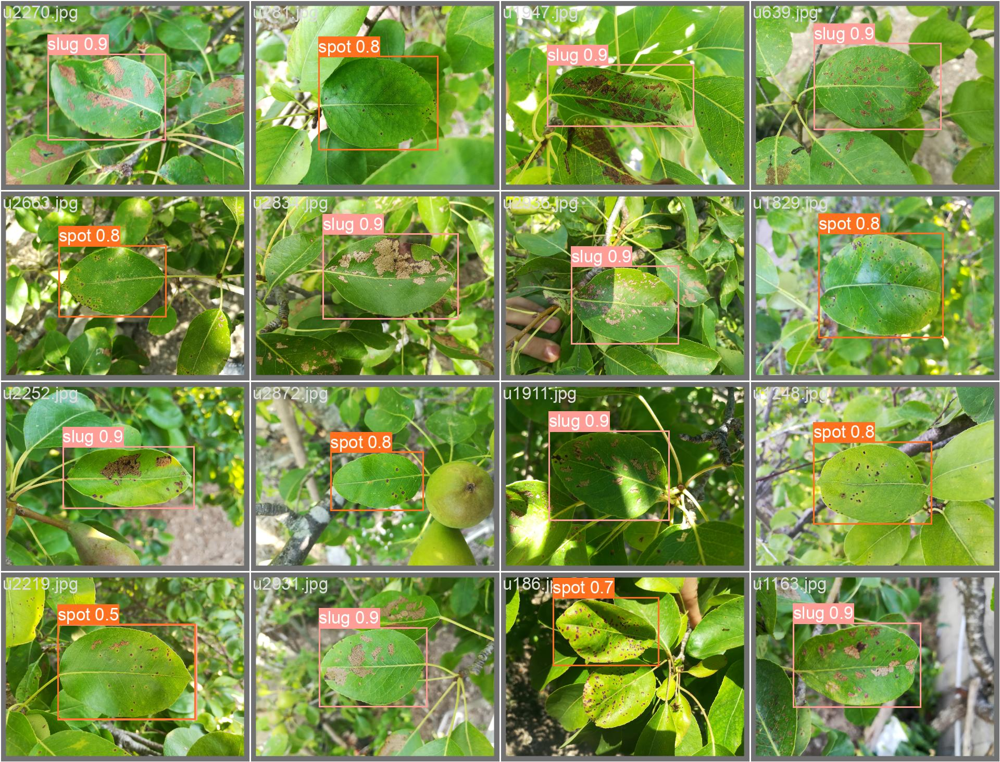

In [ ]:
Image.open(f'{best_model.save_dir}/val_batch2_pred.jpg')

## Optimisation - Convert model to OpenVino IR

In [ ]:
best_model_dir= f'{RUNS_DIR}/grid-opt'

In [ ]:
# Evaluate best model on test split
best_grid_model = YOLO(f'{best_model_dir}/weights/best.pt', task='detect')
# best_grid_model.to(device)
label_map = best_grid_model.names
label_map

{0: 'curl', 1: 'slug', 2: 'spot'}

In [ ]:
# Convert model to OpenVino format

OPENVINO_PATH = Path(f'{best_model_dir}/weights/best_openvino_model/best.xml')

if not OPENVINO_PATH.exists():
    best_grid_model.export(format="openvino", dynamic=True, half=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'yolov8-pear-experiments/grid-opt/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (21.5 MB)

ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 1.7s, saved as 'yolov8-pear-experiments/grid-opt/weights/best.onnx' (42.5 MB)

OpenVINO: starting export with openvino 2023.2.0-13089-cfd42bd2cb0-HEAD...
OpenVINO: export success ✅ 1.7s, saved as 'yolov8-pear-experiments/grid-opt/weights/best_openvino_model/' (42.7 MB)

Export complete (5.4s)
Results saved to /content/drive/MyDrive/yolo/yolov8-pear-experiments/grid-opt/weights
Predict:         yolo predict task=detect model=yolov8-pear-experiments/grid-opt/weights/best_openvino_model imgsz=640  
Validate:        yolo val task=detect model=yolov8-pear-experiments/grid-opt/weights/best_openvino_mo

### Select inference device

In [ ]:
import openvino as ov

core = ov.Core()
devices = core.available_devices
devices

['CPU']

### Test on a single image

In [ ]:
import random
from utils.ov_utils import compile_ovmodel, test_ov_model, print_stats
from utils.yolo_pipeline import YoloPipeline, draw_results

In [ ]:
# Load the best openvino model
ov_model = core.read_model(OPENVINO_PATH)
# compiled the model
compiled_model =  compile_ovmodel(ov_model, core, devices[0])

In [ ]:
IMAGE_PATH = random.choice(glob.glob(f'{OUT_DIR}/Pear/test/images/*.jpg'))
detector = YoloPipeline(ov_model=compiled_model, path=IMAGE_PATH, device=devices[0],
                        labels=label_map)

Image u1113.jpg


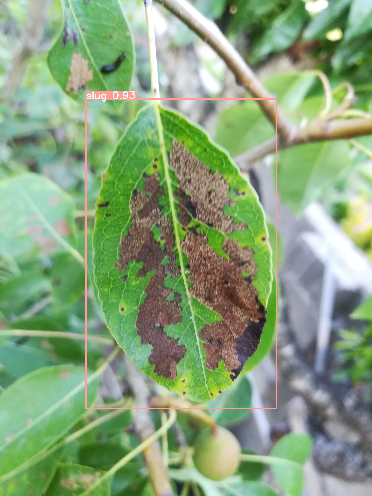

In [ ]:
input_, detections_, time = detector.detect()
image = draw_results(detections_[0], input_, label_map)
image = Image.fromarray(image)
print(f"Image {IMAGE_PATH.split('/')[-1]}")
image.resize((int(image.size[0]/8),int(image.size[1]/8)), 0)

In [ ]:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

### Configure Validator helper and create DataLoader

The original model repository uses a `Validator` wrapper, which represents the accuracy
validation pipeline. It creates dataloader and evaluation metrics and updates metrics on each data batch produced by the dataloader. Besides, that, it is responsible for data preprocessing and results postprocessing. For class initialization, the configuration should be provided. We will use the default setup, but it can be replaced with some parameters overriding to test on custom data. The model has connected the `ValidatorClass` method, which creates a validator class instance

In [ ]:
from ultralytics.utils import DEFAULT_CFG
from ultralytics.cfg import get_cfg
from ultralytics.data.utils import check_det_dataset
from ultralytics.models.yolo.detect import DetectionValidator

args = get_cfg(cfg=DEFAULT_CFG)
args.data = CFG_PATH

In [ ]:
# Get the validator
validator = DetectionValidator(args=args)
validator.data = check_det_dataset(args.data)
# here define the validator stride
validator.stride = 32

In [ ]:
# validator.names = best_model.model.names
validator.is_coco = False
validator.names = best_grid_model.names
validator.metrics.names = validator.names
# validator.nc = torch.tensor(best_model.model.model[-1].nc, dtype=torch.int8)
validator.nc = len(best_grid_model.names)

In [ ]:
# build the validation dataloader
pred_dataloader = validator.get_dataloader(f'{OUT_DIR}/Pear/val', batch_size=1)

val: Scanning ../datasets/Pear/val/labels.cache... 415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 415/415 [00:00<?, ?it/s]


In [ ]:
NUM_TEST_SAMPLES = len(pred_dataloader)

In [ ]:
fp_det_stats = test_ov_model(ov_model, core, pred_dataloader, validator,
                             num_samples=NUM_TEST_SAMPLES, device=devices[0])

  0%|          | 0/415 [00:00<?, ?it/s]

In [ ]:
print_stats(fp_det_stats, validator.seen, validator.nt_per_class.sum())

Boxes:
               Class      Images      Labels   Precision      Recall      mAP@.5  mAP@.5:.95
                 all         415         417       0.824       0.928       0.939       0.779




The result best model on the validation dataset with not OpenVINO Transformation are showed below:

- The model in openvino format dino affected the validation result

---


| Class | Images | Instances | Box(P) | Box (R) | Box mAP50 | Box mAP50-95 |
|-------|--------|-----------|--------|---------|-----------|--------------|
| all   | 415    | 417       | 0.898  | 0.887   | 0.941     | 0.771        |


## Optimize OV model using NNCF Post-training Quantization API

From [NNCF](https://github.com/openvinotoolkit/nncf) an 8-bit quantization Neural Networks
inference optimization in OpenVINO  will be used with a minimal accuracy drop.
The original model with was obtained after the parameter grid search and then converted to OpenVINO format. The performance of the model will be evaluated on the test set.

2. Run `nncf.quantize` for getting an optimized model.
3. Serialize OpenVINO IR model, using the `openvino.runtime.serialize` function.

In [ ]:
def transform_fn(data_item):
    """
    Extracts and preprocess input data from dataloader item for quantization.
    Parameters:
       data_item: Dict with data item produced by DataLoader during iteration
    Returns:
        input_tensor: Input data for quantization
    """
    input_tensor = validator.preprocess(data_item)['img'].numpy()

    return input_tensor

In [ ]:
import nncf
# Create the dataset for quantization
quantization_dataset = nncf.Dataset(pred_dataloader, transform_fn)

The `nncf.quantize` function provides an interface for model quantization. It requires an instance of the OpenVINO Model and quantization dataset.
YOLOv8 model contains non-ReLU activation functions, which require asymmetric quantization of activations.
`mixed` quantization will be used as recommended by OPENVINO which provides symmetric quantization of weights and asymmetric quantization of activations.

In [ ]:
ignored_scope = nncf.IgnoredScope(
    types=["Multiply", "Subtract", "Sigmoid"],  # ignore operations
    names=[
        "/model.22/dfl/conv/Conv",           # in the post-processing subgraph
        "/model.22/Add",
        "/model.22/Add_1",
        "/model.22/Add_2",
        "/model.22/Add_3",
        "/model.22/Add_4",
        "/model.22/Add_5",
        "/model.22/Add_6",
        "/model.22/Add_7",
        "/model.22/Add_8",
        "/model.22/Add_9",
        "/model.22/Add_10"])
# Detection model
quantized_det_model = nncf.quantize(ov_model, quantization_dataset,
                                    preset=nncf.QuantizationPreset.MIXED,
                                    ignored_scope=ignored_scope)

INFO:nncf:12 ignored nodes were found by name in the NNCFGraph
INFO:nncf:9 ignored nodes were found by types in the NNCFGraph
INFO:nncf:Not adding activation input quantizer for operation: 124 /model.22/Sigmoid
INFO:nncf:Not adding activation input quantizer for operation: 151 /model.22/dfl/conv/Conv
INFO:nncf:Not adding activation input quantizer for operation: 173 /model.22/Sub
INFO:nncf:Not adding activation input quantizer for operation: 174 /model.22/Add_10
INFO:nncf:Not adding activation input quantizer for operation: 189 /model.22/Sub_1
INFO:nncf:Not adding activation input quantizer for operation: 214 /model.22/Mul_5


Output()

Output()

In [ ]:
from openvino.runtime import serialize
int8_model_det_path = Path(f'{best_model_dir}/weights/yolov8_openvino_int8_model/quantized_best_model.xml')

if not int8_model_det_path.exists():
    print(f"Quantized detection model will be saved to {int8_model_det_path}")
serialize(quantized_det_model, int8_model_det_path)

### Validate Quantized model inference

`nncf.quantize` returns the OpenVINO Model class instance, which is suitable for loading on a device for making predictions. `INT8` model input data and output result formats have no difference from the floating point model representation. Therefore, we can reuse the same `detect` function defined above for getting the `INT8` model result on the image.

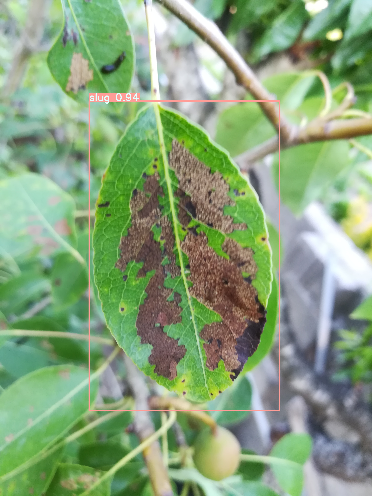

In [ ]:
# test quantized model on an image
quantized_det_compiled_model = compile_ovmodel(quantized_det_model, core, devices[0])

detector.ov_model = quantized_det_compiled_model
input_, detections_, time = detector.detect()
image_with = draw_results(detections_[0], input_, label_map)
image = Image.fromarray(image_with)
image.resize((int(image.size[0]/8),int(image.size[1]/8)), 0)

### Compare the Best YOLO, Best OpenVino-YOLO and the Quantized-YOLO Models

#### Validate quantized model accuracy

As we can see, there is no significant difference between `INT8` and float model result in a single image test. To understand how quantization influences model prediction precision, we can compare model accuracy on a dataset.

In [ ]:
int8_det_stats = test_ov_model(quantized_det_model, core, pred_dataloader, validator,
                      num_samples=NUM_TEST_SAMPLES, device=devices[0])

  0%|          | 0/415 [00:00<?, ?it/s]

In [ ]:
# Prepare test loader
test_dataloader = validator.get_dataloader(f'{OUT_DIR}/Pear/test', batch_size=1)

val: Scanning ../datasets/Pear/test/labels... 178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 178/178 [00:28<00:00,  6.25it/s]


val: New cache created: ../datasets/Pear/test/labels.cache


In [ ]:
TEST_SAMPLES = len(test_dataloader)

In [ ]:
fp_det_test_stats = test_ov_model(ov_model, core, test_dataloader, validator,
                             num_samples=TEST_SAMPLES, device=devices[0])

  0%|          | 0/178 [00:00<?, ?it/s]

In [ ]:
int8_det_test_stats = test_ov_model(quantized_det_model, core, test_dataloader, validator,
                      num_samples=TEST_SAMPLES, device=devices[0])

  0%|          | 0/178 [00:00<?, ?it/s]

In [ ]:
print("FP32 model accuracy")
print_stats(fp_det_test_stats, validator.seen, validator.nt_per_class.sum())

print("INT8 model accuracy")
print_stats(int8_det_test_stats, validator.seen, validator.nt_per_class.sum())

FP32 model accuracy
Boxes:
               Class      Images      Labels   Precision      Recall      mAP@.5  mAP@.5:.95
                 all         178         180        0.77       0.943       0.874       0.717
INT8 model accuracy
Boxes:
               Class      Images      Labels   Precision      Recall      mAP@.5  mAP@.5:.95
                 all         178         180       0.774        0.95       0.876       0.715


In [ ]:
test_eval = best_grid_model.val(task='detect', split='test', name=f'{RUNS_DIR}/grid-opt/test',
                                exist_ok=True)

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.20GHz)


val: Scanning /content/drive/MyDrive/datasets/Pear/test/labels.cache... 178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 178/178 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [01:05<00:00,  5.48s/it]


                   all        178        180      0.819      0.864      0.876      0.701
                  curl        178          4      0.733       0.75      0.787      0.364
                  slug        178        123       0.95      0.918       0.97      0.924
                  spot        178         53      0.775      0.925      0.871      0.815
Speed: 0.6ms preprocess, 175.1ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /content/drive/MyDrive/yolo/yolov8-pear-experiments/grid-opt/test


### Run Live Object Detection

`source=0` for using a camera ( 0 for the primary camera and then  the number will be assigned as a consecutive number).
Set `flip=True` when using a front-facing camera.
If you experience flickering, set `use_popup=True`.


In [ ]:
from utils.video_detection import yolo_video_track, ov_video_object_detection

In [ ]:
WEBCAM_INFERENCE = False

if WEBCAM_INFERENCE:
    VIDEO_SOURCE = 0  # Webcam
else:
    VIDEO_SOURCE = "videos/pear-video.mov"


In [ ]:
# Initialized the model in the YOLOPipeline with an openvino model
detector.ov_model=quantized_det_compiled_model

---

For live detection on the Openvino and Quatized YOLOv8 models run the code below

---

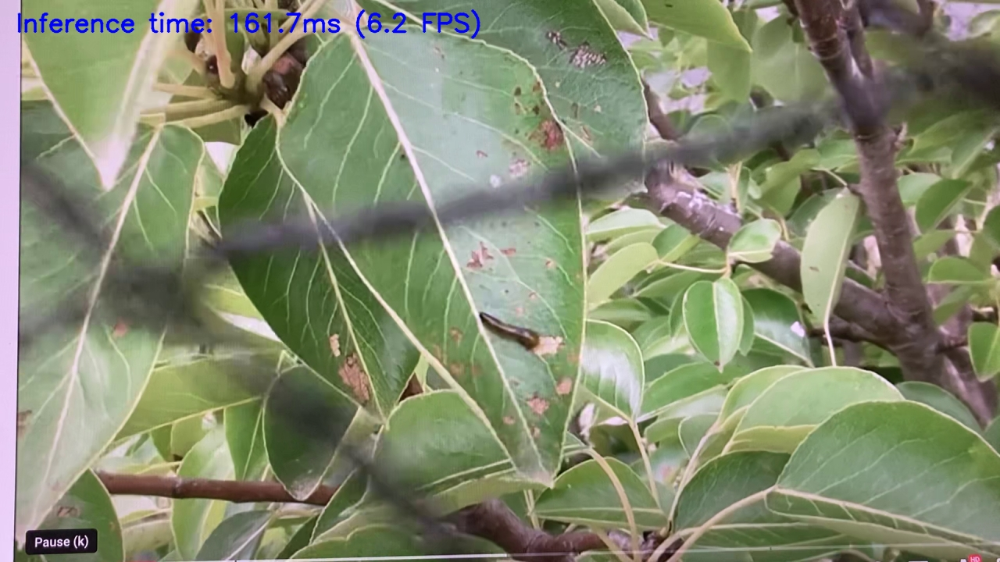

Source ended


In [ ]:
# Run object detection in openvino models
ov_video_object_detection(source=VIDEO_SOURCE, flip=False, use_popup=False, skip_first_frames=0,
                           detector=detector,  labels=label_map)

---

For live detection on the less efficent YOLOv8 model run the code below:

---
>**Note**: Re-initialized the best model obtained from the hyperparameters search if needed:

``best_model = YOLO('/path/to/best_model.pt')``


In [ ]:

yolo_video_track(source=VIDEO_SOURCE, yolo_model=best_model)